# Cleaning and Feature Engineering

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
plt.style.use('ggplot')
import plotly.express as px
import seaborn as sns
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import warnings
warnings.filterwarnings('ignore')
import copy

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [2]:
def get_unique_values(df):
    for i in df.columns:
        print(i,set(np.unique(df[i])),'\n')
        
def type_(x):
    if len(x) == 0:
        t = 'Numerical'
    elif len(x) == 2:
        t = 'Binary Categorical'
    else:
        t = 'Categorical' 
    return t


################################################################# Data Dictionary For Housing Data


housing_dict = pd.read_csv('./data/data_description.txt',
                   sep="\n|:",
                   header=None,
                   engine='python')

housing_dict.columns = ['var','descr']

new_housing_dict = housing_dict.loc[~housing_dict['descr'].isnull()]

new_housing_dict.loc[0:,'index_'] = new_housing_dict.index

idx = new_housing_dict['index_'].to_numpy()
i = 0
indx_outcomes = []
while (i < len(idx)-1):
    indx_outcomes.append(np.arange(idx[i]+1,idx[i+1]))
    i += 1

associated_outcomes = []
for j in indx_outcomes:
    associated_outcomes.append(housing_dict[['var']].loc[j].to_numpy())
    
associated_outcomes.append(np.array([])) #append an empty array to fix length issue

associated_outcomes = pd.Series(associated_outcomes).\
                        apply(lambda outcome_set: [i[0] for i in outcome_set]).to_numpy()



new_housing_dict.loc[0:,'associated_outcomes'] = associated_outcomes
new_housing_dict = new_housing_dict.reset_index()
new_housing_dict = new_housing_dict.drop(['index','index_'], axis = 1)


types = [type_(elem) for elem in new_housing_dict['associated_outcomes']]
new_housing_dict.loc[0:,'Variable Type'] = types

housing_dict = new_housing_dict

def ghd():
    return(housing_dict.sort_values(by = "var"))

# Reading in Housing Data

In [3]:
housing = pd.read_csv('./data/Ames_Housing_Price_Data.csv')
housing.rename(columns = {'PID':'MapRefNo'}, inplace = True) # renaming to later merge res and housing on this column
housing = housing.drop('Unnamed: 0', axis = 1)
housing.shape

(2580, 81)

In [4]:
housing.head()

,MapRefNo,GrLivArea,SalePrice,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,909176150,856,126000,30,RL,NaN,7890,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,SWISU,Norm,Norm,1Fam,1Story,6,6,1939,1950,Gable,CompShg,Wd Sdng,Wd Sdng,None,0.0,TA,TA,CBlock,TA,TA,No,Rec,238.0,Unf,0.0,618.0,856.0,GasA,TA,Y,SBrkr,856,0,0,1.0,0.0,1,0,2,1,TA,4,Typ,1,Gd,Detchd,1939.0,Unf,2.0,399.0,TA,TA,Y,0,0,0,0,166,0,NaN,NaN,NaN,0,3,2010,WD,Normal
1,905476230,1049,139500,120,RL,42.0,4235,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,TwnhsE,1Story,5,5,1984,1984,Gable,CompShg,HdBoard,HdBoard,BrkFace,149.0,Gd,TA,CBlock,Gd,TA,Mn,GLQ,552.0,ALQ,393.0,104.0,1049.0,GasA,TA,Y,SBrkr,1049,0,0,1.0,0.0,2,0,2,1,Gd,5,Typ,0,NaN,Attchd,1984.0,Fin,1.0,266.0,TA,TA,Y,0,105,0,0,0,0,NaN,NaN,NaN,0,2,2009,WD,Normal
2,911128020,1001,124900,30,C (all),60.0,6060,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,IDOTRR,Norm,Norm,1Fam,1Story,5,9,1930,2007,Hip,CompShg,MetalSd,MetalSd,None,0.0,Gd,TA,BrkTil,TA,TA,No,ALQ,737.0,Unf,0.0,100.0,837.0,GasA,Ex,Y,SBrkr,1001,0,0,0.0,0.0,1,0,2,1,Gd,5,Typ,0,NaN,Detchd,1930.0,Unf,1.0,216.0,TA,Po,N,154,0,42,86,0,0,NaN,NaN,NaN,0,11,2007,WD,Normal
3,535377150,1039,114000,70,RL,80.0,8146,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,OldTown,Norm,Norm,1Fam,2Story,4,8,1900,2003,Gable,CompShg,MetalSd,MetalSd,None,0.0,Gd,Gd,BrkTil,Fa,TA,No,Unf,0.0,Unf,0.0,405.0,405.0,GasA,Gd,Y,SBrkr,717,322,0,0.0,0.0,1,0,2,1,TA,6,Typ,0,NaN,Detchd,1940.0,Unf,1.0,281.0,TA,TA,N,0,0,168,0,111,0,NaN,NaN,NaN,0,5,2009,WD,Normal
4,534177230,1665,227000,60,RL,70.0,8400,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,2Story,8,6,2001,2001,Gable,CompShg,VinylSd,VinylSd,None,0.0,Gd,TA,PConc,Gd,TA,No,GLQ,643.0,Unf,0.0,167.0,810.0,GasA,Ex,Y,SBrkr,810,855,0,1.0,0.0,2,1,3,1,Gd,6,Typ,0,NaN,Attchd,2001.0,Fin,2.0,528.0,TA,TA,Y,0,45,0,0,0,0,NaN,NaN,NaN,0,11,2009,WD,Normal


In [593]:
set(housing['YrSold'])

{2006, 2007, 2008, 2009, 2010}

# Reading in Real Estate Data

In [5]:
res = pd.read_csv('./data/Ames_Real_Estate_Data.csv')
res.shape

dd_res = pd.read_excel('./data/Tbl_DataExportSpec.xls')
dd_res.shape

(100, 7)

In [600]:
list(np.unique(res['YrSold_YYYY']))[:4]

[2017.0, 2018.0, 2019.0, 2020.0]

## **Note: res columns (36,40,81,87) have mixed data types**

# Dealing with Nulls

In [6]:
data = housing.copy()

nan_counts = pd.DataFrame(data.isnull().sum()).T
nan_counts

,MapRefNo,GrLivArea,SalePrice,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,0,0,0,0,0,462,0,0,2412,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,14,14,0,0,0,69,69,71,69,1,70,1,1,1,0,0,0,1,0,0,0,2,2,0,0,0,0,0,0,0,0,1241,127,129,129,1,1,129,129,0,0,0,0,0,0,0,2571,2055,2483,0,0,0,0,0


In [7]:
high_null_cols = ["Alley", "FireplaceQu", "PoolQC",
                  "Fence", "MiscFeature"] # columns with too many nulls

data = data.drop(high_null_cols,axis = 1)


nan_counts = pd.DataFrame(data.isnull().sum()).T
nan_counts = nan_counts.iloc[:,[i for i,j in enumerate(nan_counts.loc[0].to_list()) if j != 0]]

nan_counts

,LotFrontage,MasVnrType,MasVnrArea,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Electrical,BsmtFullBath,BsmtHalfBath,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond
0,462,14,14,69,69,71,69,1,70,1,1,1,1,2,2,127,129,129,1,1,129,129


In [8]:
data = data.drop('LotFrontage',axis = 1)

### Rows in train and test sets that could contain a null

In [9]:
len(data.loc[data.isna().any(axis = 1)]),len(data)

(204, 2580)

### Not that many rows contain nulls is either set so we'll just drop them for simplicity 

In [10]:
data_nulls = data.loc[data.isna().any(axis = 1)]
print(data_nulls.index)
data = data.drop(data_nulls.index,axis = 0)
data.loc[data.isna().any(axis = 1)]

Int64Index([   5,   17,   22,   44,   48,   50,   54,   60,   93,   96,
            ...
            2464, 2465, 2477, 2481, 2488, 2513, 2536, 2540, 2546, 2576],
           dtype='int64', length=204)


,MapRefNo,GrLivArea,SalePrice,MSSubClass,MSZoning,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition


# Categoricals

In [11]:
dc = ghd()
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[3,0]

dc.loc[dc['Variable Type'] != 'Numerical'].iloc[3,1]

dc.loc[dc['Variable Type'] != 'Numerical'].iloc[3,2]

[s[0:s.find(' ')] for s in dc.loc[dc['Variable Type'] != 'Numerical'].iloc[3,2]]

im = dict(zip([s[0:s.find(' ')] for s in dc.loc[dc['Variable Type'] != 'Numerical'].iloc[3,2]],[4,3,2,1,0]))
print(set(data.loc[:,'BsmtExposure']))
print(im)
data.loc[:,'BsmtExposure'] = data['BsmtExposure'].apply(lambda x:im[x])
print(set(data.loc[:,'BsmtExposure']))

data.loc[:,'BsmtExposure'].value_counts().to_dict()

{'Mn', 'Gd', 'No', 'Av'}
{'Gd': 4, 'Av': 3, 'Mn': 2, 'No': 1, 'NA': 0}
{1, 2, 3, 4}


{1: 1603, 3: 329, 4: 236, 2: 208}

In [12]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[2,0]

dc.loc[dc['Variable Type'] != 'Numerical'].iloc[2,1]

dc.loc[dc['Variable Type'] != 'Numerical'].iloc[2,2]

im = {'Po':1,'Fa':2,'TA':3,'Gd':4,'Ex':5}
print(set(data.loc[:,'BsmtCond']))
data.loc[:,'BsmtCond'] = data['BsmtCond'].apply(lambda x:im[x])
print(im)
print(set(data.loc[:,'BsmtCond']))

{'Ex', 'Gd', 'Fa', 'TA'}
{'Po': 1, 'Fa': 2, 'TA': 3, 'Gd': 4, 'Ex': 5}
{2, 3, 4, 5}


In [13]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[4,0]

dc.loc[dc['Variable Type'] != 'Numerical'].iloc[4,1]

dc.loc[dc['Variable Type'] != 'Numerical'].iloc[4,2]

im = dict(zip([s[0:s.find(' ')] for s in dc.loc[dc['Variable Type'] != 'Numerical'].iloc[4,2]],[6,5,4,3,2,1,0]))
print(set(data.loc[:,'BsmtFinType1']))
print(im)
data.loc[:,'BsmtFinType1'] = data['BsmtFinType1'].apply(lambda x:im[x])
print(set(data.loc[:,'BsmtFinType1']))

{'BLQ', 'LwQ', 'Unf', 'GLQ', 'Rec', 'ALQ'}
{'GLQ': 6, 'ALQ': 5, 'BLQ': 4, 'Rec': 3, 'LwQ': 2, 'Unf': 1, 'NA': 0}
{1, 2, 3, 4, 5, 6}


In [14]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[5,0]

dc.loc[dc['Variable Type'] != 'Numerical'].iloc[5,1]

dc.loc[dc['Variable Type'] != 'Numerical'].iloc[5,2]

im = dict(zip([s[0:s.find(' ')] for s in dc.loc[dc['Variable Type'] != 'Numerical'].iloc[5,2]],[6,5,4,3,2,1,0]))
print(set(data.loc[:,'BsmtFinType2']))
print(im)
data.loc[:,'BsmtFinType2'] = data['BsmtFinType2'].apply(lambda x:im[x])
print(set(data.loc[:,'BsmtFinType2']))

{'BLQ', 'LwQ', 'Unf', 'GLQ', 'Rec', 'ALQ'}
{'GLQ': 6, 'ALQ': 5, 'BLQ': 4, 'Rec': 3, 'LwQ': 2, 'Unf': 1, 'NA': 0}
{1, 2, 3, 4, 5, 6}


In [15]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[6,0]

dc.loc[dc['Variable Type'] != 'Numerical'].iloc[6,1]

dc.loc[dc['Variable Type'] != 'Numerical'].iloc[6,2]

im = dict(zip([s[0:s.find(' ')] for s in dc.loc[dc['Variable Type'] != 'Numerical'].iloc[6,2]],[5,4,3,2,1,0]))
print(set(data.loc[:,'BsmtQual']))
print(im)
data.loc[:,'BsmtQual'] = data['BsmtQual'].apply(lambda x:im[x])
print(set(data.loc[:,'BsmtQual']))

{'Po', 'Ex', 'TA', 'Fa', 'Gd'}
{'Ex': 5, 'Gd': 4, 'TA': 3, 'Fa': 2, 'Po': 1, 'NA': 0}
{1, 2, 3, 4, 5}


In [16]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[7,0]

dc.loc[dc['Variable Type'] != 'Numerical'].iloc[7,1]

dc.loc[dc['Variable Type'] != 'Numerical'].iloc[7,2]

im = dict(zip([s[0:s.find(' ')] for s in dc.loc[dc['Variable Type'] != 'Numerical'].iloc[7,2]],[0,1]))
print(set(data.loc[:,'CentralAir']))
print(im)
data.loc[:,'CentralAir'] = data['CentralAir'].apply(lambda x:im[x])
print(set(data.loc[:,'CentralAir']))

{'Y', 'N'}
{'N': 0, 'Y': 1}
{0, 1}


In [17]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[11,0]

dc.loc[dc['Variable Type'] != 'Numerical'].iloc[11,1]

dc.loc[dc['Variable Type'] != 'Numerical'].iloc[11,2]

im = dict(zip([s[0:s.find(' ')] for s in dc.loc[dc['Variable Type'] != 'Numerical'].iloc[11,2]],[5,4,3,2,1]))
print(set(data.loc[:,'ExterCond']))
print(im)
data.loc[:,'ExterCond'] = data['ExterCond'].apply(lambda x:im[x])
print(set(data.loc[:,'ExterCond']))

{'Po', 'Ex', 'TA', 'Fa', 'Gd'}
{'Ex': 5, 'Gd': 4, 'TA': 3, 'Fa': 2, 'Po': 1}
{1, 2, 3, 4, 5}


In [18]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[12,0]

dc.loc[dc['Variable Type'] != 'Numerical'].iloc[12,1]

dc.loc[dc['Variable Type'] != 'Numerical'].iloc[12,2]

im = dict(zip([s[0:s.find(' ')] for s in dc.loc[dc['Variable Type'] != 'Numerical'].iloc[12,2]],[5,4,3,2,1]))
print(set(data.loc[:,'ExterQual']))
print(im)
data.loc[:,'ExterQual'] = data['ExterQual'].apply(lambda x:im[x])
print(set(data.loc[:,'ExterQual']))

{'Ex', 'Gd', 'Fa', 'TA'}
{'Ex': 5, 'Gd': 4, 'TA': 3, 'Fa': 2, 'Po': 1}
{2, 3, 4, 5}


In [19]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[18,0]

dc.loc[dc['Variable Type'] != 'Numerical'].iloc[18,1]

dc.loc[dc['Variable Type'] != 'Numerical'].iloc[18,2]

im = dict(zip([s[0:s.find(' ')] for s in dc.loc[dc['Variable Type'] != 'Numerical'].iloc[18,2]],[8,7,6,5,4,3,2,1]))
print(set(data.loc[:,'Functional']))
print(im)
data.loc[:,'Functional'] = data['Functional'].apply(lambda x:im[x])
print(set(data.loc[:,'Functional']))

{'Sal', 'Min1', 'Mod', 'Min2', 'Maj2', 'Maj1', 'Typ'}
{'Typ': 8, 'Min1': 7, 'Min2': 6, 'Mod': 5, 'Maj1': 4, 'Maj2': 3, 'Sev': 2, 'Sal': 1}
{1, 3, 4, 5, 6, 7, 8}


In [20]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[19,0]

dc.loc[dc['Variable Type'] != 'Numerical'].iloc[19,1]

dc.loc[dc['Variable Type'] != 'Numerical'].iloc[19,2]

im = dict(zip([s[0:s.find(' ')] for s in dc.loc[dc['Variable Type'] != 'Numerical'].iloc[19,2]],[5,4,3,2,1,0]))
print(set(data.loc[:,'GarageCond']))
print(im)
data.loc[:,'GarageCond'] = data['GarageCond'].apply(lambda x:im[x])
print(set(data.loc[:,'GarageCond']))

{'Po', 'Ex', 'TA', 'Fa', 'Gd'}
{'Ex': 5, 'Gd': 4, 'TA': 3, 'Fa': 2, 'Po': 1, 'NA': 0}
{1, 2, 3, 4, 5}


In [21]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[20,0]

dc.loc[dc['Variable Type'] != 'Numerical'].iloc[20,1]

dc.loc[dc['Variable Type'] != 'Numerical'].iloc[20,2]

im = dict(zip([s[0:s.find(' ')] for s in dc.loc[dc['Variable Type'] != 'Numerical'].iloc[20,2]],[3,2,1,0]))
print(set(data.loc[:,'GarageFinish']))
print(im)
data.loc[:,'GarageFinish'] = data['GarageFinish'].apply(lambda x:im[x])
print(set(data.loc[:,'GarageFinish']))

{'Unf', 'Fin', 'RFn'}
{'Fin': 3, 'RFn': 2, 'Unf': 1, 'NA': 0}
{1, 2, 3}


In [22]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[21,0]

dc.loc[dc['Variable Type'] != 'Numerical'].iloc[21,1]

dc.loc[dc['Variable Type'] != 'Numerical'].iloc[21,2]

im = dict(zip([s[0:s.find(' ')] for s in dc.loc[dc['Variable Type'] != 'Numerical'].iloc[21,2]],[5,4,3,2,1,0]))
print(set(data.loc[:,'GarageQual']))
print(im)
data.loc[:,'GarageQual'] = data['GarageQual'].apply(lambda x:im[x])
print(set(data.loc[:,'GarageQual']))

{'Po', 'Ex', 'TA', 'Fa', 'Gd'}
{'Ex': 5, 'Gd': 4, 'TA': 3, 'Fa': 2, 'Po': 1, 'NA': 0}
{1, 2, 3, 4, 5}


In [23]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[26,0]

dc.loc[dc['Variable Type'] != 'Numerical'].iloc[26,1]

dc.loc[dc['Variable Type'] != 'Numerical'].iloc[26,2]

im = dict(zip([s[0:s.find(' ')] for s in dc.loc[dc['Variable Type'] != 'Numerical'].iloc[26,2]],[5,4,3,2,1]))
print(set(data.loc[:,'KitchenQual']))
print(im)
data.loc[:,'KitchenQual'] = data['KitchenQual'].apply(lambda x:im[x])
print(set(data.loc[:,'KitchenQual']))

{'Po', 'Ex', 'TA', 'Fa', 'Gd'}
{'Ex': 5, 'Gd': 4, 'TA': 3, 'Fa': 2, 'Po': 1}
{1, 2, 3, 4, 5}


In [24]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[28,0]

dc.loc[dc['Variable Type'] != 'Numerical'].iloc[28,1]

dc.loc[dc['Variable Type'] != 'Numerical'].iloc[28,2]

im = dict(zip([s[0:s.find(' ')] for s in dc.loc[dc['Variable Type'] != 'Numerical'].iloc[28,2]],[1,2,3]))
print(set(data.loc[:,'LandSlope']))
print(im)
data.loc[:,'LandSlope'] = data['LandSlope'].apply(lambda x:im[x])
print(set(data.loc[:,'LandSlope']))

{'Mod', 'Sev', 'Gtl'}
{'Gtl': 1, 'Mod': 2, 'Sev': 3}
{1, 2, 3}


In [25]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[30,0]

dc.loc[dc['Variable Type'] != 'Numerical'].iloc[30,1]

dc.loc[dc['Variable Type'] != 'Numerical'].iloc[30,2]

im = dict(zip([s[0:s.find(' ')] for s in dc.loc[dc['Variable Type'] != 'Numerical'].iloc[30,2]],[0,1,2,3]))
print(set(data.loc[:,'LotShape']))
print(im)
data.loc[:,'LotShape'] = data['LotShape'].apply(lambda x:im[x])
print(set(data.loc[:,'LotShape']))

{'IR2', 'IR3', 'Reg', 'IR1'}
{'Reg': 0, 'IR1': 1, 'IR2': 2, 'IR3': 3}
{0, 1, 2, 3}


In [26]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[31,0]

'MSSubClass'

In [27]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[31,1]

' Identifies the type of dwelling involved in the sale.'

In [28]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[31,2]

['20    1-STORY 1946 & NEWER ALL STYLES',
 '30    1-STORY 1945 & OLDER',
 '40    1-STORY W/FINISHED ATTIC ALL AGES',
 '45    1-1/2 STORY - UNFINISHED ALL AGES',
 '50    1-1/2 STORY FINISHED ALL AGES',
 '60    2-STORY 1946 & NEWER',
 '70    2-STORY 1945 & OLDER',
 '75    2-1/2 STORY ALL AGES',
 '80    SPLIT OR MULTI-LEVEL',
 '85    SPLIT FOYER',
 '90    DUPLEX - ALL STYLES AND AGES',
 '120    1-STORY PUD (Planned Unit Development) - 1946 & NEWER',
 '150    1-1/2 STORY PUD - ALL AGES',
 '160    2-STORY PUD - 1946 & NEWER',
 '180    PUD - MULTILEVEL - INCL SPLIT LEV/FOYER',
 '190    2 FAMILY CONVERSION - ALL STYLES AND AGES']

In [29]:
desc = dc.loc[dc['Variable Type'] != 'Numerical'].iloc[31,2]
desc = [i[i.find('    '):].strip() for i in desc]
print(desc)
im = dict(zip([int(s[0:s.find(' ')]) for s in dc.loc[dc['Variable Type'] != 'Numerical'].iloc[31,2]],desc))
print(set(data.loc[:,'MSSubClass']))
print(im)
data.loc[:,'MSSubClass'] = data['MSSubClass'].apply(lambda x:im[x])
print(set(data.loc[:,'MSSubClass']))

['1-STORY 1946 & NEWER ALL STYLES', '1-STORY 1945 & OLDER', '1-STORY W/FINISHED ATTIC ALL AGES', '1-1/2 STORY - UNFINISHED ALL AGES', '1-1/2 STORY FINISHED ALL AGES', '2-STORY 1946 & NEWER', '2-STORY 1945 & OLDER', '2-1/2 STORY ALL AGES', 'SPLIT OR MULTI-LEVEL', 'SPLIT FOYER', 'DUPLEX - ALL STYLES AND AGES', '1-STORY PUD (Planned Unit Development) - 1946 & NEWER', '1-1/2 STORY PUD - ALL AGES', '2-STORY PUD - 1946 & NEWER', 'PUD - MULTILEVEL - INCL SPLIT LEV/FOYER', '2 FAMILY CONVERSION - ALL STYLES AND AGES']
{160, 70, 40, 75, 45, 190, 80, 50, 20, 180, 85, 150, 120, 90, 60, 30}
{20: '1-STORY 1946 & NEWER ALL STYLES', 30: '1-STORY 1945 & OLDER', 40: '1-STORY W/FINISHED ATTIC ALL AGES', 45: '1-1/2 STORY - UNFINISHED ALL AGES', 50: '1-1/2 STORY FINISHED ALL AGES', 60: '2-STORY 1946 & NEWER', 70: '2-STORY 1945 & OLDER', 75: '2-1/2 STORY ALL AGES', 80: 'SPLIT OR MULTI-LEVEL', 85: 'SPLIT FOYER', 90: 'DUPLEX - ALL STYLES AND AGES', 120: '1-STORY PUD (Planned Unit Development) - 1946 & NEWER',

In [30]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[24,0]

'HeatingQC'

In [31]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[24,1]

' Heating quality and condition'

In [32]:
dc.loc[dc['Variable Type'] != 'Numerical'].iloc[24,2]

['Ex     Excellent',
 'Gd     Good',
 'TA     Average/Typical',
 'Fa     Fair',
 'Po     Poor']

In [33]:
im = dict(zip([s[0:s.find(' ')] for s in dc.loc[dc['Variable Type'] != 'Numerical'].iloc[24,2]],[5,4,3,2,1]))
print(set(data.loc[:,'HeatingQC']))
print(im)
data.loc[:,'HeatingQC'] = data['HeatingQC'].apply(lambda x:im[x])
print(set(data.loc[:,'HeatingQC']))

{'Po', 'Ex', 'TA', 'Fa', 'Gd'}
{'Ex': 5, 'Gd': 4, 'TA': 3, 'Fa': 2, 'Po': 1}
{1, 2, 3, 4, 5}


# **Making Dummy Variables**

In [34]:
dumb_data = pd.get_dummies(data.drop(['Street','SaleType','SaleCondition'],axis = 1))
dumb_data = pd.merge(dumb_data,data[['MapRefNo','Neighborhood']],on = 'MapRefNo') #getting the original Neighborhood Column Back
second_column = dumb_data.pop('Neighborhood')
dumb_data.insert(1, 'Neighborhood', second_column) # changing position of Neighborhood column

In [35]:
dummy_cats = []
MSSubClass_cats = list(dumb_data.columns[53:69])
dummy_cats.append(MSSubClass_cats)

MSZoning_cats = list(dumb_data.columns[69:75])
dummy_cats.append(MSZoning_cats)

LandContour_cats = list(dumb_data.columns[75:79])
dummy_cats.append(LandContour_cats)

Utilities_cats = list(dumb_data.columns[79:81])
dummy_cats.append(Utilities_cats)

LotConfig_cats = list(dumb_data.columns[81:86])
dummy_cats.append(LotConfig_cats)

Neighborhood_cats = list(dumb_data.columns[86:114])
dummy_cats.append(Neighborhood_cats)

Condition1_cats = list(dumb_data.columns[114:123])
dummy_cats.append(Condition1_cats)

Condition2_cats = list(dumb_data.columns[123:131])
dummy_cats.append(Condition2_cats)

BldgType_cats = list(dumb_data.columns[131:136])
dummy_cats.append(BldgType_cats)

HouseStyle_cats = list(dumb_data.columns[136:144])
dummy_cats.append(HouseStyle_cats)

RoofStyle_cats = list(dumb_data.columns[144:150])
dummy_cats.append(RoofStyle_cats)

RoofMatl_cats = list(dumb_data.columns[150:157])
dummy_cats.append(RoofMatl_cats)

Exterior1st_cats = list(dumb_data.columns[157:170])
dummy_cats.append(Exterior1st_cats)

Exterior2nd_cats = list(dumb_data.columns[170:185])
dummy_cats.append(Exterior2nd_cats)

MasVnrType_cats = list(dumb_data.columns[185:189])
dummy_cats.append(MasVnrType_cats)

Foundation_cats = list(dumb_data.columns[189:194])
dummy_cats.append(Foundation_cats)

Heating_cats = list(dumb_data.columns[194:198])
dummy_cats.append(Heating_cats)

Electrical_cats = list(dumb_data.columns[198:202])
dummy_cats.append(Electrical_cats)

GarageType_cats = list(dumb_data.columns[202:208])
dummy_cats.append(GarageType_cats)

PavedDrive_cats = list(dumb_data.columns[208:])
dummy_cats.append(PavedDrive_cats)

In [36]:
len(list(dumb_data.columns[53:]))

158

In [37]:
j = 0
for i in dummy_cats:
    j+= len(i)
j

158

In [38]:
def box_maykr(df,column_list,target_var,figsize):
    
    """
    function to make consecutive boxplots
    
    column list: list of dataframe columns in df to plot
    target_var: target variable in df to plot against 
    figsize: tuple to define the size of the figure
    
    """

    fig,axs = plt.subplots(int(np.ceil(len(column_list)/2)),2,figsize = figsize)
    plt.subplots_adjust(right = 1.5,top = 5)
    axs = axs.flatten()
    print('_'*125)
    print('_'*125)
    print(' '*50,column_list[0][:column_list[0].find('_')])
    print('_'*125)
    print('_'*125)
    for i, col in enumerate(column_list):
        sns.boxplot(x=col,y = target_var,ax=axs[i],data=df)
        axs[i].set_ylabel(f'{target_var}')
        axs[i].set_xlabel(f'{col}')
        axs[i].set_title(f'{target_var}  vs. {col}')
        print(df[col].value_counts())

    
    plt.show()   
    
fig_sizes = [(10,8),(10,4),(10,1),(10,2),(10,1),(10,4),
             (10,18),(10,6),(10,6),(10,4),(10,4),
             (10,4),(10,4),(10,8),(10,8),(10,2),
             (10,4),(10,4),(10,2),(10,4),(10,2),(10,6),(10,4)]

_____________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________
                                                   MSSubClass
_____________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________
0    2364
1      14
Name: MSSubClass_1-1/2 STORY - UNFINISHED ALL AGES, dtype: int64
0    2139
1     239
Name: MSSubClass_1-1/2 STORY FINISHED ALL AGES, dtype: int64
0    2377
1       1
Name: MSSubClass_1-1/2 STORY PUD - ALL AGES, dtype: int64
0    2285
1      93
Name: MSSubClass_1-STORY 1945 & OLDER, dtype: int64
0    1498
1     880
Name: MSSubClass_1-STORY 1946 & NEWER ALL STYLES, dtype: int64
0    2211
1     167
Name: MSSubClas

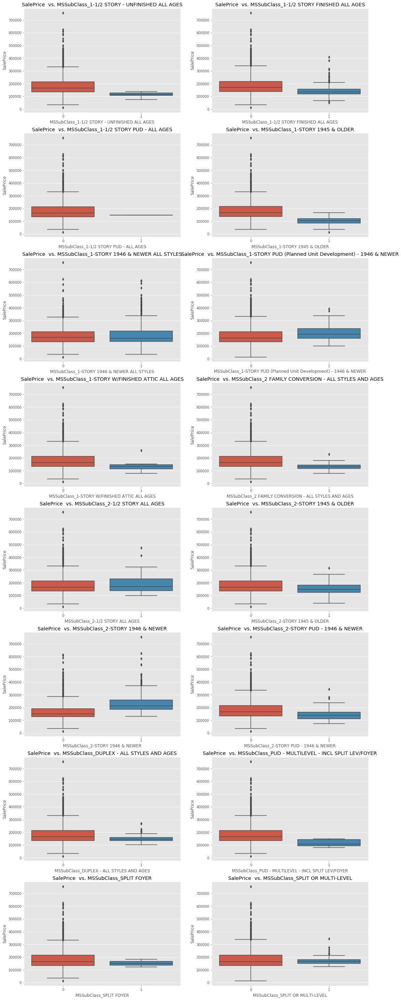

_____________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________
                                                   MSZoning
_____________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________
0    2367
1      11
Name: MSZoning_C (all), dtype: int64
0    2269
1     109
Name: MSZoning_FV, dtype: int64
0    2377
1       1
Name: MSZoning_I (all), dtype: int64
0    2361
1      17
Name: MSZoning_RH, dtype: int64
1    1876
0     502
Name: MSZoning_RL, dtype: int64
0    2014
1     364
Name: MSZoning_RM, dtype: int64


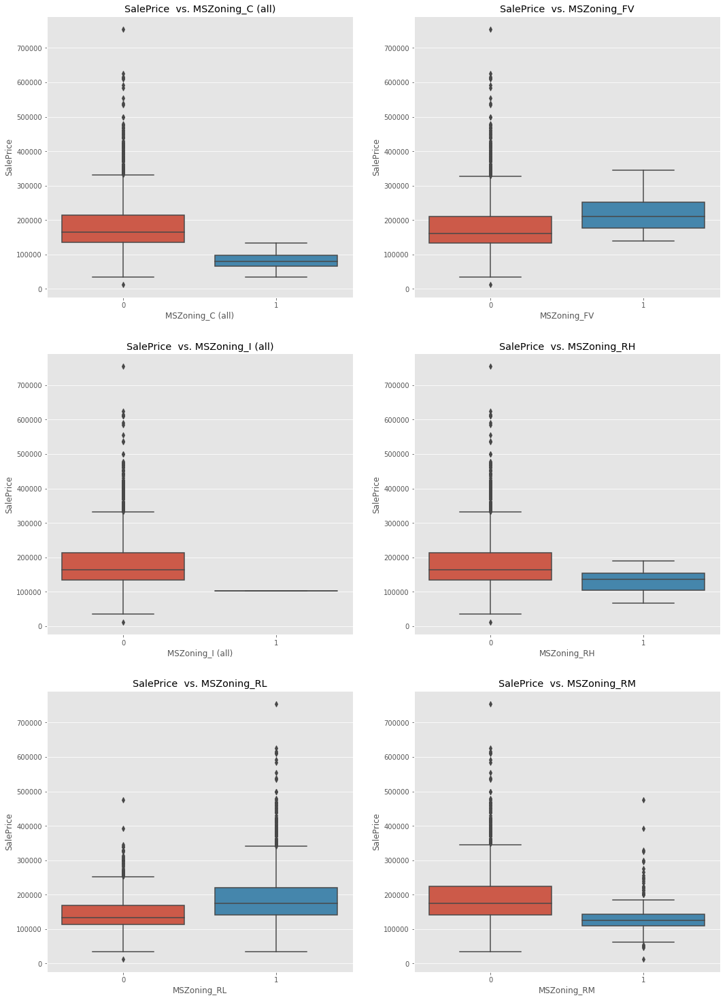

_____________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________
                                                   LandContour
_____________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________
0    2292
1      86
Name: LandContour_Bnk, dtype: int64
0    2284
1      94
Name: LandContour_HLS, dtype: int64
0    2330
1      48
Name: LandContour_Low, dtype: int64
1    2150
0     228
Name: LandContour_Lvl, dtype: int64


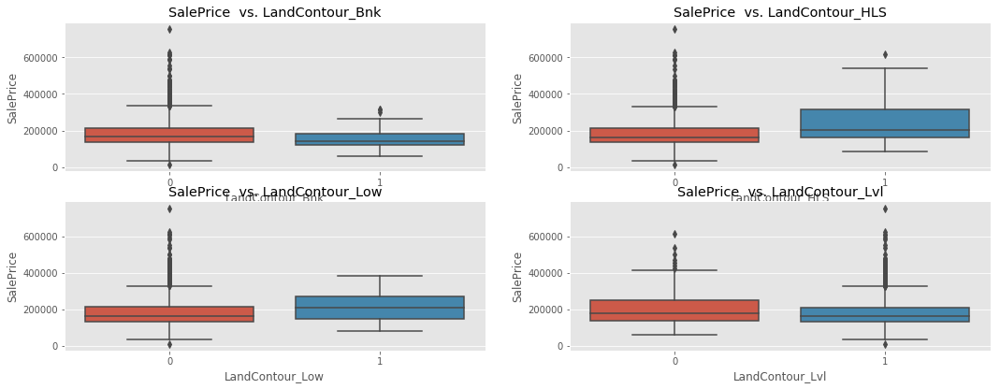

_____________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________
                                                   Utilities
_____________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________
1    2377
0       1
Name: Utilities_AllPub, dtype: int64
0    2377
1       1
Name: Utilities_NoSewr, dtype: int64


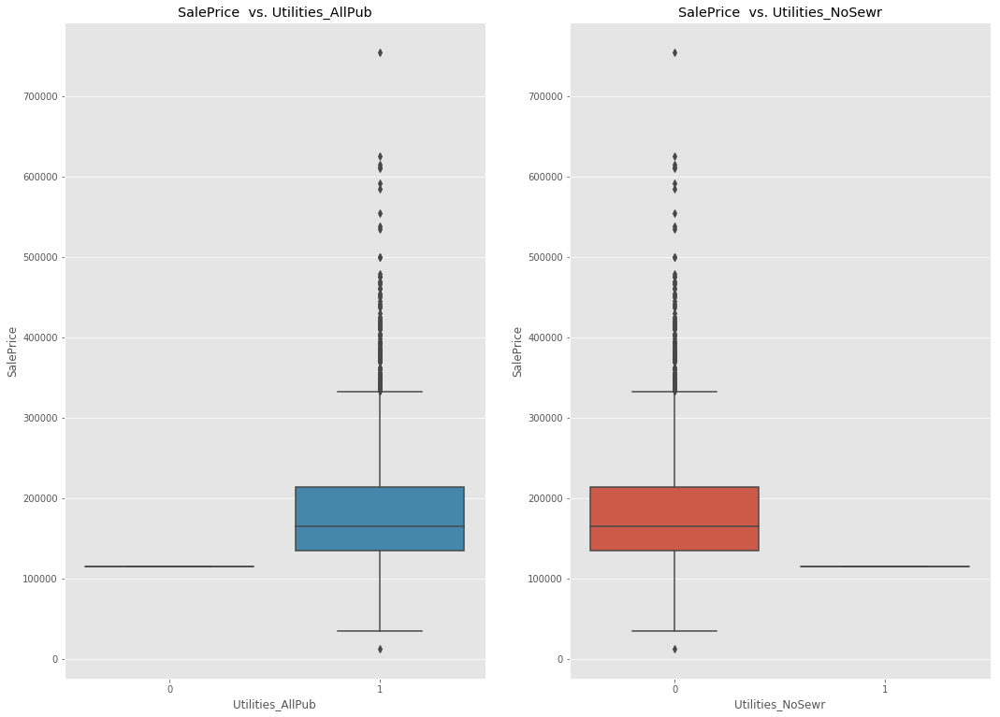

_____________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________
                                                   LotConfig
_____________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________
0    1972
1     406
Name: LotConfig_Corner, dtype: int64
0    2221
1     157
Name: LotConfig_CulDSac, dtype: int64
0    2306
1      72
Name: LotConfig_FR2, dtype: int64
0    2366
1      12
Name: LotConfig_FR3, dtype: int64
1    1731
0     647
Name: LotConfig_Inside, dtype: int64


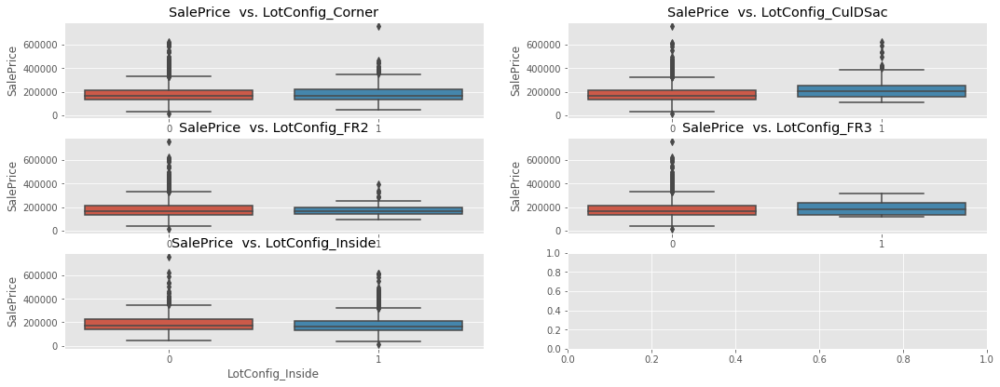

_____________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________
                                                   Neighborhood
_____________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________
0    2355
1      23
Name: Neighborhood_Blmngtn, dtype: int64
0    2368
1      10
Name: Neighborhood_Blueste, dtype: int64
0    2349
1      29
Name: Neighborhood_BrDale, dtype: int64
0    2289
1      89
Name: Neighborhood_BrkSide, dtype: int64
0    2340
1      38
Name: Neighborhood_ClearCr, dtype: int64
0    2147
1     231
Name: Neighborhood_CollgCr, dtype: int64
0    2284
1      94
Name: Neighborhood_Crawfor, dtype: int64
0    2

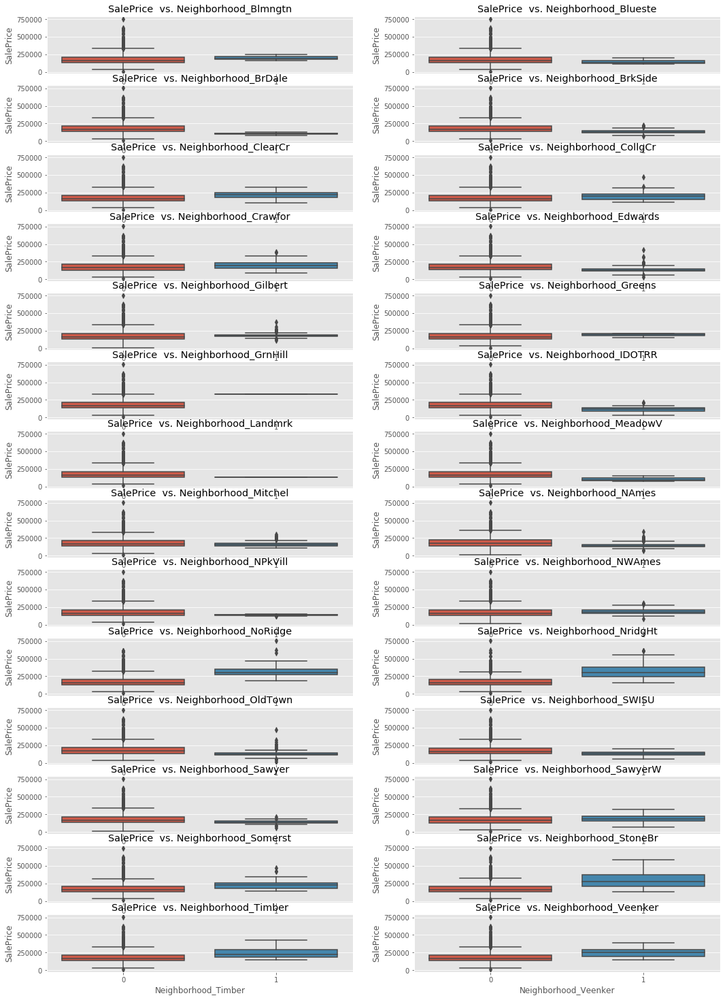

_____________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________
                                                   Condition1
_____________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________
0    2311
1      67
Name: Condition1_Artery, dtype: int64
0    2263
1     115
Name: Condition1_Feedr, dtype: int64
1    2069
0     309
Name: Condition1_Norm, dtype: int64
0    2360
1      18
Name: Condition1_PosA, dtype: int64
0    2341
1      37
Name: Condition1_PosN, dtype: int64
0    2356
1      22
Name: Condition1_RRAe, dtype: int64
0    2340
1      38
Name: Condition1_RRAn, dtype: int64
0    2374
1       4
Name: Condition1_RR

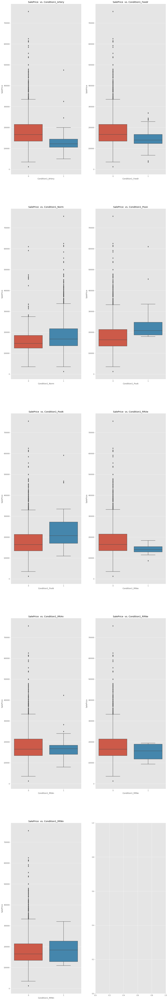

_____________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________
                                                   Condition2
_____________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________
0    2376
1       2
Name: Condition2_Artery, dtype: int64
0    2366
1      12
Name: Condition2_Feedr, dtype: int64
1    2354
0      24
Name: Condition2_Norm, dtype: int64
0    2375
1       3
Name: Condition2_PosA, dtype: int64
0    2375
1       3
Name: Condition2_PosN, dtype: int64
0    2377
1       1
Name: Condition2_RRAe, dtype: int64
0    2377
1       1
Name: Condition2_RRAn, dtype: int64
0    2376
1       2
Name: Condition2_RR

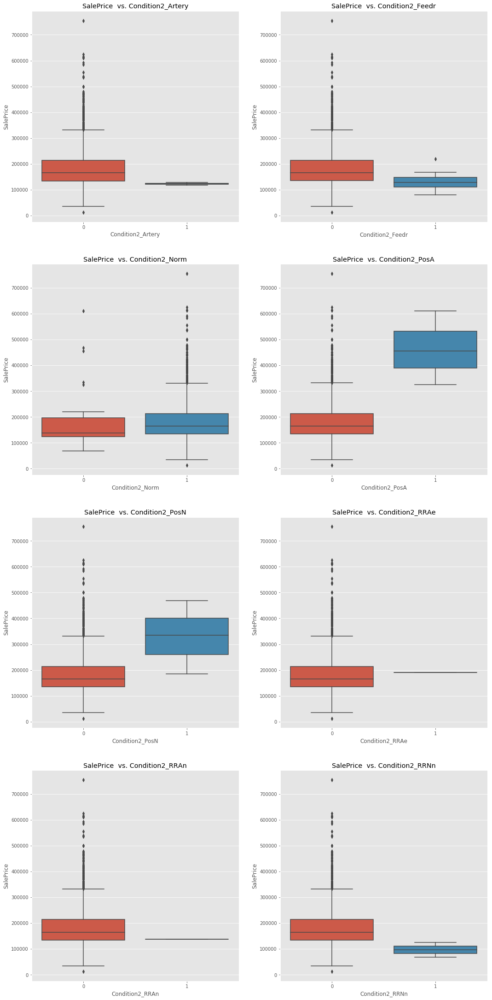

_____________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________
                                                   BldgType
_____________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________
1    2003
0     375
Name: BldgType_1Fam, dtype: int64
0    2341
1      37
Name: BldgType_2fmCon, dtype: int64
0    2327
1      51
Name: BldgType_Duplex, dtype: int64
0    2288
1      90
Name: BldgType_Twnhs, dtype: int64
0    2181
1     197
Name: BldgType_TwnhsE, dtype: int64


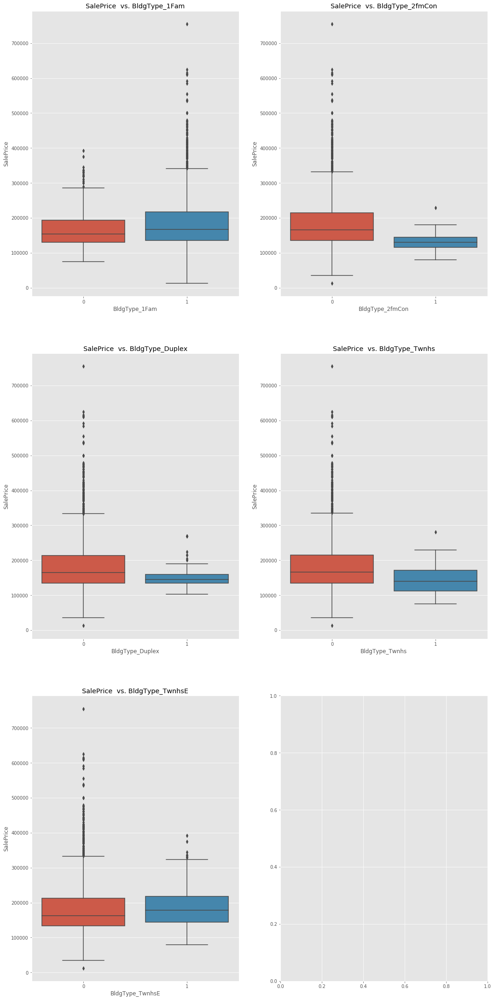

_____________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________
                                                   HouseStyle
_____________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________
0    2122
1     256
Name: HouseStyle_1.5Fin, dtype: int64
0    2363
1      15
Name: HouseStyle_1.5Unf, dtype: int64
0    1203
1    1175
Name: HouseStyle_1Story, dtype: int64
0    2372
1       6
Name: HouseStyle_2.5Fin, dtype: int64
0    2359
1      19
Name: HouseStyle_2.5Unf, dtype: int64
0    1645
1     733
Name: HouseStyle_2Story, dtype: int64
0    2319
1      59
Name: HouseStyle_SFoyer, dtype: int64
0    2263
1     115
Name: Ho

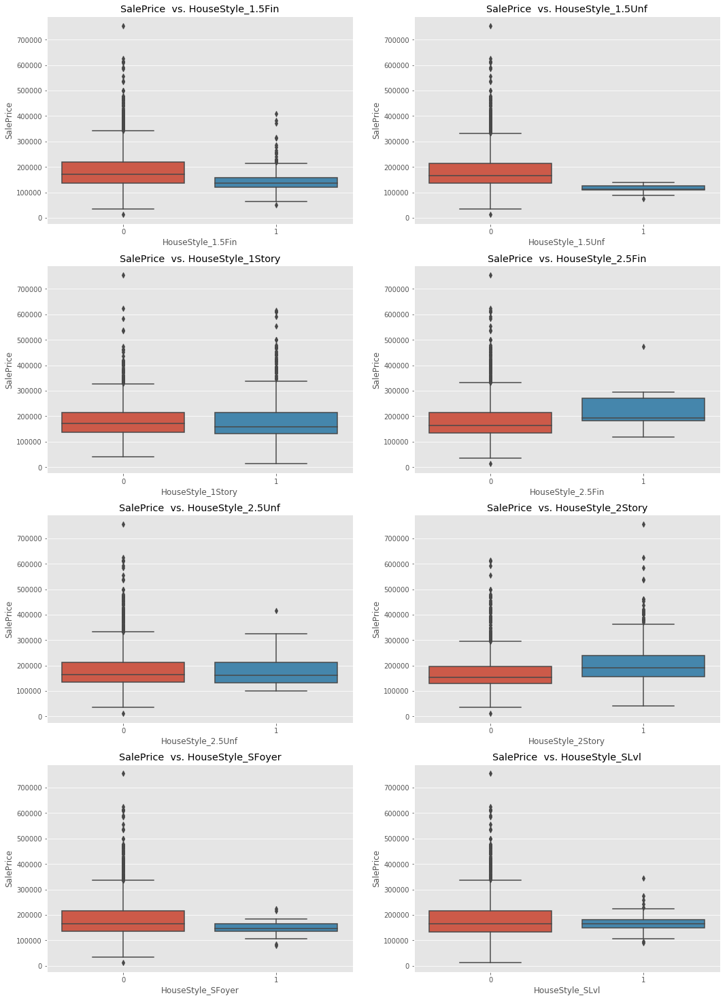

_____________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________
                                                   RoofStyle
_____________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________
0    2366
1      12
Name: RoofStyle_Flat, dtype: int64
1    1883
0     495
Name: RoofStyle_Gable, dtype: int64
0    2360
1      18
Name: RoofStyle_Gambrel, dtype: int64
0    1926
1     452
Name: RoofStyle_Hip, dtype: int64
0    2369
1       9
Name: RoofStyle_Mansard, dtype: int64
0    2374
1       4
Name: RoofStyle_Shed, dtype: int64


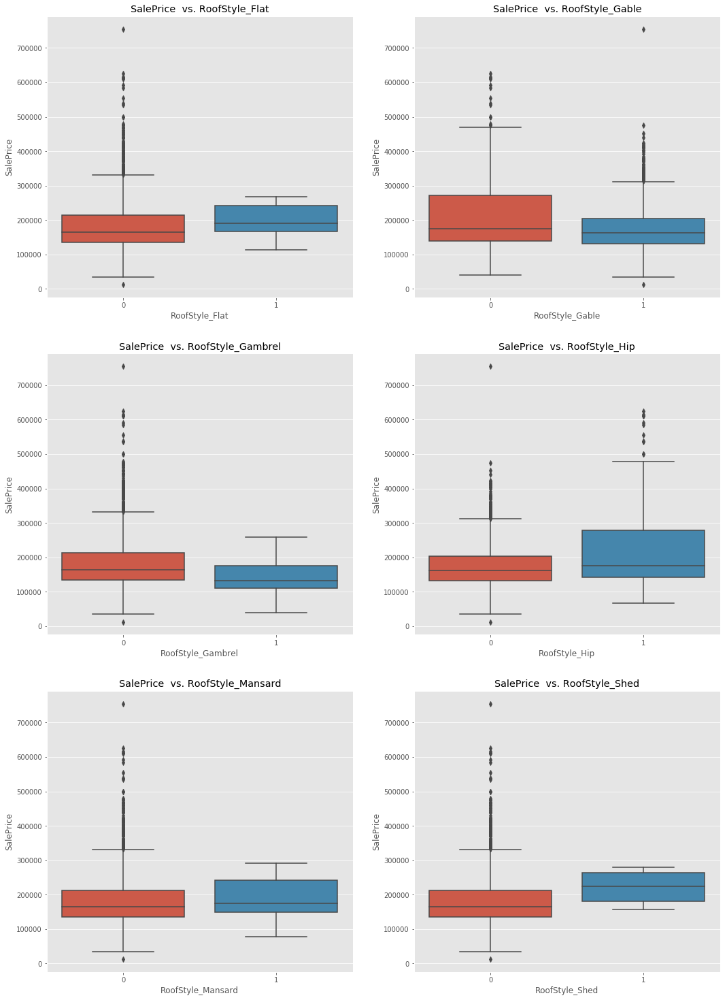

_____________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________
                                                   RoofMatl
_____________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________
1    2347
0      31
Name: RoofMatl_CompShg, dtype: int64
0    2377
1       1
Name: RoofMatl_Membran, dtype: int64
0    2377
1       1
Name: RoofMatl_Metal, dtype: int64
0    2377
1       1
Name: RoofMatl_Roll, dtype: int64
0    2365
1      13
Name: RoofMatl_Tar&Grv, dtype: int64
0    2370
1       8
Name: RoofMatl_WdShake, dtype: int64
0    2371
1       7
Name: RoofMatl_WdShngl, dtype: int64


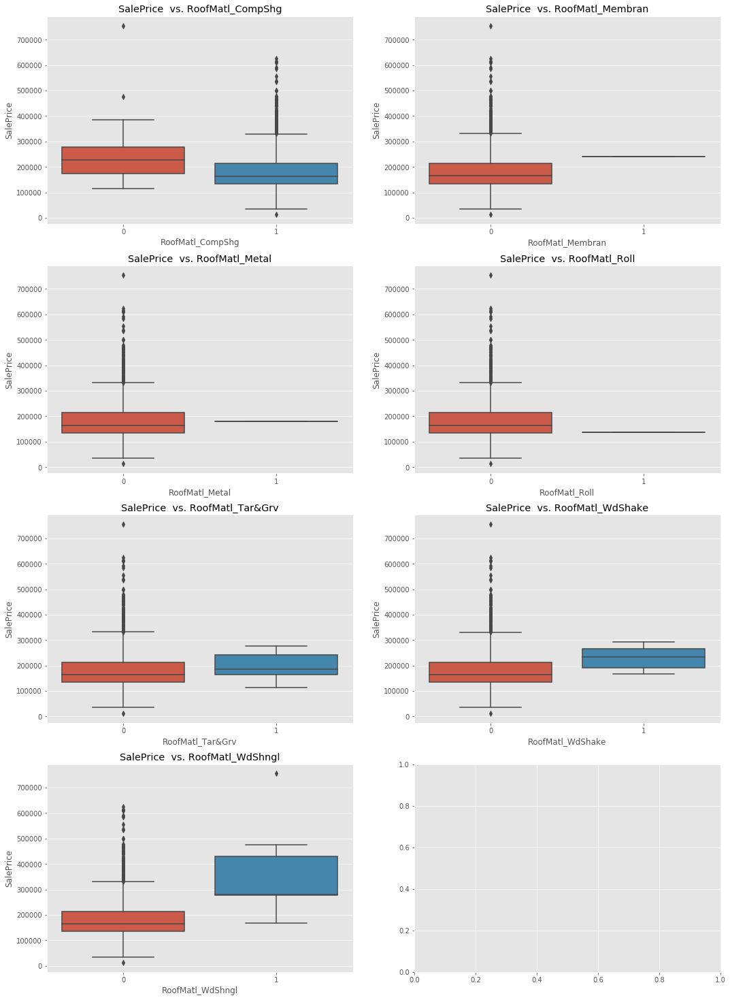

_____________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________
                                                   Exterior1st
_____________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________
0    2350
1      28
Name: Exterior1st_AsbShng, dtype: int64
0    2374
1       4
Name: Exterior1st_BrkComm, dtype: int64
0    2309
1      69
Name: Exterior1st_BrkFace, dtype: int64
0    2377
1       1
Name: Exterior1st_CBlock, dtype: int64
0    2295
1      83
Name: Exterior1st_CemntBd, dtype: int64
0    1980
1     398
Name: Exterior1st_HdBoard, dtype: int64
0    2377
1       1
Name: Exterior1st_ImStucc, dtype: int64
0    1999
1   

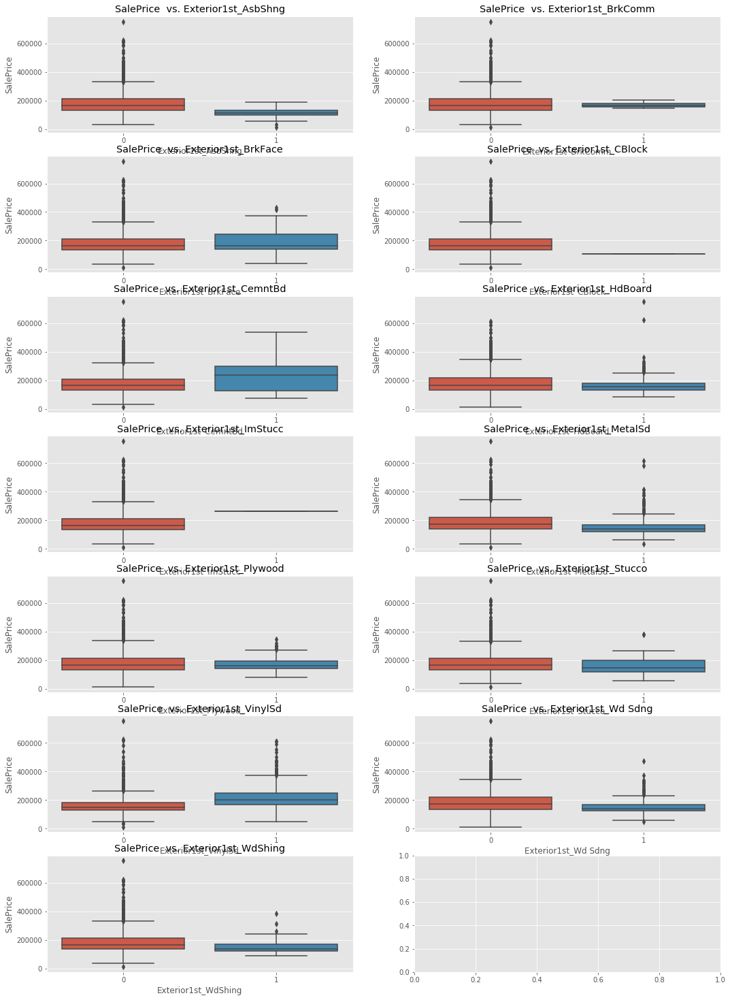

_____________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________
                                                   Exterior2nd
_____________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________
0    2352
1      26
Name: Exterior2nd_AsbShng, dtype: int64
0    2376
1       2
Name: Exterior2nd_AsphShn, dtype: int64
0    2358
1      20
Name: Exterior2nd_Brk Cmn, dtype: int64
0    2336
1      42
Name: Exterior2nd_BrkFace, dtype: int64
0    2377
1       1
Name: Exterior2nd_CBlock, dtype: int64
0    2295
1      83
Name: Exterior2nd_CmentBd, dtype: int64
0    2017
1     361
Name: Exterior2nd_HdBoard, dtype: int64
0    2365
1   

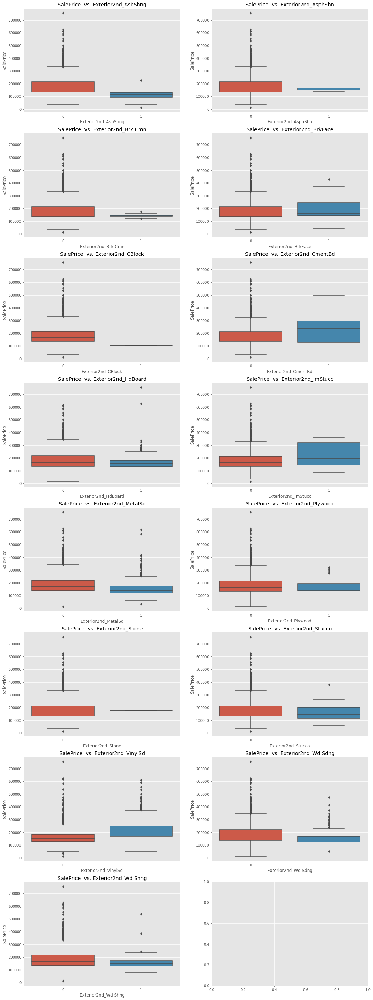

_____________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________
                                                   MasVnrType
_____________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________
0    2361
1      17
Name: MasVnrType_BrkCmn, dtype: int64
0    1594
1     784
Name: MasVnrType_BrkFace, dtype: int64
1    1395
0     983
Name: MasVnrType_None, dtype: int64
0    2196
1     182
Name: MasVnrType_Stone, dtype: int64


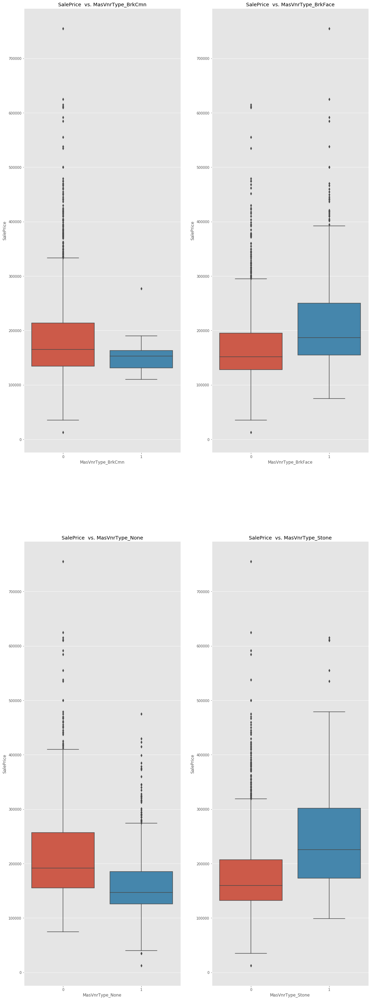

_____________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________
                                                   Foundation
_____________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________
0    2129
1     249
Name: Foundation_BrkTil, dtype: int64
0    1319
1    1059
Name: Foundation_CBlock, dtype: int64
0    1322
1    1056
Name: Foundation_PConc, dtype: int64
0    2369
1       9
Name: Foundation_Stone, dtype: int64
0    2373
1       5
Name: Foundation_Wood, dtype: int64


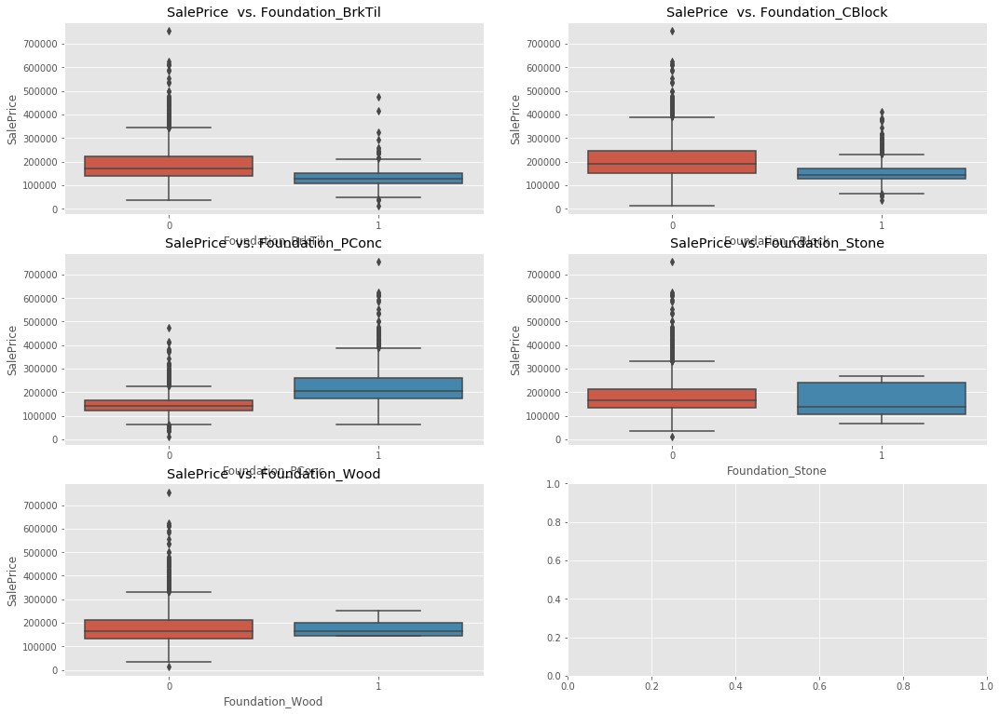

_____________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________
                                                   Heating
_____________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________
1    2351
0      27
Name: Heating_GasA, dtype: int64
0    2355
1      23
Name: Heating_GasW, dtype: int64
0    2375
1       3
Name: Heating_Grav, dtype: int64
0    2377
1       1
Name: Heating_OthW, dtype: int64


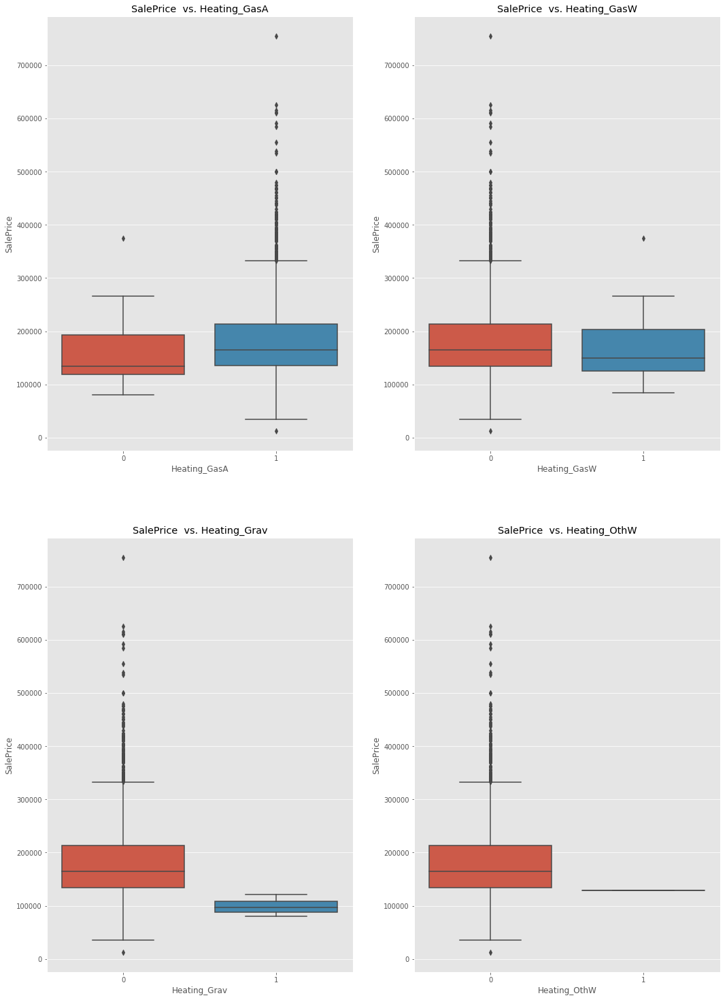

_____________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________
                                                   Electrical
_____________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________
0    2241
1     137
Name: Electrical_FuseA, dtype: int64
0    2353
1      25
Name: Electrical_FuseF, dtype: int64
0    2373
1       5
Name: Electrical_FuseP, dtype: int64
1    2211
0     167
Name: Electrical_SBrkr, dtype: int64


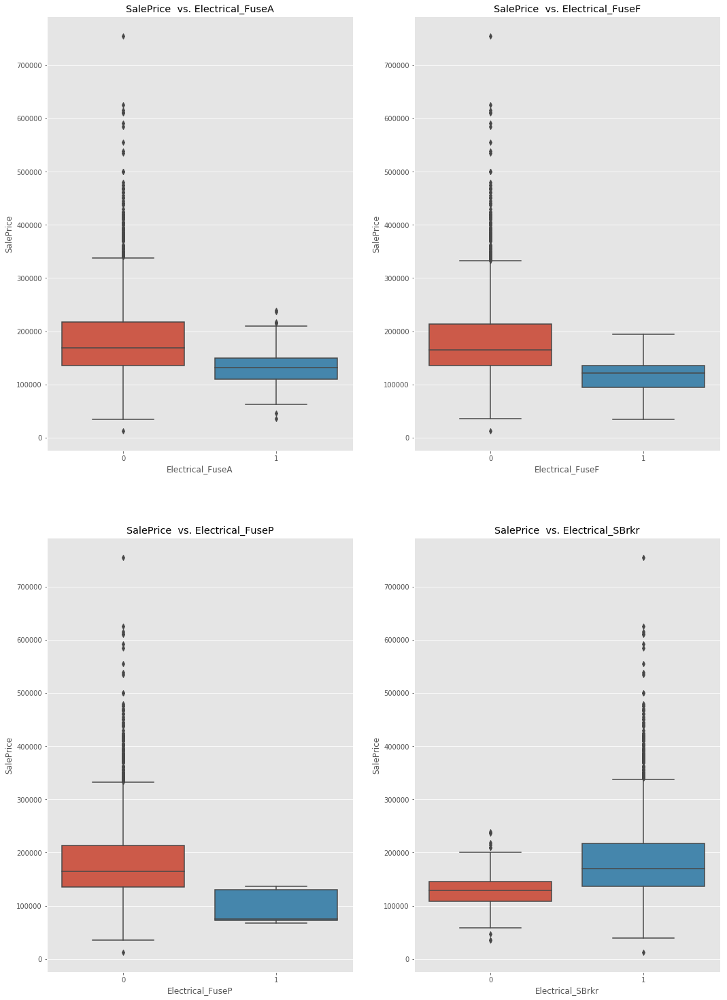

_____________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________
                                                   GarageType
_____________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________
0    2359
1      19
Name: GarageType_2Types, dtype: int64
1    1490
0     888
Name: GarageType_Attchd, dtype: int64
0    2351
1      27
Name: GarageType_Basment, dtype: int64
0    2230
1     148
Name: GarageType_BuiltIn, dtype: int64
0    2372
1       6
Name: GarageType_CarPort, dtype: int64
0    1690
1     688
Name: GarageType_Detchd, dtype: int64


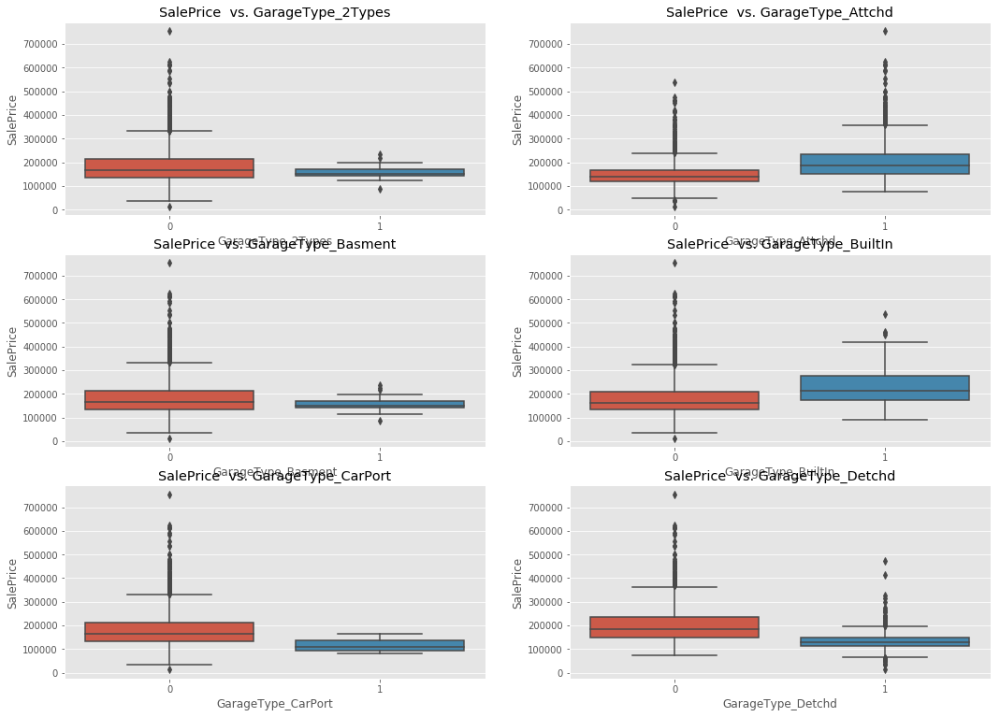

_____________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________
                                                   PavedDrive
_____________________________________________________________________________________________________________________________
_____________________________________________________________________________________________________________________________
0    2259
1     119
Name: PavedDrive_N, dtype: int64
0    2324
1      54
Name: PavedDrive_P, dtype: int64
1    2205
0     173
Name: PavedDrive_Y, dtype: int64


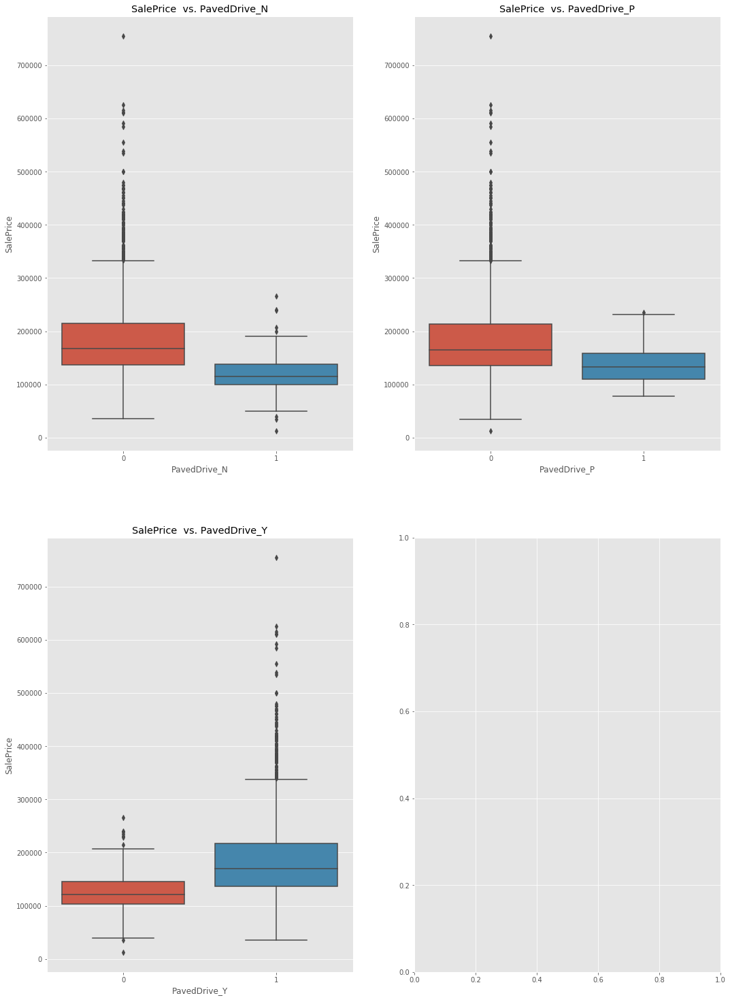

IndexError: list index out of range

In [39]:
for cat,dimension in enumerate(fig_sizes):
    box_maykr(dumb_data,dummy_cats[cat],'SalePrice',dimension)

# Making 'other' columns for selec dummy categories

In [40]:
def make_other_col(df,new_col_name,col_index,list_of_cols_to_group):
    """
    takes a list of columns to group into an other category in a dataframe
    
    df:  dataframe to manipulate
    new_col_name: string, what we want to call the grouped col name
    col_index: int, what column index we want to insert our new column
    list_of_cols_to_group = list of columns in the df that we want to group, these columns are assumed to contain 
                            binary values (0,1)
    
    """
    
    df.loc[:,new_col_name] = [0]*len(df)
    
    temp_column = df.pop(new_col_name)
    df.insert(col_index, new_col_name, temp_column)
    
    df.loc[:,new_col_name] = list(df[list_of_cols_to_group].sum(axis = 1))


    df = df.drop(list_of_cols_to_group,axis = 1)


    return df

In [41]:
cats_to_drop = []
for cat_list in dummy_cats:
    for cat in cat_list:
        if dumb_data[cat].value_counts()[1] <=40:
            cats_to_drop.append(cat)

            
list(enumerate(cats_to_drop))  
cats_to_drop

['MSSubClass_1-1/2 STORY - UNFINISHED ALL AGES',
 'MSSubClass_1-1/2 STORY PUD - ALL AGES',
 'MSSubClass_1-STORY W/FINISHED ATTIC ALL AGES',
 'MSSubClass_2 FAMILY CONVERSION - ALL STYLES AND AGES',
 'MSSubClass_2-1/2 STORY ALL AGES',
 'MSSubClass_PUD - MULTILEVEL - INCL SPLIT LEV/FOYER',
 'MSSubClass_SPLIT FOYER',
 'MSZoning_C (all)',
 'MSZoning_I (all)',
 'MSZoning_RH',
 'Utilities_NoSewr',
 'LotConfig_FR3',
 'Neighborhood_Blmngtn',
 'Neighborhood_Blueste',
 'Neighborhood_BrDale',
 'Neighborhood_ClearCr',
 'Neighborhood_Greens',
 'Neighborhood_GrnHill',
 'Neighborhood_Landmrk',
 'Neighborhood_MeadowV',
 'Neighborhood_NPkVill',
 'Neighborhood_SWISU',
 'Neighborhood_Veenker',
 'Condition1_PosA',
 'Condition1_PosN',
 'Condition1_RRAe',
 'Condition1_RRAn',
 'Condition1_RRNe',
 'Condition1_RRNn',
 'Condition2_Artery',
 'Condition2_Feedr',
 'Condition2_PosA',
 'Condition2_PosN',
 'Condition2_RRAe',
 'Condition2_RRAn',
 'Condition2_RRNn',
 'BldgType_2fmCon',
 'HouseStyle_1.5Unf',
 'HouseStyle

In [42]:
dumb_data = pd.get_dummies(data.drop(['Street','SaleType','SaleCondition'],axis = 1))
dumb_data = pd.merge(dumb_data,data[['MapRefNo','Neighborhood']],on = 'MapRefNo') #getting the original Neighborhood Column Back
second_column = dumb_data.pop('Neighborhood')
dumb_data.insert(1, 'Neighborhood', second_column) # changing position of Neighborhood column


ls = ['MSSubClass_1-1/2 STORY - UNFINISHED ALL AGES','MSSubClass_1-1/2 STORY PUD - ALL AGES',
      'MSSubClass_1-STORY W/FINISHED ATTIC ALL AGES','MSSubClass_2 FAMILY CONVERSION - ALL STYLES AND AGES',
      'MSSubClass_2-1/2 STORY ALL AGES','MSSubClass_PUD - MULTILEVEL - INCL SPLIT LEV/FOYER',
      'MSSubClass_SPLIT FOYER']

dumb_data = make_other_col(dumb_data,'MSSubClass_other',53,ls)
print(sum(list(dumb_data.loc[:,'MSSubClass_other':'MSSubClass_SPLIT OR MULTI-LEVEL'].sum())),len(dumb_data))
#dumb_data.head()



ls = ['MSZoning_C (all)','MSZoning_I (all)','MSZoning_RH']

dumb_data = make_other_col(dumb_data,'MSZoning_other',63,ls)
print(sum(dumb_data.loc[:,'MSZoning_other':'MSZoning_RM'].sum()),len(dumb_data))
#dumb_data.head()


ls = ['LotConfig_Corner','LotConfig_FR3']

dumb_data = make_other_col(dumb_data,'LotConfig_other',73,ls)
print(sum(dumb_data.loc[:,'LotConfig_other':'LotConfig_Inside'].sum()),len(dumb_data))
#dumb_data.head()



ls = ['Condition1_PosA','Condition1_PosN','Condition1_RRAe','Condition1_RRAn','Condition1_RRNe','Condition1_RRNn']

dumb_data = make_other_col(dumb_data,'Condition1_other',105,ls)
print(sum(dumb_data.loc[:,'Condition1_other':'Condition1_Norm'].sum()),len(dumb_data))
#dumb_data.head()


ls = ['Condition2_Artery',
 'Condition2_Feedr',
 'Condition2_PosA',
 'Condition2_PosN',
 'Condition2_RRAe',
 'Condition2_RRAn',
 'Condition2_RRNn']

dumb_data = make_other_col(dumb_data,'Condition2_other',109,ls)
print(sum(dumb_data.loc[:,'Condition2_other':'Condition2_Norm'].sum()),len(dumb_data))
#dumb_data.head()



ls = ['HouseStyle_1.5Unf','HouseStyle_2.5Fin']

dumb_data = make_other_col(dumb_data,'HouseStyle_other',116,ls)
print(sum(dumb_data.loc[:,'HouseStyle_other':'HouseStyle_SLvl'].sum()),len(dumb_data))
#dumb_data.head()


ls = ['RoofStyle_Shed','RoofStyle_Mansard','RoofStyle_Gambrel','RoofStyle_Flat']

dumb_data = make_other_col(dumb_data,'RoofStyle_other',123,ls)
print(sum(dumb_data.loc[:,'RoofStyle_other':'RoofStyle_Hip'].sum()),len(dumb_data))
#dumb_data.head()

ls = ['RoofMatl_Membran','RoofMatl_Metal','RoofMatl_Roll','RoofMatl_Tar&Grv','RoofMatl_WdShake','RoofMatl_WdShngl']

dumb_data = make_other_col(dumb_data,'RoofMatl_other',126,ls)
print(sum(dumb_data.loc[:,'RoofMatl_other':'RoofMatl_CompShg'].sum()),len(dumb_data))
#dumb_data.head()


ls = ['Exterior1st_AsbShng', 'Exterior1st_BrkComm','Exterior1st_CBlock','Exterior1st_ImStucc','Exterior1st_Stucco']

dumb_data = make_other_col(dumb_data,'Exterior1st_other',128,ls)
print(sum(dumb_data.loc[:,'Exterior1st_other':'Exterior1st_WdShing'].sum()),len(dumb_data))
#dumb_data.head()


ls = ['Exterior2nd_AsbShng',
 'Exterior2nd_AsphShn',
 'Exterior2nd_Brk Cmn',
 'Exterior2nd_CBlock',
 'Exterior2nd_ImStucc',
 'Exterior2nd_Stone',
 'Exterior2nd_Stucco']

dumb_data = make_other_col(dumb_data,'Exterior2nd_other',137,ls)
print(sum(dumb_data.loc[:,'Exterior2nd_other':'Exterior2nd_Wd Shng'].sum()),len(dumb_data))
#dumb_data.head()



ls = ['MasVnrType_BrkCmn']

dumb_data = make_other_col(dumb_data,'MasVnrType_other',146,ls)
print(sum(dumb_data.loc[:,'MasVnrType_other':'MasVnrType_Stone'].sum()),len(dumb_data))
#dumb_data.head()



ls = ['Foundation_Stone',
 'Foundation_Wood']

dumb_data = make_other_col(dumb_data,'Foundation_other',150,ls)
print(sum(dumb_data.loc[:,'Foundation_other':'Foundation_PConc'].sum()),len(dumb_data))
#dumb_data.head()


ls = ['Heating_GasW',
 'Heating_Grav',
 'Heating_OthW']

dumb_data = make_other_col(dumb_data,'Heating_other',154,ls)
print(sum(dumb_data.loc[:,'Heating_other':'Heating_GasA'].sum()),len(dumb_data))
#dumb_data.head()

ls = ['Electrical_FuseF',
 'Electrical_FuseP']

dumb_data = make_other_col(dumb_data,'Electrical_other',156,ls)
print(sum(dumb_data.loc[:,'Electrical_other':'Electrical_SBrkr'].sum()),len(dumb_data))
#dumb_data.head()


ls = ['GarageType_2Types',
 'GarageType_Basment',
 'GarageType_CarPort']

dumb_data = make_other_col(dumb_data,'GarageType_other',159,ls)
print(sum(dumb_data.loc[:,'GarageType_other':'GarageType_Detchd'].sum()),len(dumb_data))

2378 2378
2378 2378
2378 2378
2378 2378
2378 2378
2378 2378
2378 2378
2378 2378
2378 2378
2378 2378
2378 2378
2378 2378
2378 2378
2378 2378
2378 2378


In [43]:
dumb_data.head()

,MapRefNo,Neighborhood,GrLivArea,SalePrice,LotArea,LotShape,LandSlope,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,CentralAir,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,MSSubClass_other,MSSubClass_1-1/2 STORY FINISHED ALL AGES,MSSubClass_1-STORY 1945 & OLDER,MSSubClass_1-STORY 1946 & NEWER ALL STYLES,MSSubClass_1-STORY PUD (Planned Unit Development) - 1946 & NEWER,MSSubClass_2-STORY 1945 & OLDER,MSSubClass_2-STORY 1946 & NEWER,MSSubClass_2-STORY PUD - 1946 & NEWER,MSSubClass_DUPLEX - ALL STYLES AND AGES,MSSubClass_SPLIT OR MULTI-LEVEL,MSZoning_other,MSZoning_FV,MSZoning_RL,MSZoning_RM,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_AllPub,Utilities_NoSewr,LotConfig_other,LotConfig_CulDSac,LotConfig_FR2,LotConfig_Inside,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_Greens,Neighborhood_GrnHill,Neighborhood_IDOTRR,Neighborhood_Landmrk,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_other,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition2_other,Condition2_Norm,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_other,HouseStyle_1.5Fin,HouseStyle_1Story,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_other,RoofStyle_Gable,RoofStyle_Hip,RoofMatl_other,RoofMatl_CompShg,Exterior1st_other,Exterior1st_BrkFace,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_other,Exterior2nd_BrkFace,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_MetalSd,Exterior2nd_Plywood,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_other,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_other,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Heating_other,Heating_GasA,Electrical_other,Electrical_FuseA,Electrical_SBrkr,GarageType_other,GarageType_Attchd,GarageType_BuiltIn,GarageType_Detchd,PavedDrive_N,PavedDrive_P,PavedDrive_Y
0,909176150,SWISU,856,126000,7890,0,1,6,6,1939,1950,0.0,3,3,3,3,1,3,238.0,1,0.0,618.0,856.0,3,1,856,0,0,1.0,0.0,1,0,2,1,3,4,8,1,1939.0,1,2.0,399.0,3,3,0,0,0,0,166,0,0,3,2010,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1
1,905476230,Edwards,1049,139500,4235,0,1,5,5,1984,1984,149.0,4,3,4,3,2,6,552.0,5,393.0,104.0,1049.0,3,1,1049,0,0,1.0,0.0,2,0,2,1,4,5,8,0,1984.0,3,1.0,266.0,3,3,0,105,0,0,0,0,0,2,2009,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,1,0,0,0,0,1
2,911128020,IDOTRR,1001,124900,6060,0,1,5,9,1930,2007,0.0,4,3,3,3,1,5,737.0,1,0.0,100.0,837.0,5,1,1001,0,0,0.0,0.0,1,0,2,1,4,5,8,0,1930.0,1,1.0,216.0,3,1,154,0,42,86,0,0,0,11,2007,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0

# Lasso for Feature Selection on Dummified Set

In [44]:
from sklearn.linear_model import Lasso,Ridge,LassoLarsIC
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV

In [45]:
tr = dumb_data.copy()

train_features = tr.drop(['MapRefNo','SalePrice','Neighborhood','MoSold','YrSold'], axis = 1)
train_target = tr['SalePrice']


scaler = StandardScaler()
scaler.fit(train_features)
train_features_scaled = scaler.transform(train_features)


lasso = Lasso()

alpha_range = np.linspace(0,1000,1000)
lasso.set_params(normalize=True)
coefs_lasso  = []
scores = []

for alpha in alpha_range:
        lasso.set_params(alpha=alpha)
        lasso.fit(train_features_scaled,train_target)  
        coefs_lasso.append(lasso.coef_)
        scores.append(lasso.score(train_features_scaled,train_target))

coefs_lasso = pd.DataFrame(coefs_lasso, index = alpha_range, columns = train_features.columns)  
score_lasso = pd.DataFrame({'lambda':alpha_range,'R^2':scores})
score_lasso = score_lasso.reset_index()

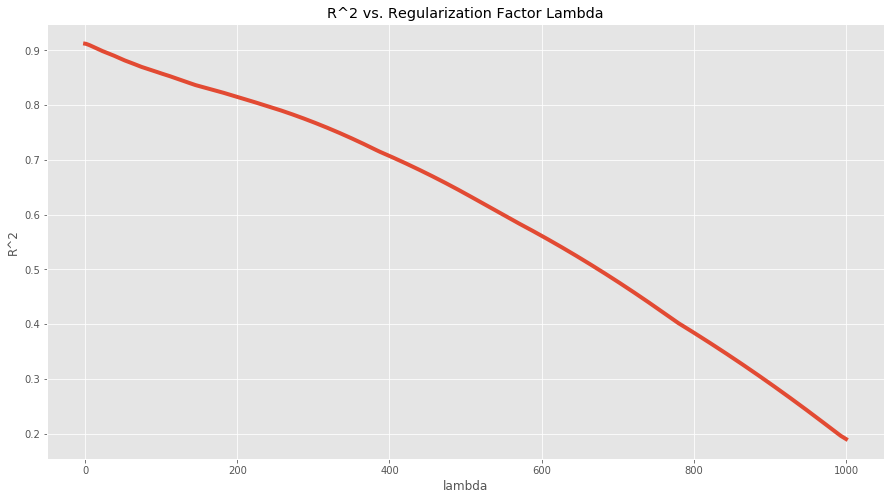

In [46]:
fig,ax = plt.subplots()
fig.set_size_inches(15,8)
sns.lineplot(data = score_lasso.reset_index(), x= 'lambda',y = 'R^2',linewidth = 4)
plt.title('R^2 vs. Regularization Factor Lambda')
plt.show()

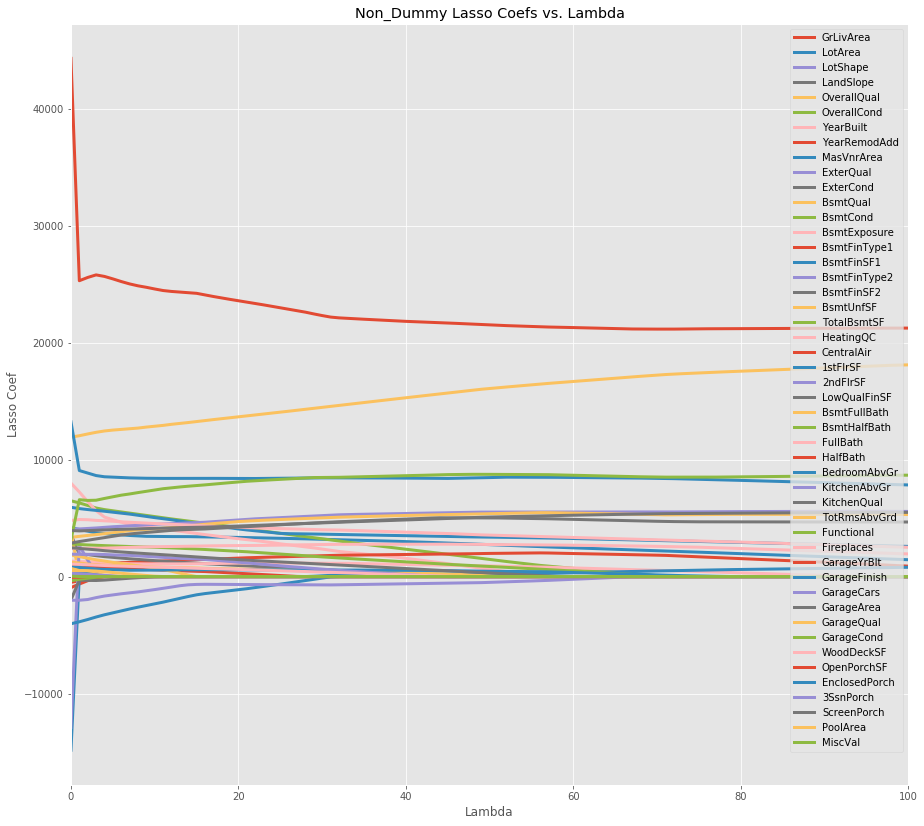

In [47]:
Non_dummies = list(coefs_lasso.columns)[list(coefs_lasso.columns).index( 'GrLivArea'):\
                                                list(coefs_lasso.columns).index( 'MiscVal' )+1]

fig,ax = plt.subplots()
fig.set_size_inches(15,14)

for i in range(len(Non_dummies)):
    sns.lineplot(x = coefs_lasso.index,y = Non_dummies[i],
                 data = coefs_lasso,label = Non_dummies[i],linewidth = 3)

plt.xlim(0,100)
plt.title("Non_Dummy Lasso Coefs vs. Lambda")
plt.ylabel("Lasso Coef")
plt.xlabel("Lambda")
plt.legend(loc = 1)
plt.show()

# Visualizing coeficients of dummy subgroups vs. normalization factor lambda

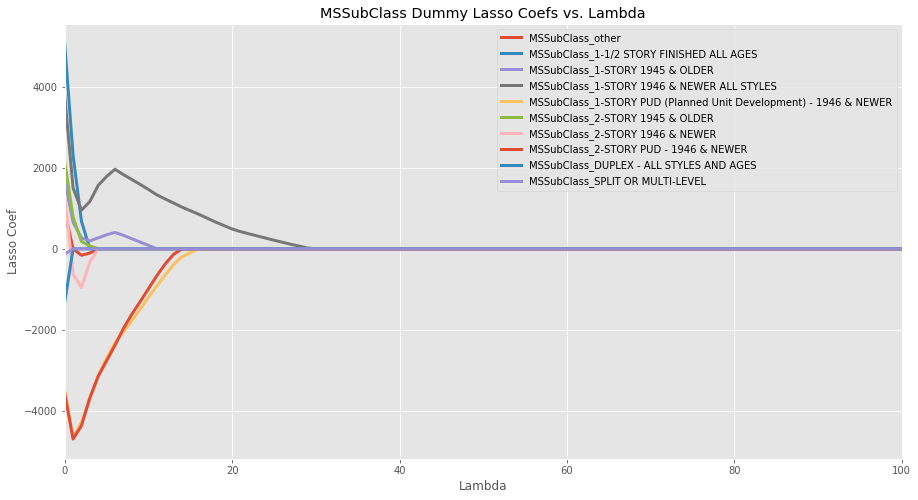

In [48]:
MSSubClass_dummies = list(coefs_lasso.columns)[list(coefs_lasso.columns).index('MSSubClass_other'):\
                                                list(coefs_lasso.columns).index('MSSubClass_SPLIT OR MULTI-LEVEL')+1]

fig,ax = plt.subplots()
fig.set_size_inches(15,8)

for i in range(len(MSSubClass_dummies)):
    sns.lineplot(x = coefs_lasso.index,y = MSSubClass_dummies[i],data = coefs_lasso,label = MSSubClass_dummies[i],linewidth = 3)

plt.xlim(0,100)
plt.title("MSSubClass Dummy Lasso Coefs vs. Lambda")
plt.ylabel("Lasso Coef")
plt.xlabel("Lambda")
plt.legend(loc = 1)
plt.show()

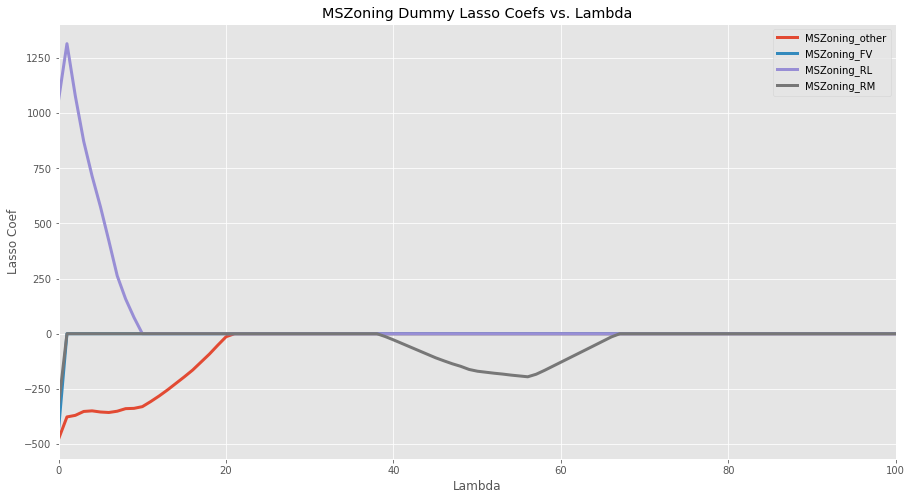

In [49]:
MSZoning_dummies = list(coefs_lasso.columns)[list(coefs_lasso.columns).index('MSZoning_other'):\
                                                list(coefs_lasso.columns).index('MSZoning_RM')+1]

fig,ax = plt.subplots()
fig.set_size_inches(15,8)

for i in range(len(MSZoning_dummies)):
    sns.lineplot(x = coefs_lasso.index,y = MSZoning_dummies[i],data = coefs_lasso,label = MSZoning_dummies[i],linewidth = 3)

plt.xlim(0,100)
plt.title("MSZoning Dummy Lasso Coefs vs. Lambda")
plt.ylabel("Lasso Coef")
plt.xlabel("Lambda")
plt.legend(loc = 1)
plt.show()

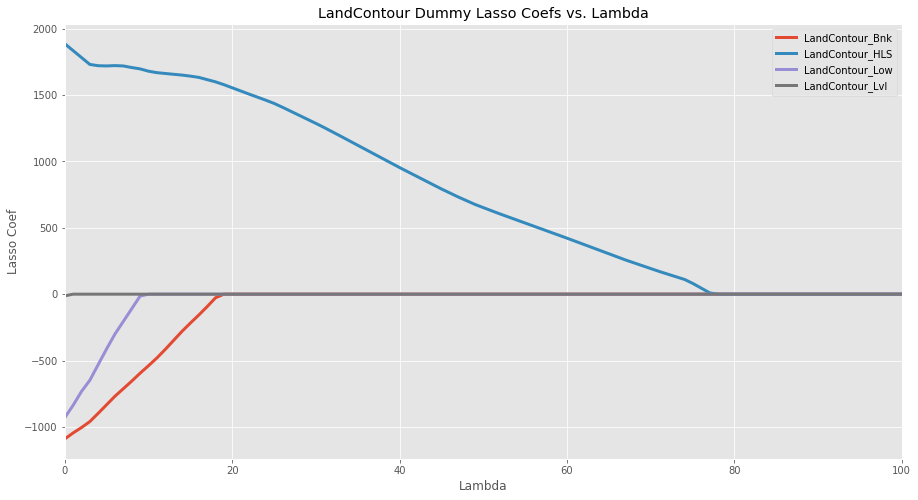

In [50]:
LandContour_dummies = list(coefs_lasso.columns)[list(coefs_lasso.columns).index('LandContour_Bnk'):\
                                                list(coefs_lasso.columns).index('LandContour_Lvl')+1]

fig,ax = plt.subplots()
fig.set_size_inches(15,8)

for i in range(len(LandContour_dummies)):
    sns.lineplot(x = coefs_lasso.index,y = LandContour_dummies[i],data = coefs_lasso,label = LandContour_dummies[i],linewidth = 3)

plt.xlim(0,100)
plt.title("LandContour Dummy Lasso Coefs vs. Lambda")
plt.ylabel("Lasso Coef")
plt.xlabel("Lambda")
plt.legend(loc = 1)
plt.show()

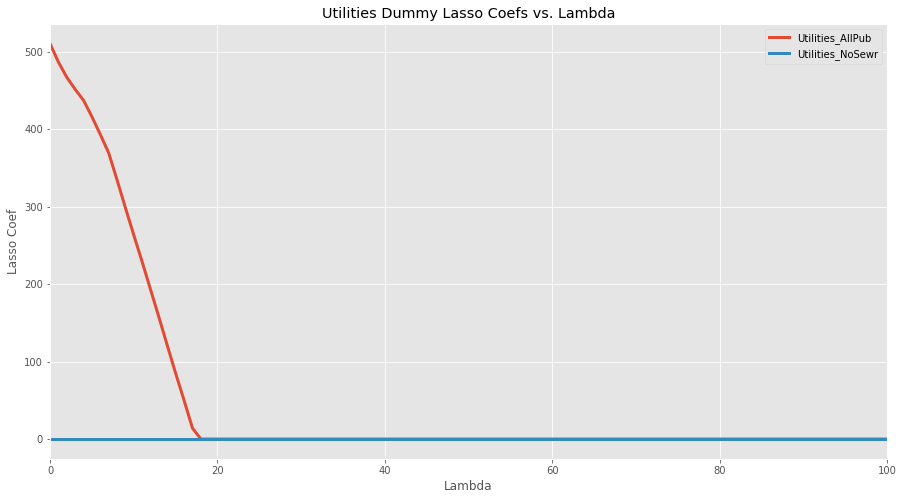

In [51]:
Utilities_dummies = list(coefs_lasso.columns)[list(coefs_lasso.columns).index('Utilities_AllPub'):\
                                             list(coefs_lasso.columns).index('Utilities_NoSewr')+1]

fig,ax = plt.subplots()
fig.set_size_inches(15,8)

for i in range(len(Utilities_dummies)):
    sns.lineplot(x = coefs_lasso.index,y = Utilities_dummies[i],data = coefs_lasso,label =  Utilities_dummies[i],linewidth = 3)

plt.xlim(0,100)
plt.title("Utilities Dummy Lasso Coefs vs. Lambda")
plt.ylabel("Lasso Coef")
plt.xlabel("Lambda")
plt.legend()
plt.show()

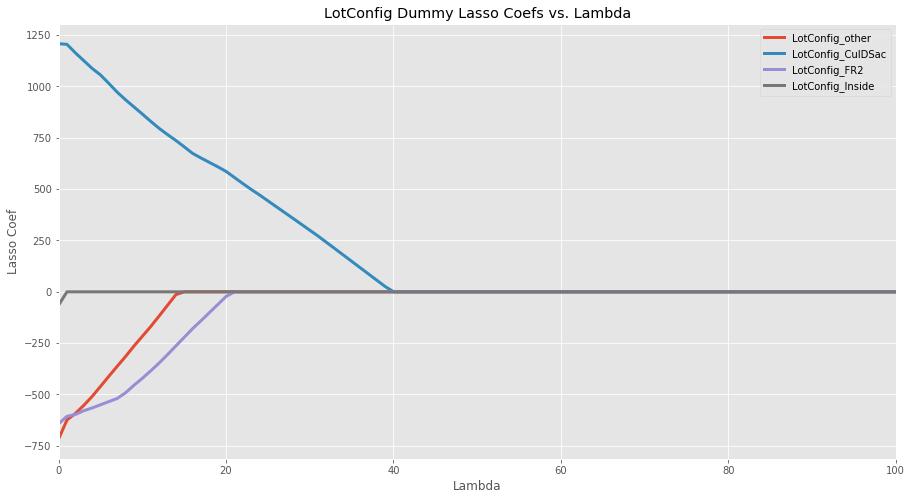

In [52]:
LotConfig_dummies = list(coefs_lasso.columns)[list(coefs_lasso.columns).index('LotConfig_other'):\
                                             list(coefs_lasso.columns).index('LotConfig_Inside')+1]

fig,ax = plt.subplots()
fig.set_size_inches(15,8)

for i in range(len(LotConfig_dummies)):
    sns.lineplot(x = coefs_lasso.index,y = LotConfig_dummies[i],data = coefs_lasso,label =  LotConfig_dummies[i],linewidth = 3)

plt.xlim(0,100)
plt.title("LotConfig Dummy Lasso Coefs vs. Lambda")
plt.ylabel("Lasso Coef")
plt.xlabel("Lambda")
plt.legend()
plt.show()

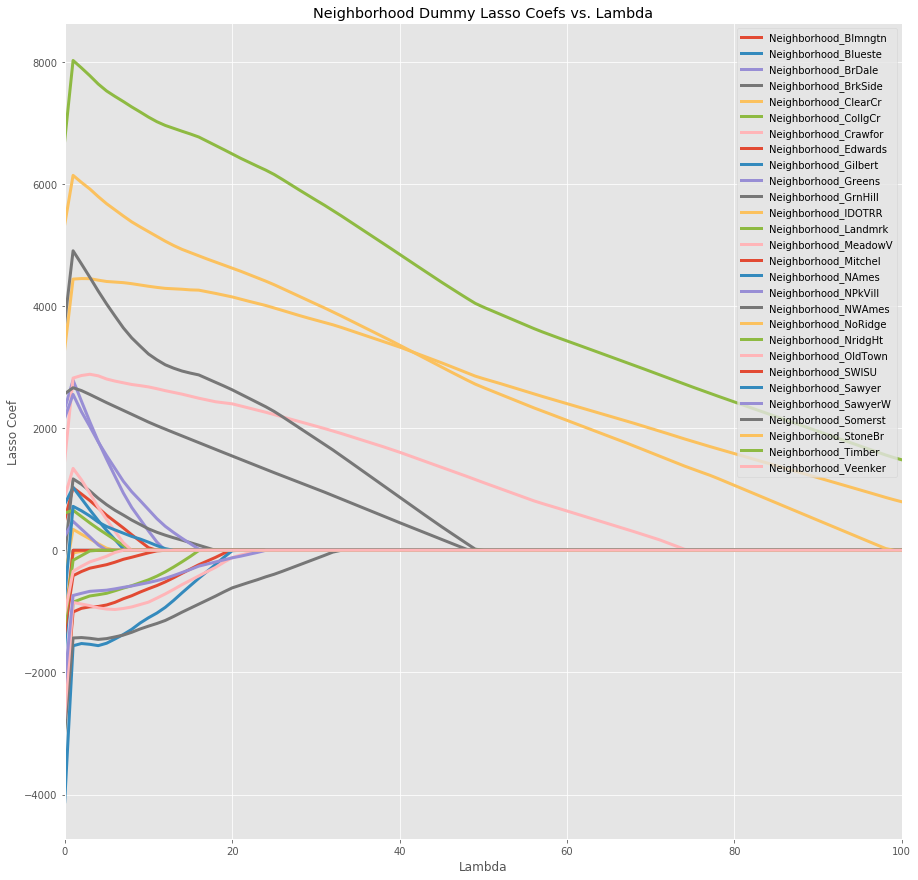

In [53]:
Neighborhood_dummies = list(coefs_lasso.columns)[list(coefs_lasso.columns).index('Neighborhood_Blmngtn'):\
                                                list(coefs_lasso.columns).index('Neighborhood_Veenker')+1]

fig,ax = plt.subplots()
fig.set_size_inches(15,15)

for i in range(len(Neighborhood_dummies)):
    sns.lineplot(x = coefs_lasso.index,y = Neighborhood_dummies[i],data = coefs_lasso,label = Neighborhood_dummies[i],linewidth = 3)

plt.xlim(0,100)
plt.title("Neighborhood Dummy Lasso Coefs vs. Lambda")
plt.ylabel("Lasso Coef")
plt.xlabel("Lambda")
plt.legend()
plt.show()

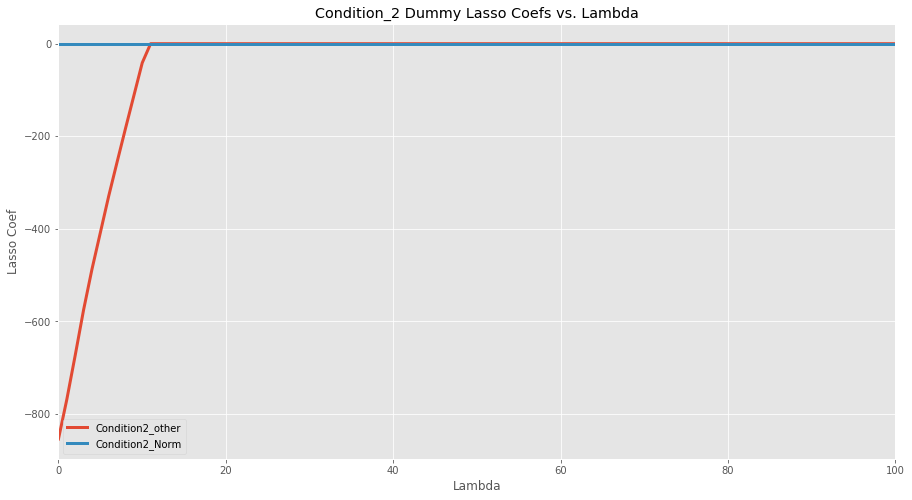

In [54]:
Condition_2_dummies = list(coefs_lasso.columns)[list(coefs_lasso.columns).index( 'Condition2_other'):\
                                                list(coefs_lasso.columns).index( 'Condition2_Norm' )+1]

fig,ax = plt.subplots()
fig.set_size_inches(15,8)

for i in range(len(Condition_2_dummies)):
    sns.lineplot(x = coefs_lasso.index,y = Condition_2_dummies[i],
                 data = coefs_lasso,label = Condition_2_dummies[i],linewidth = 3)

plt.xlim(0,100)
plt.title("Condition_2 Dummy Lasso Coefs vs. Lambda")
plt.ylabel("Lasso Coef")
plt.xlabel("Lambda")
plt.legend()
plt.show()

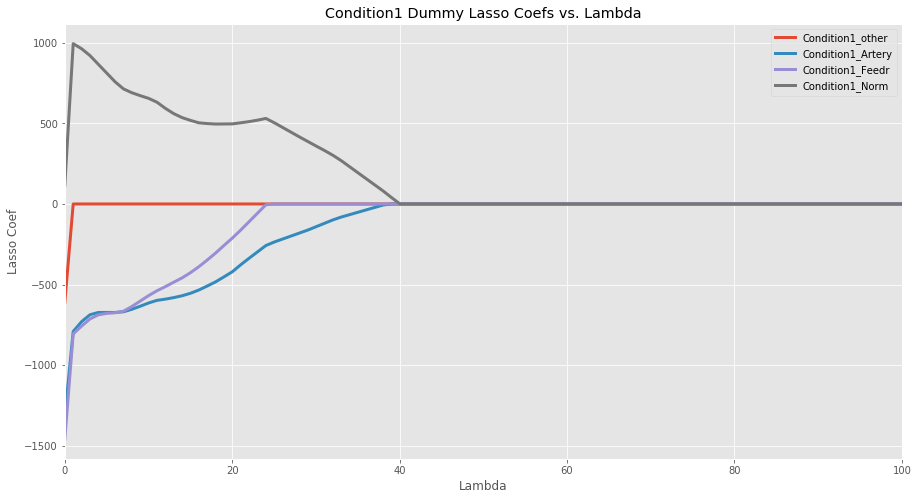

In [55]:
Condition1_dummies = list(coefs_lasso.columns)[list(coefs_lasso.columns).index( 'Condition1_other'):\
                                                list(coefs_lasso.columns).index( 'Condition1_Norm' )+1]

fig,ax = plt.subplots()
fig.set_size_inches(15,8)

for i in range(len(Condition1_dummies)):
    sns.lineplot(x = coefs_lasso.index,y = Condition1_dummies[i],
                 data = coefs_lasso,label = Condition1_dummies[i],linewidth = 3)

plt.xlim(0,100)
plt.title("Condition1 Dummy Lasso Coefs vs. Lambda")
plt.ylabel("Lasso Coef")
plt.xlabel("Lambda")
plt.legend()
plt.show()

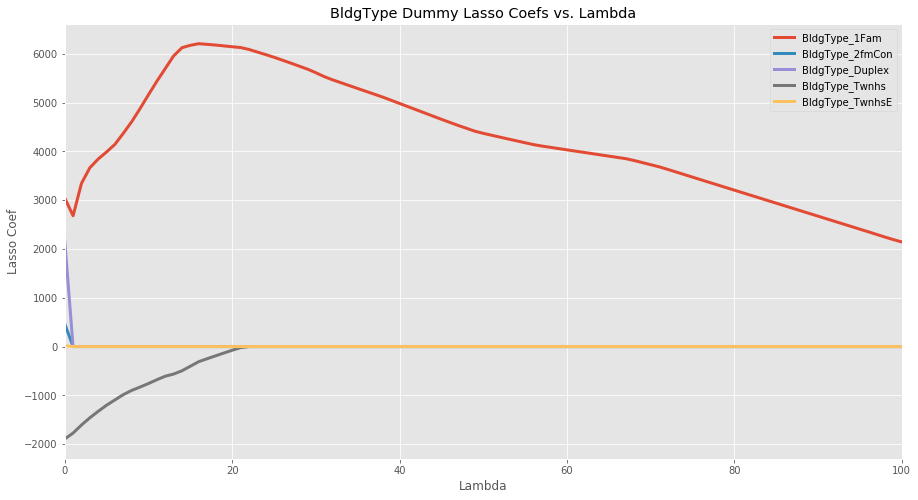

In [56]:
BldgType_dummies = list(coefs_lasso.columns)[list(coefs_lasso.columns).index( 'BldgType_1Fam'):\
                                                list(coefs_lasso.columns).index( 'BldgType_TwnhsE' )+1]

fig,ax = plt.subplots()
fig.set_size_inches(15,8)

for i in range(len(BldgType_dummies)):
    sns.lineplot(x = coefs_lasso.index,y = BldgType_dummies[i],
                 data = coefs_lasso,label = BldgType_dummies[i],linewidth = 3)

plt.xlim(0,100)
plt.title("BldgType Dummy Lasso Coefs vs. Lambda")
plt.ylabel("Lasso Coef")
plt.xlabel("Lambda")
plt.legend()
plt.show()

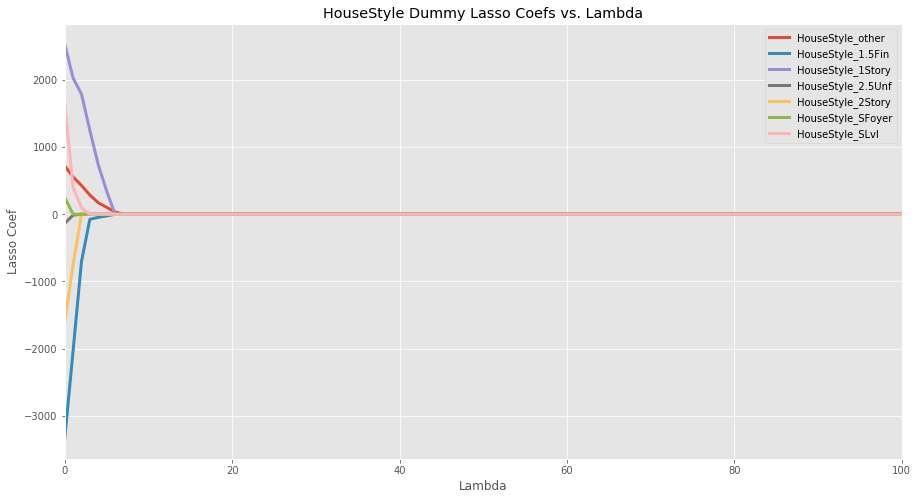

In [57]:
HouseStyle_dummies = list(coefs_lasso.columns)[list(coefs_lasso.columns).index( 'HouseStyle_other'):\
                                                list(coefs_lasso.columns).index( 'HouseStyle_SLvl' )+1]

fig,ax = plt.subplots()
fig.set_size_inches(15,8)

for i in range(len(HouseStyle_dummies)):
    sns.lineplot(x = coefs_lasso.index,y = HouseStyle_dummies[i],
                 data = coefs_lasso,label = HouseStyle_dummies[i],linewidth = 3)

plt.xlim(0,100)
plt.title("HouseStyle Dummy Lasso Coefs vs. Lambda")
plt.ylabel("Lasso Coef")
plt.xlabel("Lambda")
plt.legend()
plt.show()

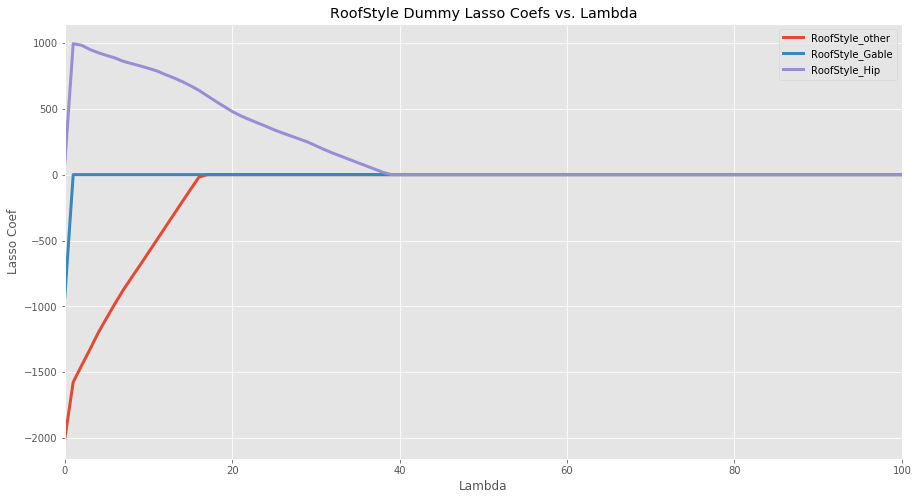

In [58]:
RoofStyle_dummies = list(coefs_lasso.columns)[list(coefs_lasso.columns).index( 'RoofStyle_other'):\
                                                list(coefs_lasso.columns).index( 'RoofStyle_Hip' )+1]

fig,ax = plt.subplots()
fig.set_size_inches(15,8)

for i in range(len(RoofStyle_dummies)):
    sns.lineplot(x = coefs_lasso.index,y = RoofStyle_dummies[i],
                 data = coefs_lasso,label = RoofStyle_dummies[i],linewidth = 3)

plt.xlim(0,100)
plt.title("RoofStyle Dummy Lasso Coefs vs. Lambda")
plt.ylabel("Lasso Coef")
plt.xlabel("Lambda")
plt.legend()
plt.show()

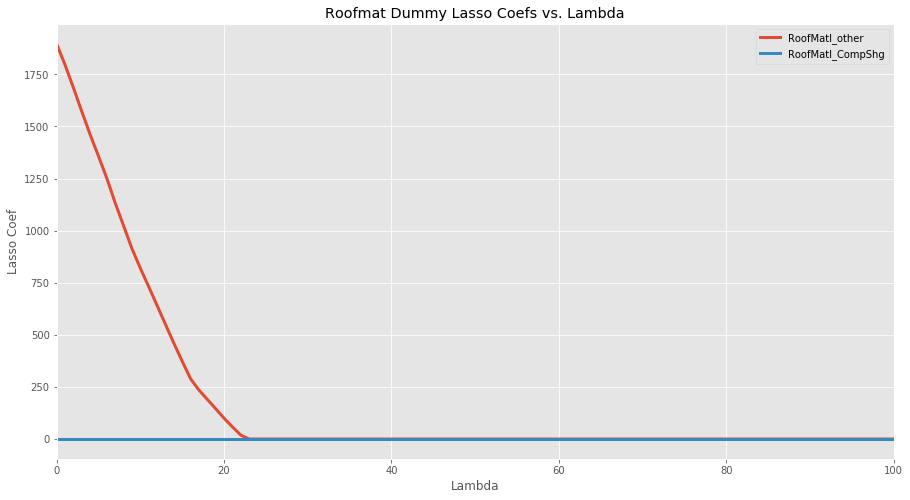

In [59]:
Roofmat_dummies = list(coefs_lasso.columns)[list(coefs_lasso.columns).index('RoofMatl_other'):\
                                                list(coefs_lasso.columns).index('RoofMatl_CompShg')+1]

fig,ax = plt.subplots()
fig.set_size_inches(15,8)

for i in range(len(Roofmat_dummies)):
    sns.lineplot(x = coefs_lasso.index,y = Roofmat_dummies[i],data = coefs_lasso,label = Roofmat_dummies[i],linewidth = 3)

plt.xlim(0,100)
plt.title("Roofmat Dummy Lasso Coefs vs. Lambda")
plt.ylabel("Lasso Coef")
plt.xlabel("Lambda")
plt.legend()
plt.show()

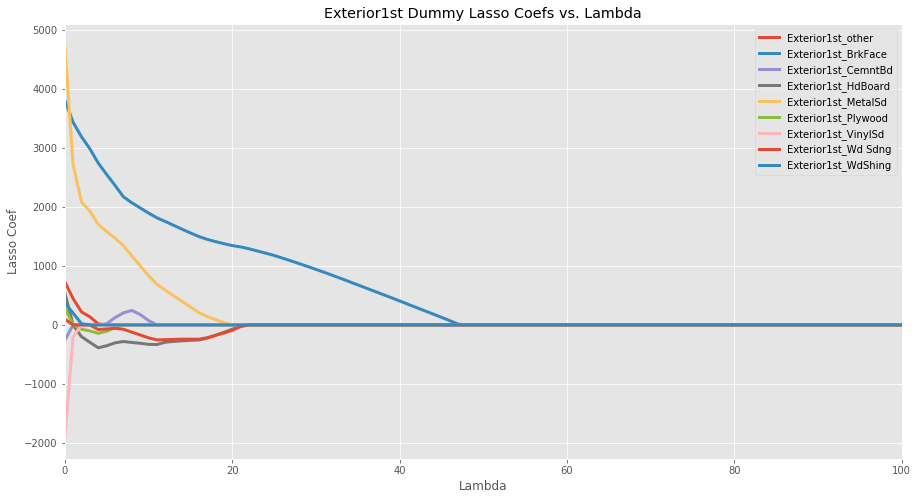

In [60]:
Exterior1st_dummies = list(coefs_lasso.columns)[list(coefs_lasso.columns).index('Exterior1st_other' ):\
                                                list(coefs_lasso.columns).index( 'Exterior1st_WdShing' )+1]

fig,ax = plt.subplots()
fig.set_size_inches(15,8)

for i in range(len(Exterior1st_dummies)):
    sns.lineplot(x = coefs_lasso.index,y = Exterior1st_dummies[i],data = coefs_lasso,label = Exterior1st_dummies[i],linewidth = 3)

plt.xlim(0,100)
plt.title("Exterior1st Dummy Lasso Coefs vs. Lambda")
plt.ylabel("Lasso Coef")
plt.xlabel("Lambda")
plt.legend()
plt.show()

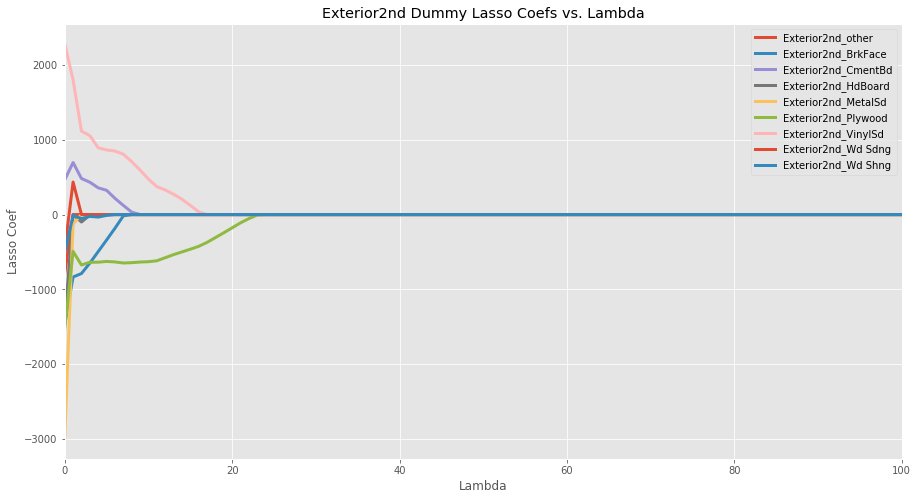

In [61]:
Exterior2nd_dummies = list(coefs_lasso.columns)[list(coefs_lasso.columns).index('Exterior2nd_other' ):\
                                                list(coefs_lasso.columns).index( 'Exterior2nd_Wd Shng' )+1]

fig,ax = plt.subplots()
fig.set_size_inches(15,8)

for i in range(len(Exterior2nd_dummies)):
    sns.lineplot(x = coefs_lasso.index,y = Exterior2nd_dummies[i],data = coefs_lasso,label = Exterior2nd_dummies[i],linewidth = 3)

plt.xlim(0,100)
plt.title("Exterior2nd Dummy Lasso Coefs vs. Lambda")
plt.ylabel("Lasso Coef")
plt.xlabel("Lambda")
plt.legend()
plt.show()

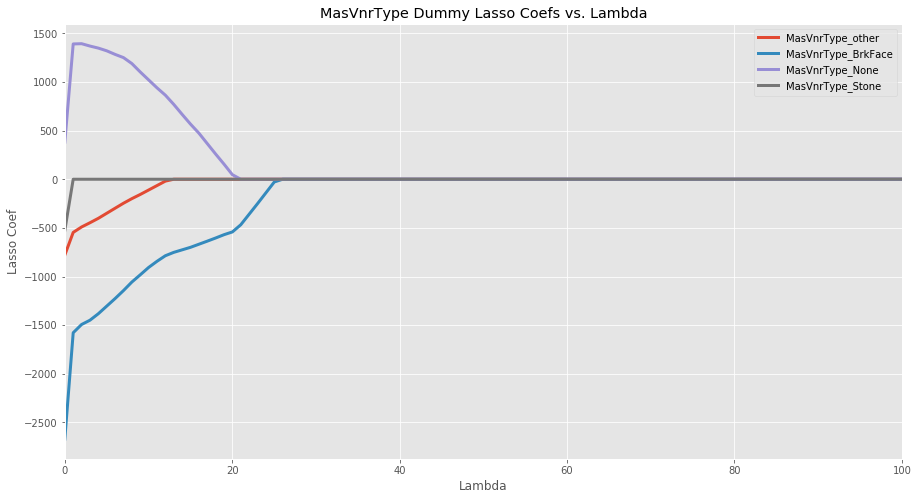

In [62]:
MasVnrType_dummies = list(coefs_lasso.columns)[list(coefs_lasso.columns).index('MasVnrType_other'):\
                                                list(coefs_lasso.columns).index('MasVnrType_Stone')+1]

fig,ax = plt.subplots()
fig.set_size_inches(15,8)

for i in range(len(MasVnrType_dummies)):
    sns.lineplot(x = coefs_lasso.index,y = MasVnrType_dummies[i],data = coefs_lasso,label = MasVnrType_dummies[i],linewidth = 3)

plt.xlim(0,100)
plt.title("MasVnrType Dummy Lasso Coefs vs. Lambda")
plt.ylabel("Lasso Coef")
plt.xlabel("Lambda")
plt.legend()
plt.show()

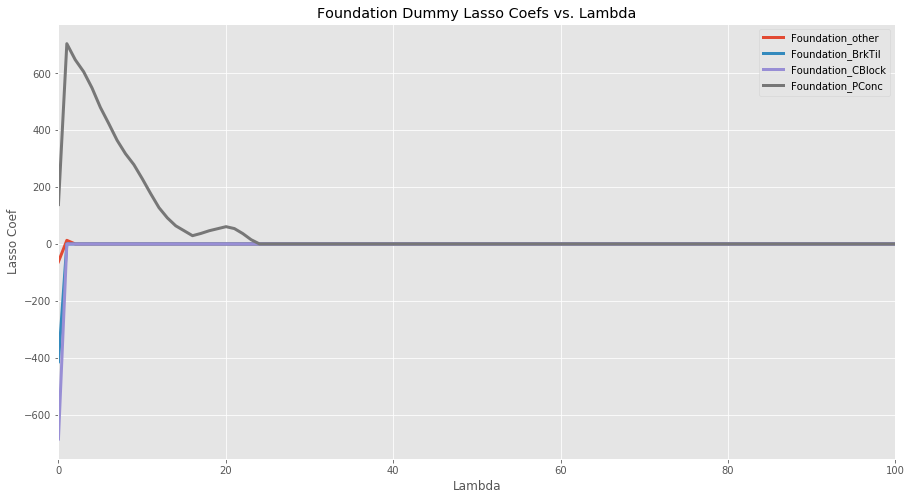

In [63]:
Foundation_dummies = list(coefs_lasso.columns)[list(coefs_lasso.columns).index('Foundation_other'):\
                                                list(coefs_lasso.columns).index('Foundation_PConc')+1]

fig,ax = plt.subplots()
fig.set_size_inches(15,8)

for i in range(len(Foundation_dummies)):
    sns.lineplot(x = coefs_lasso.index,y = Foundation_dummies[i],data = coefs_lasso,label = Foundation_dummies[i],linewidth = 3)

plt.xlim(0,100)
plt.title("Foundation Dummy Lasso Coefs vs. Lambda")
plt.ylabel("Lasso Coef")
plt.xlabel("Lambda")
plt.legend()
plt.show()

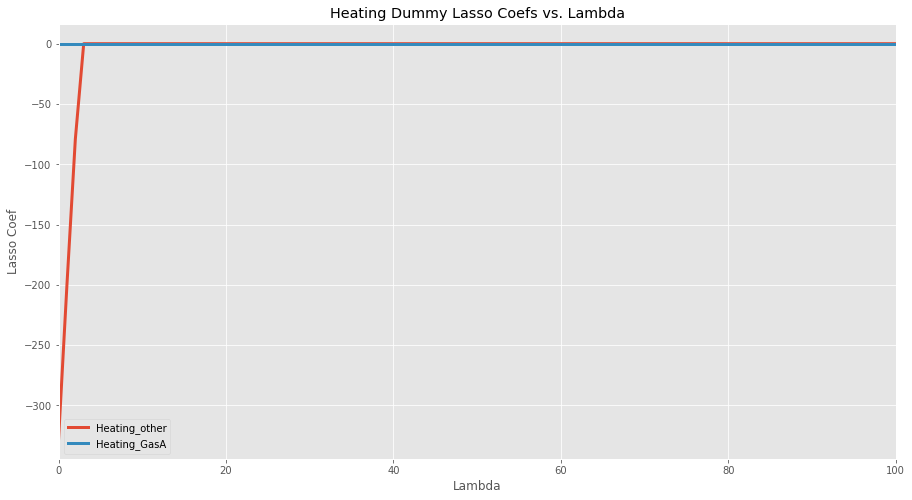

In [64]:
Heating_dummies = list(coefs_lasso.columns)[list(coefs_lasso.columns).index('Heating_other'):\
                                                list(coefs_lasso.columns).index('Heating_GasA')+1]

fig,ax = plt.subplots()
fig.set_size_inches(15,8)

for i in range(len(Heating_dummies)):
    sns.lineplot(x = coefs_lasso.index,y = Heating_dummies[i],data = coefs_lasso,label = Heating_dummies[i],linewidth = 3)

plt.xlim(0,100)
plt.title("Heating Dummy Lasso Coefs vs. Lambda")
plt.ylabel("Lasso Coef")
plt.xlabel("Lambda")
plt.legend()
plt.show()

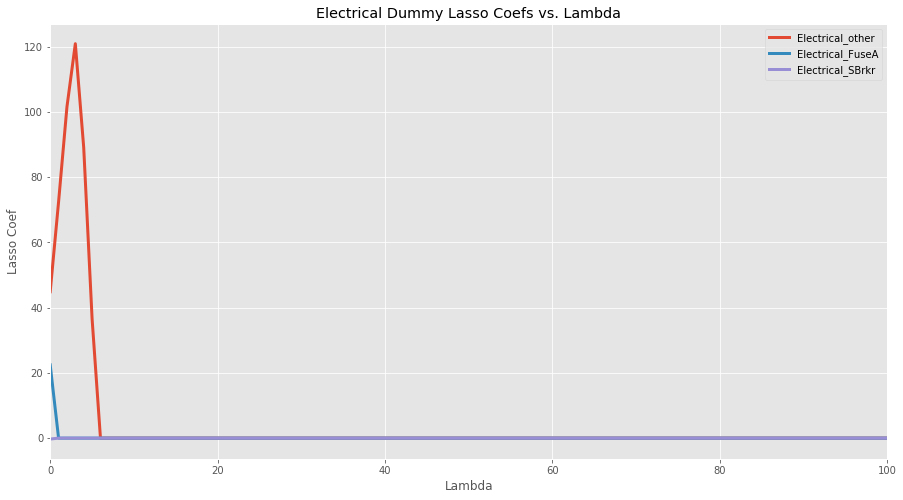

In [65]:
Electrical_dummies = list(coefs_lasso.columns)[list(coefs_lasso.columns).index('Electrical_other'):\
                                                list(coefs_lasso.columns).index('Electrical_SBrkr')+1]

fig,ax = plt.subplots()
fig.set_size_inches(15,8)

for i in range(len(Electrical_dummies)):
    sns.lineplot(x = coefs_lasso.index,y = Electrical_dummies[i],data = coefs_lasso,label = Electrical_dummies[i],linewidth = 3)

plt.xlim(0,100)
plt.title("Electrical Dummy Lasso Coefs vs. Lambda")
plt.ylabel("Lasso Coef")
plt.xlabel("Lambda")
plt.legend()
plt.show()

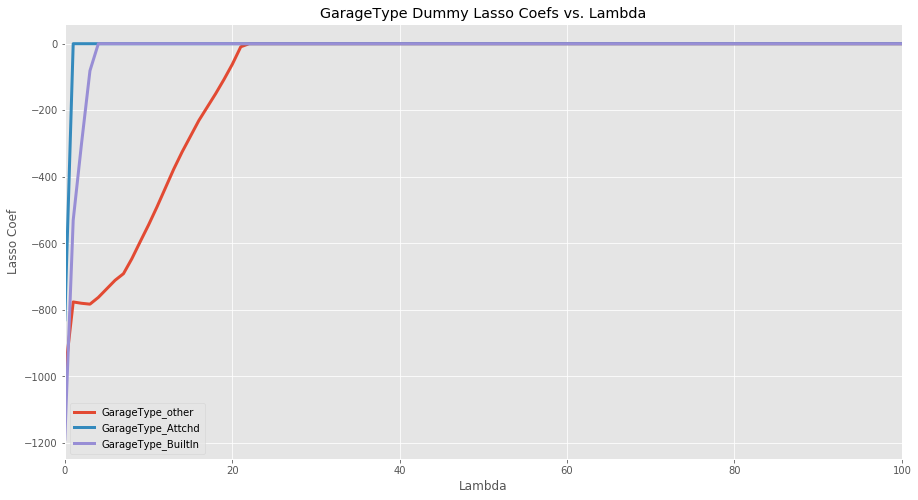

In [66]:
GarageType_dummies = list(coefs_lasso.columns)[list(coefs_lasso.columns).index('GarageType_other'):\
                                              list(coefs_lasso.columns).index('GarageType_Detchd')]

fig,ax = plt.subplots()
fig.set_size_inches(15,8)

for i in range(len(GarageType_dummies)):
    sns.lineplot(x = coefs_lasso.index,y = GarageType_dummies[i],data = coefs_lasso,label =  GarageType_dummies[i],linewidth = 3)

plt.xlim(0,100)
plt.title("GarageType Dummy Lasso Coefs vs. Lambda")
plt.ylabel("Lasso Coef")
plt.xlabel("Lambda")
plt.legend()
plt.show()

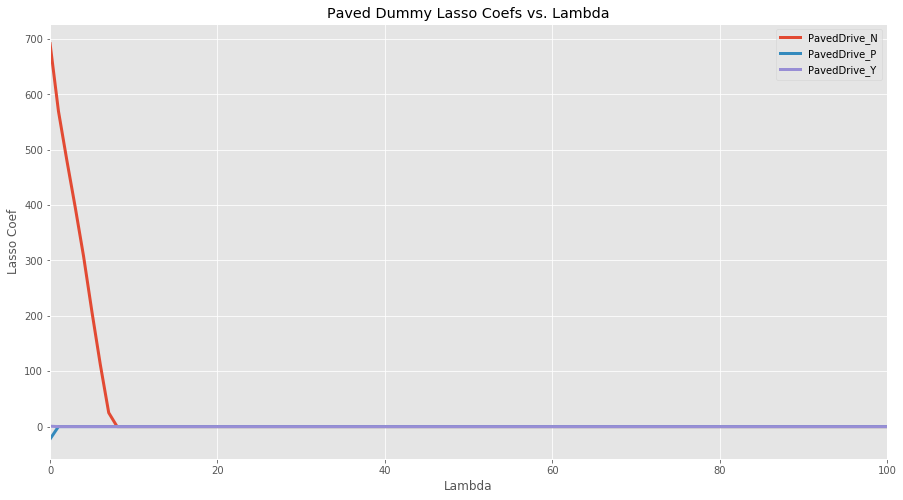

In [67]:
Paved_dummies = list(coefs_lasso.columns)[list(coefs_lasso.columns).index('PavedDrive_N'):]

fig,ax = plt.subplots()
fig.set_size_inches(15,8)

for i in range(len(Paved_dummies)):
    sns.lineplot(x = coefs_lasso.index,y = Paved_dummies[i],data = coefs_lasso,label =  Paved_dummies[i],linewidth = 3)

plt.xlim(0,100)
plt.title("Paved Dummy Lasso Coefs vs. Lambda")
plt.ylabel("Lasso Coef")
plt.xlabel("Lambda")
plt.legend()
plt.show()

# Train Test Split Before Feature Engineering

In [68]:
import copy

try:  # train_test_split was moved in 0.18.0
    from sklearn.model_selection import train_test_split
except:  # Following import works through 0.19 but outputs a warning in 0.18
    from sklearn.cross_validation import train_test_split

In [69]:
data = tr.copy() # tr is a copy of the dummified set (so data is a copy of a copy...)

Y = data['SalePrice']
X = data.drop(['SalePrice','MoSold','YrSold'], axis = 1)
X_train,X_test,y_train,y_test = train_test_split(X,Y,test_size = .2, random_state = 0)


X_train.loc[:,'SalePrice'] = y_train ########## adding SalePrice back so we have an overall train and test set
X_test.loc[:,'SalePrice'] = y_test

X_test.head()

,MapRefNo,Neighborhood,GrLivArea,LotArea,LotShape,LandSlope,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,CentralAir,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MSSubClass_other,MSSubClass_1-1/2 STORY FINISHED ALL AGES,MSSubClass_1-STORY 1945 & OLDER,MSSubClass_1-STORY 1946 & NEWER ALL STYLES,MSSubClass_1-STORY PUD (Planned Unit Development) - 1946 & NEWER,MSSubClass_2-STORY 1945 & OLDER,MSSubClass_2-STORY 1946 & NEWER,MSSubClass_2-STORY PUD - 1946 & NEWER,MSSubClass_DUPLEX - ALL STYLES AND AGES,MSSubClass_SPLIT OR MULTI-LEVEL,MSZoning_other,MSZoning_FV,MSZoning_RL,MSZoning_RM,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_AllPub,Utilities_NoSewr,LotConfig_other,LotConfig_CulDSac,LotConfig_FR2,LotConfig_Inside,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_Greens,Neighborhood_GrnHill,Neighborhood_IDOTRR,Neighborhood_Landmrk,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_other,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition2_other,Condition2_Norm,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_other,HouseStyle_1.5Fin,HouseStyle_1Story,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_other,RoofStyle_Gable,RoofStyle_Hip,RoofMatl_other,RoofMatl_CompShg,Exterior1st_other,Exterior1st_BrkFace,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_other,Exterior2nd_BrkFace,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_MetalSd,Exterior2nd_Plywood,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_other,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_other,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Heating_other,Heating_GasA,Electrical_other,Electrical_FuseA,Electrical_SBrkr,GarageType_other,GarageType_Attchd,GarageType_BuiltIn,GarageType_Detchd,PavedDrive_N,PavedDrive_P,PavedDrive_Y,SalePrice
898,903233100,BrkSide,1576,6240,0,1,5,6,1928,1950,0.0,3,3,3,3,1,1,0.0,1,0.0,1042.0,1042.0,5,1,1042,534,0,0.0,0.0,1,0,3,1,3,8,8,1,1928.0,1,1.0,225.0,3,3,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,1,149000
182,528363070,NoRidge,2494,10236,1,1,8,5,1994,1995,501.0,4,3,4,3,4,6,380.0,4,168.0,742.0,1290.0,5,1,1305,1189,0,1.0,0.0,2,1,4,1,4,9,8,1,1994.0,3,3.0,803.0,3,3,200,95,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,1,0,0,1,0,1,0,0,0,0,1,321000
565,906394050,CollgCr,1314,9317,1,1,6,5,2006,2006,0.0,4,3,4,3,1,6,24.0,1,0.0,1290.0,1314.0,4,1,1314,0,0,0.0,0.0,2,0,3,1,4,6,8,1,2006.0,2,2.0,440.0,3,3,0,22,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,1,0,0,1,0,1,0,0,0,0,1,176432
457

In [70]:
X_train.shape

(1902, 164)

In [71]:
X_test.shape

(476, 164)

In [72]:
list(X_train.columns) == list(X_test.columns)

True

In [73]:
X_train.loc[:,'SalePrice'] = y_train
X_test.loc[:,'SalePrice'] = y_test

# Checking SalePrice has a similar distribution in both the train and test set.

(array([ 61., 714., 625., 295., 117.,  47.,  25.,  11.,   2.,   5.]),
 array([ 35000.,  94000., 153000., 212000., 271000., 330000., 389000.,
        448000., 507000., 566000., 625000.]),
 <a list of 10 Patch objects>)

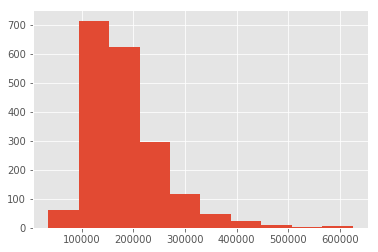

In [74]:
plt.hist(x = y_train)

(array([ 20., 223., 142.,  53.,  28.,   6.,   1.,   1.,   1.,   1.]),
 array([ 12789. ,  87010.1, 161231.2, 235452.3, 309673.4, 383894.5,
        458115.6, 532336.7, 606557.8, 680778.9, 755000. ]),
 <a list of 10 Patch objects>)

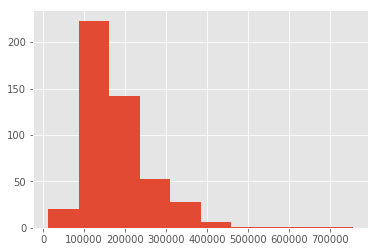

In [75]:
plt.hist(x = y_test)

In [76]:
train = X_train.copy() # contains SalePrice
test = X_test.copy() # contains SalePrice

In [77]:
list(train.columns) == list(test.columns)

True

In [78]:
data.loc[data['MapRefNo'] == 909176150]

,MapRefNo,Neighborhood,GrLivArea,SalePrice,LotArea,LotShape,LandSlope,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,CentralAir,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,MSSubClass_other,MSSubClass_1-1/2 STORY FINISHED ALL AGES,MSSubClass_1-STORY 1945 & OLDER,MSSubClass_1-STORY 1946 & NEWER ALL STYLES,MSSubClass_1-STORY PUD (Planned Unit Development) - 1946 & NEWER,MSSubClass_2-STORY 1945 & OLDER,MSSubClass_2-STORY 1946 & NEWER,MSSubClass_2-STORY PUD - 1946 & NEWER,MSSubClass_DUPLEX - ALL STYLES AND AGES,MSSubClass_SPLIT OR MULTI-LEVEL,MSZoning_other,MSZoning_FV,MSZoning_RL,MSZoning_RM,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_AllPub,Utilities_NoSewr,LotConfig_other,LotConfig_CulDSac,LotConfig_FR2,LotConfig_Inside,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_Greens,Neighborhood_GrnHill,Neighborhood_IDOTRR,Neighborhood_Landmrk,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_other,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition2_other,Condition2_Norm,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_other,HouseStyle_1.5Fin,HouseStyle_1Story,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_other,RoofStyle_Gable,RoofStyle_Hip,RoofMatl_other,RoofMatl_CompShg,Exterior1st_other,Exterior1st_BrkFace,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_other,Exterior2nd_BrkFace,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_MetalSd,Exterior2nd_Plywood,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_other,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_other,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Heating_other,Heating_GasA,Electrical_other,Electrical_FuseA,Electrical_SBrkr,GarageType_other,GarageType_Attchd,GarageType_BuiltIn,GarageType_Detchd,PavedDrive_N,PavedDrive_P,PavedDrive_Y
0,909176150,SWISU,856,126000,7890,0,1,6,6,1939,1950,0.0,3,3,3,3,1,3,238.0,1,0.0,618.0,856.0,3,1,856,0,0,1.0,0.0,1,0,2,1,3,4,8,1,1939.0,1,2.0,399.0,3,3,0,0,0,0,166,0,0,3,2010,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1


In [79]:
train.loc[train['MapRefNo'] == 909176150]

,MapRefNo,Neighborhood,GrLivArea,LotArea,LotShape,LandSlope,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,CentralAir,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MSSubClass_other,MSSubClass_1-1/2 STORY FINISHED ALL AGES,MSSubClass_1-STORY 1945 & OLDER,MSSubClass_1-STORY 1946 & NEWER ALL STYLES,MSSubClass_1-STORY PUD (Planned Unit Development) - 1946 & NEWER,MSSubClass_2-STORY 1945 & OLDER,MSSubClass_2-STORY 1946 & NEWER,MSSubClass_2-STORY PUD - 1946 & NEWER,MSSubClass_DUPLEX - ALL STYLES AND AGES,MSSubClass_SPLIT OR MULTI-LEVEL,MSZoning_other,MSZoning_FV,MSZoning_RL,MSZoning_RM,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_AllPub,Utilities_NoSewr,LotConfig_other,LotConfig_CulDSac,LotConfig_FR2,LotConfig_Inside,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_Greens,Neighborhood_GrnHill,Neighborhood_IDOTRR,Neighborhood_Landmrk,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_other,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition2_other,Condition2_Norm,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_other,HouseStyle_1.5Fin,HouseStyle_1Story,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_other,RoofStyle_Gable,RoofStyle_Hip,RoofMatl_other,RoofMatl_CompShg,Exterior1st_other,Exterior1st_BrkFace,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_other,Exterior2nd_BrkFace,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_MetalSd,Exterior2nd_Plywood,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_other,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_other,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Heating_other,Heating_GasA,Electrical_other,Electrical_FuseA,Electrical_SBrkr,GarageType_other,GarageType_Attchd,GarageType_BuiltIn,GarageType_Detchd,PavedDrive_N,PavedDrive_P,PavedDrive_Y,SalePrice
0,909176150,SWISU,856,7890,0,1,6,6,1939,1950,0.0,3,3,3,3,1,3,238.0,1,0.0,618.0,856.0,3,1,856,0,0,1.0,0.0,1,0,2,1,3,4,8,1,1939.0,1,2.0,399.0,3,3,0,0,0,0,166,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,1,0,0,1,0,0,0,1,0,0,1,126000


# Looking Into Square Footage Variables:

We consider 2 groups:

 - Within House:

1stFlrSF,2ndFlrSF,BsmntFinSF1,BsmntFinSF2,BsmtUnfSF,GrLivArea,LowQualFinSF,TotalBsmtSF

 - Auxillary:
 
3SsnPorch,EnclosedPorch,GarageArea,LotArea,MasVnrArea,OpenPorchSF,PoolArea,ScreenPorch,WoodDeckSF

**Some Within House Square Footage Feature Engineering:**

In [80]:
################################################################################# 
################################## TRAIN ########################################
#################################################################################


whsf_cols = ['SalePrice','1stFlrSF','2ndFlrSF','BsmtFinSF1','BsmtFinSF2','BsmtUnfSF','GrLivArea','LowQualFinSF','TotalBsmtSF']
whsf = ghd().set_index('var').loc[whsf_cols,:] #within house sf

################################################################################# Total Square Footage Including Basement Within House

train.loc[:,'TotalSF'] = train['GrLivArea'] + train['TotalBsmtSF']
whsf_cols.append('TotalSF')
whsf = ghd().set_index('var').loc[whsf_cols,:]

################################################################################# Price per Square Foot Within House

train.loc[:,'Price/SF'] = train['SalePrice']/train['TotalSF']
whsf_cols.append('Price/SF')
whsf = ghd().set_index('var').loc[whsf_cols,:]

################################################################################# Percentage of Basement Unfinished


train.loc[:,'BsmtPercentUnfinished'] = train['BsmtUnfSF']/train['TotalBsmtSF']
whsf_cols.append('BsmtPercentUnfinished')
whsf = ghd().set_index('var').loc[whsf_cols,:]

################################################################################# Percentage of total within house sf that's finished & low quality


train.loc[:,'LowQualFinishedPercent'] = train['LowQualFinSF']/(train['TotalSF'])
whsf_cols.append('LowQualFinishedPercent')
whsf = ghd().set_index('var').loc[whsf_cols,:]

In [81]:
train[whsf.index].head()

,SalePrice,1stFlrSF,2ndFlrSF,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,GrLivArea,LowQualFinSF,TotalBsmtSF,TotalSF,Price/SF,BsmtPercentUnfinished,LowQualFinishedPercent
1736,113000,988,0,0.0,0.0,988.0,988,0,988.0,1976.0,57.186235,1.000000,0.0
1355,175500,1242,0,916.0,0.0,326.0,1242,0,1242.0,2484.0,70.652174,0.262480,0.0
6,187687,1246,0,0.0,0.0,1146.0,1246,0,1146.0,2392.0,78.464465,1.000000,0.0
900,136500,1050,0,915.0,0.0,135.0,1050,0,1050.0,2100.0,65.000000,0.128571,0.0
1677,143750,848,0,672.0,0.0,176.0,848,0,848.0,1696.0,84.758255,0.207547,0.0


In [82]:
################################################################################# 
################################## TEST #########################################
#################################################################################


whsf_cols = ['SalePrice','1stFlrSF','2ndFlrSF','BsmtFinSF1','BsmtFinSF2','BsmtUnfSF','GrLivArea','LowQualFinSF','TotalBsmtSF']
whsf = ghd().set_index('var').loc[whsf_cols,:] #within house sf

################################################################################# Total Square Footage Including Basement Within House

test.loc[:,'TotalSF'] = test['GrLivArea'] + test['TotalBsmtSF']
whsf_cols.append('TotalSF')
whsf = ghd().set_index('var').loc[whsf_cols,:]

################################################################################# Price per Square Foot Within House

test.loc[:,'Price/SF'] = test['SalePrice']/test['TotalSF']
whsf_cols.append('Price/SF')
whsf = ghd().set_index('var').loc[whsf_cols,:]

################################################################################# Percentage of Basement Unfinished


test.loc[:,'BsmtPercentUnfinished'] = test['BsmtUnfSF']/test['TotalBsmtSF']
whsf_cols.append('BsmtPercentUnfinished')
whsf = ghd().set_index('var').loc[whsf_cols,:]

################################################################################# Percentage of total within house sf that's finished & low quality


test.loc[:,'LowQualFinishedPercent'] = test['LowQualFinSF']/(test['TotalSF'])
whsf_cols.append('LowQualFinishedPercent')
whsf = ghd().set_index('var').loc[whsf_cols,:]

In [83]:
test[whsf.index].head()

,SalePrice,1stFlrSF,2ndFlrSF,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,GrLivArea,LowQualFinSF,TotalBsmtSF,TotalSF,Price/SF,BsmtPercentUnfinished,LowQualFinishedPercent
898,149000,1042,534,0.0,0.0,1042.0,1576,0,1042.0,2618.0,56.913675,1.000000,0.0
182,321000,1305,1189,380.0,168.0,742.0,2494,0,1290.0,3784.0,84.830867,0.575194,0.0
565,176432,1314,0,24.0,0.0,1290.0,1314,0,1314.0,2628.0,67.135464,0.981735,0.0
457,164000,1216,0,897.0,0.0,319.0,1216,0,1216.0,2432.0,67.434211,0.262336,0.0
1853,255000,1091,898,932.0,0.0,133.0,1989,0,1065.0,3054.0,83.497053,0.124883,0.0


**Some Auxillary Square Footage Feature Engineering:**

In [84]:
################################################################################# 
################################## TRAIN ########################################
#################################################################################



auxsf_cols = ['SalePrice','3SsnPorch','EnclosedPorch','GarageArea','LotArea','OpenPorchSF','PoolArea','ScreenPorch','WoodDeckSF']
auxsf = ghd().set_index('var').loc[auxsf_cols,:] #auxillary house sf
#auxsf

################################################################################# Auxillary Total Square Footage

train.loc[:,'TotalAuxSF'] = [np.sum(train[auxsf.index[1:-1]].iloc[i,:]) for i in range(0,len(train))]
auxsf_cols.append('TotalAuxSF')
auxsf = ghd().set_index('var').loc[auxsf_cols,:]

################################################################################# difference from mean total aux sf

train.loc[:,'relativeAuxSF'] =  train['TotalAuxSF'] - np.mean(train['TotalAuxSF'])
auxsf_cols.append('relativeAuxSF')
auxsf = ghd().set_index('var').loc[auxsf_cols,:]

################################################################################# Price per auxillary SF
train.loc[:,'Price/AuxSF'] =  train['SalePrice']/train['TotalAuxSF']
auxsf_cols.append('Price/AuxSF')
auxsf = ghd().set_index('var').loc[auxsf_cols,:]



### Log Transformations

train.loc[:,'LogSalePrice'] = train['SalePrice'].apply(lambda x: np.log(x))
# train.loc[:,'LogYearBuilt'] = train['YearBuilt'].apply(lambda x: np.log(x))
# train.loc[:,'LogGarageYearBuilt'] = train['GarageYrBlt'].apply(lambda x: np.log(x))
# train.loc[:,'LogYearRemodAdd'] = train['YearRemodAdd'].apply(lambda x: np.log(x))

In [85]:
train.head()

,MapRefNo,Neighborhood,GrLivArea,LotArea,LotShape,LandSlope,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,CentralAir,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MSSubClass_other,MSSubClass_1-1/2 STORY FINISHED ALL AGES,MSSubClass_1-STORY 1945 & OLDER,MSSubClass_1-STORY 1946 & NEWER ALL STYLES,MSSubClass_1-STORY PUD (Planned Unit Development) - 1946 & NEWER,MSSubClass_2-STORY 1945 & OLDER,MSSubClass_2-STORY 1946 & NEWER,MSSubClass_2-STORY PUD - 1946 & NEWER,MSSubClass_DUPLEX - ALL STYLES AND AGES,MSSubClass_SPLIT OR MULTI-LEVEL,MSZoning_other,MSZoning_FV,MSZoning_RL,MSZoning_RM,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_AllPub,Utilities_NoSewr,LotConfig_other,LotConfig_CulDSac,LotConfig_FR2,LotConfig_Inside,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_Greens,Neighborhood_GrnHill,Neighborhood_IDOTRR,Neighborhood_Landmrk,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_other,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition2_other,Condition2_Norm,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_other,HouseStyle_1.5Fin,HouseStyle_1Story,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_other,RoofStyle_Gable,RoofStyle_Hip,RoofMatl_other,RoofMatl_CompShg,Exterior1st_other,Exterior1st_BrkFace,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_other,Exterior2nd_BrkFace,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_MetalSd,Exterior2nd_Plywood,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_other,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_other,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Heating_other,Heating_GasA,Electrical_other,Electrical_FuseA,Electrical_SBrkr,GarageType_other,GarageType_Attchd,GarageType_BuiltIn,GarageType_Detchd,PavedDrive_N,PavedDrive_P,PavedDrive_Y,SalePrice,TotalSF,Price/SF,BsmtPercentUnfinished,LowQualFinishedPercent,TotalAuxSF,relativeAuxSF,Price/AuxSF,LogSalePrice
1736,923250210,Mitchel,988,21750,0,2,5,5,1954,1954,0.0,3,3,3,3,1,1,0.0,1,0.0,988.0,988.0,5,1,988,0,0,0.0,0.0,1,0,2,1,3,4,8,0,1954.0,2,2.0,520.0,3,3,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,1,0,0,1,0,0,1,0,0,113000,1976.0,57.186235,1.000000,0.0,22270.0,11502.443218,5.074091,11.635143
1355,534177210,NWAmes,1242,9600,0,1,7,6,1973,1973,320.0,3,3,3,3,1,5,916.0,1,0.0,326.0,1242.0,2,1,1242,0,0,0.0,0.0,1,1,3,1,3,6,8,1,1973.0,1,2.0,528.0,3,3,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,1,0,0,0,0,1,175500,2484.0,70.652174,0.262480,0.0,10128.0,-639.556782,17.328199,12.075394
6,528228540,Blmngtn,1246,3710,0,1,7,5,2007,2008,20.0,4,3,4,3,4,1,0.0,1,0.0,1146.0,1146.0,5,1,1246,0,0,0.0,0.0,2,0,2,1,4,5,8,1,2007.0,3,2.0,428.0,3,3,100,24,0,0,0,0

In [86]:
################################################################################# 
################################## TEST #########################################
#################################################################################


auxsf_cols = ['SalePrice','3SsnPorch','EnclosedPorch','GarageArea','LotArea','OpenPorchSF','PoolArea','ScreenPorch','WoodDeckSF']
auxsf = ghd().set_index('var').loc[auxsf_cols,:] #auxillary house sf
#auxsf

################################################################################# Auxillary Total Square Footage

test.loc[:,'TotalAuxSF'] = [np.sum(test[auxsf.index[1:-1]].iloc[i,:]) for i in range(0,len(test))]
auxsf_cols.append('TotalAuxSF')
auxsf = ghd().set_index('var').loc[auxsf_cols,:]

################################################################################# difference from mean total aux sf

test.loc[:,'relativeAuxSF'] =  test['TotalAuxSF'] - np.mean(test['TotalAuxSF'])
auxsf_cols.append('relativeAuxSF')
auxsf = ghd().set_index('var').loc[auxsf_cols,:]

################################################################################# Price per auxillary SF
test.loc[:,'Price/AuxSF'] =  test['SalePrice']/test['TotalAuxSF']
auxsf_cols.append('Price/AuxSF')
auxsf = ghd().set_index('var').loc[auxsf_cols,:]


### Log Transformations

test.loc[:,'LogSalePrice'] = test['SalePrice'].apply(lambda x: np.log(x))
# test.loc[:,'LogYearBuilt'] = test['YearBuilt'].apply(lambda x: np.log(x))
# test.loc[:,'LogGarageYearBuilt'] = test['GarageYrBlt'].apply(lambda x: np.log(x))
# test.loc[:,'LogYearRemodAdd'] = test['YearRemodAdd'].apply(lambda x: np.log(x))

In [87]:
test.head()

,MapRefNo,Neighborhood,GrLivArea,LotArea,LotShape,LandSlope,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,CentralAir,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MSSubClass_other,MSSubClass_1-1/2 STORY FINISHED ALL AGES,MSSubClass_1-STORY 1945 & OLDER,MSSubClass_1-STORY 1946 & NEWER ALL STYLES,MSSubClass_1-STORY PUD (Planned Unit Development) - 1946 & NEWER,MSSubClass_2-STORY 1945 & OLDER,MSSubClass_2-STORY 1946 & NEWER,MSSubClass_2-STORY PUD - 1946 & NEWER,MSSubClass_DUPLEX - ALL STYLES AND AGES,MSSubClass_SPLIT OR MULTI-LEVEL,MSZoning_other,MSZoning_FV,MSZoning_RL,MSZoning_RM,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_AllPub,Utilities_NoSewr,LotConfig_other,LotConfig_CulDSac,LotConfig_FR2,LotConfig_Inside,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_Greens,Neighborhood_GrnHill,Neighborhood_IDOTRR,Neighborhood_Landmrk,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_other,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition2_other,Condition2_Norm,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_other,HouseStyle_1.5Fin,HouseStyle_1Story,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_other,RoofStyle_Gable,RoofStyle_Hip,RoofMatl_other,RoofMatl_CompShg,Exterior1st_other,Exterior1st_BrkFace,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_other,Exterior2nd_BrkFace,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_MetalSd,Exterior2nd_Plywood,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_other,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_other,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Heating_other,Heating_GasA,Electrical_other,Electrical_FuseA,Electrical_SBrkr,GarageType_other,GarageType_Attchd,GarageType_BuiltIn,GarageType_Detchd,PavedDrive_N,PavedDrive_P,PavedDrive_Y,SalePrice,TotalSF,Price/SF,BsmtPercentUnfinished,LowQualFinishedPercent,TotalAuxSF,relativeAuxSF,Price/AuxSF,LogSalePrice
898,903233100,BrkSide,1576,6240,0,1,5,6,1928,1950,0.0,3,3,3,3,1,1,0.0,1,0.0,1042.0,1042.0,5,1,1042,534,0,0.0,0.0,1,0,3,1,3,8,8,1,1928.0,1,1.0,225.0,3,3,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,1,149000,2618.0,56.913675,1.000000,0.0,6465.0,-4434.109244,23.047177,11.911702
182,528363070,NoRidge,2494,10236,1,1,8,5,1994,1995,501.0,4,3,4,3,4,6,380.0,4,168.0,742.0,1290.0,5,1,1305,1189,0,1.0,0.0,2,1,4,1,4,9,8,1,1994.0,3,3.0,803.0,3,3,200,95,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,1,0,0,1,0,1,0,0,0,0,1,321000,3784.0,84.830867,0.575194,0.0,11134.0,234.890756,28.830609,12.679196
565,906394050,CollgCr,1314,9317,1,1,6,5,2006,2006,0.0,4,3,4,3,1,6,24.0,1,0.0,1290.0,1314.0,4,1,1314,0,0,0.0,0.0,2,0,3,1,4,6,8,1,2006.0,2,2.0,440.0,3,3,

In [88]:
list(train.columns) == list(test.columns)

True

# Exporting Prepared train and test Sets to CSV

In [89]:
train.to_csv('../Data_Master/TRAIN.csv')
test.to_csv('../Data_Master/TEST.csv')

In [133]:
pd.read_csv('../Data_Master/TRAIN.csv').shape

(1902, 173)

In [134]:
pd.read_csv('../Data_Master/TEST.csv').shape

(476, 173)

# EDA

In [95]:
import copy

def corr_filter(df,thresh,less_or_eq):
    
    if (less_or_eq == True):
        j = copy.deepcopy(df)
        for i in df.columns.to_numpy():
            j[i] = np.where(np.abs(j[i]) <= thresh,'',j[i])
        
        return j
    
    elif(less_or_eq == False):
        j = copy.deepcopy(df)
        for i in df.columns.to_numpy():
            j[i] = np.where(np.abs(j[i]) > thresh,'',j[i])
        
        return j

def filtered_Heat(df,t,h,w,a,dir_):
    
    if dir_ == True:
        
        sign = '>'
        
    else:
        
        sign = '<='
        
    M = corr_filter(df,thresh = t,less_or_eq = dir_)
    fig = px.imshow(M,width = w, height = w,aspect = a,
                color_continuous_scale = 'blues',
                title = f'Filtered Heatmap: |Corr| {sign} {t}')
    fig.show()

In [96]:
train_corr = pd.DataFrame(train.corr())
#hrescorr = pd.DataFrame(hres.corr())
#hrescorr_nonull = hrescorr.dropna(axis = 0,how = 'all').dropna(axis = 1,how = 'all')

#filtered_Heat(train_corr,0,h=1100,w=800,a=1,dir_ = True) #merged dataset heatmap

fig = px.imshow(train_corr[['SalePrice']].sort_values(by = 'SalePrice', ascending = False).T,
                width = 1000, height = 600, aspect = 1,
                color_continuous_scale = 'Turbo',
                title = 'Sale Price Heatmap Housing Dataset')
fig.show()


fig = px.imshow(train_corr[['OverallQual']].sort_values(by = 'OverallQual', ascending = False).T,
                width = 1000, height = 600, aspect = 1,
                color_continuous_scale = 'Turbo',
                title = 'Overall Quality Heatmap Housing Dataset')
fig.show()



# fig = px.imshow(train_corr[['Price/SF']].sort_values(by = 'Price/SF', ascending = False).T,
#                 width = 1500, height = 500, aspect = 1,
#                 color_continuous_scale = 'Turbo',
#                 title = 'Price/SF Heatmap Housing Dataset')
# fig.show()

### Correlation Lists

In [107]:
sale_cors =  train_corr[['LogSalePrice']].sort_values(by = 'LogSalePrice', ascending = False) 
# sorted correlations with LogSalePrice from test dataset

price_rate_cors = train_corr[['Price/SF']].sort_values(by = 'Price/SF', ascending = False) 
# sorted correlations with Price/SF from test dataset

# Trends vs. LogSalePrice

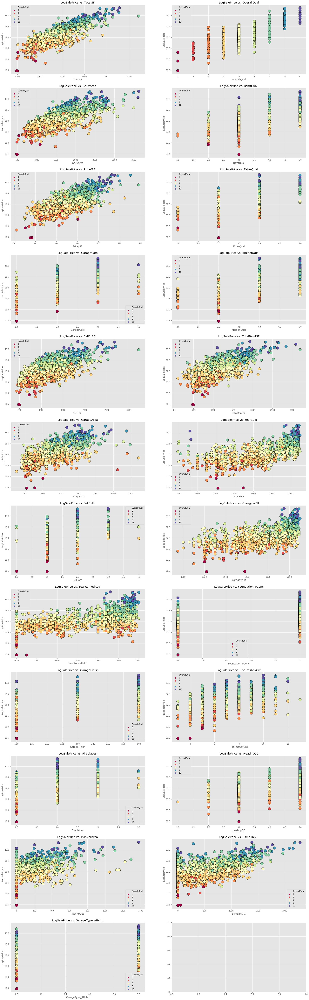

In [108]:
fig, axs = plt.subplots(12,2, figsize=(18, 60))
plt.subplots_adjust(right=1.3, top=1.3)
axs = axs.flatten()
for i, col in enumerate(list(sale_cors.index[2:25])):
    sns.scatterplot(y='LogSalePrice', x=col, s = 200,ax=axs[i],
                    hue = 'OverallQual',palette="Spectral",
                    edgecolor = 'black',data=train)
    axs[i].set_ylabel('LogSalePrice')
    axs[i].set_xlabel(col)
    axs[i].set_title(f'LogSalePrice vs. {col}')
plt.show()

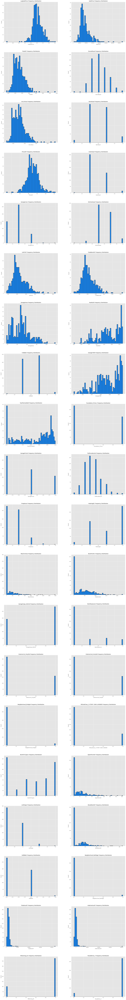

In [109]:
fig, axs = plt.subplots(20,2, figsize=(18, 60))
plt.subplots_adjust(right=1.3, top=3,wspace = .25,hspace = .25)
axs = axs.flatten()
for i, col in enumerate(list(sale_cors.index[:40])):
    axs[i].hist(x=col,data=test,edgecolor = 'black',
                color = 'dodgerblue',linewidth = 2, bins = 50)
    axs[i].set_ylabel('Count')
    axs[i].set_xlabel(col)
    axs[i].set_title(f'{col} Frequency Distribution')

In [100]:
# qual_cors = train_corr[['OverallQual']].sort_values(by = 'OverallQual', ascending = False)

# fig, axs = plt.subplots(12,2, figsize=(18, 60))
# plt.subplots_adjust(right=1.3, top=1.3)
# axs = axs.flatten()
# for i, col in enumerate(list(qual_cors.index[1:25])):
#     sns.scatterplot(y=col, x='OverallQual',s=100 ,ax=axs[i],
#                     hue = 'LogSalePrice',palette="Spectral",
#                     edgecolor = 'black',data=train)
#     axs[i].set_ylabel(col)
#     axs[i].set_xlabel('Overall Quality')
#     axs[i].set_title(f'{col} Overall Quality')
# plt.show()

# Boxplots vs. Overall Quality

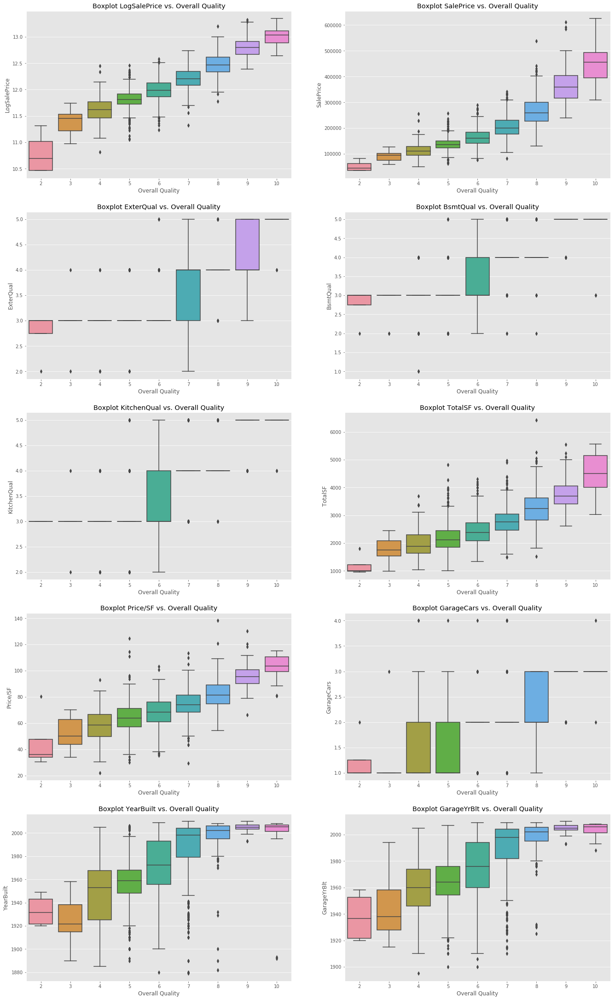

In [110]:
qual_cors = train_corr[['OverallQual']].sort_values(by = 'OverallQual', ascending = False)

fig, axs = plt.subplots(int(np.ceil(len(qual_cors.index[1:11])/2)),2,figsize = (15,6))
plt.subplots_adjust(right=1.3, top=5)
axs = axs.flatten()
for i, col in enumerate(qual_cors.index[1:11]):
    sns.boxplot(x='OverallQual',y = col,ax=axs[i],data=train)
    axs[i].set_ylabel(f'{col}')
    axs[i].set_xlabel(f'Overall Quality')
    axs[i].set_title(f'Boxplot {col} vs. Overall Quality')
plt.show()

# Linear Model w/ Naive Feature Selection Based on Correlation w/ LogSalePrice Alone

In [111]:
import statsmodels.api as sm
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression

In [112]:
train.head()

,MapRefNo,Neighborhood,GrLivArea,LotArea,LotShape,LandSlope,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,CentralAir,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MSSubClass_other,MSSubClass_1-1/2 STORY FINISHED ALL AGES,MSSubClass_1-STORY 1945 & OLDER,MSSubClass_1-STORY 1946 & NEWER ALL STYLES,MSSubClass_1-STORY PUD (Planned Unit Development) - 1946 & NEWER,MSSubClass_2-STORY 1945 & OLDER,MSSubClass_2-STORY 1946 & NEWER,MSSubClass_2-STORY PUD - 1946 & NEWER,MSSubClass_DUPLEX - ALL STYLES AND AGES,MSSubClass_SPLIT OR MULTI-LEVEL,MSZoning_other,MSZoning_FV,MSZoning_RL,MSZoning_RM,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_AllPub,Utilities_NoSewr,LotConfig_other,LotConfig_CulDSac,LotConfig_FR2,LotConfig_Inside,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_Greens,Neighborhood_GrnHill,Neighborhood_IDOTRR,Neighborhood_Landmrk,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_other,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition2_other,Condition2_Norm,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_other,HouseStyle_1.5Fin,HouseStyle_1Story,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_other,RoofStyle_Gable,RoofStyle_Hip,RoofMatl_other,RoofMatl_CompShg,Exterior1st_other,Exterior1st_BrkFace,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_other,Exterior2nd_BrkFace,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_MetalSd,Exterior2nd_Plywood,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_other,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_other,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Heating_other,Heating_GasA,Electrical_other,Electrical_FuseA,Electrical_SBrkr,GarageType_other,GarageType_Attchd,GarageType_BuiltIn,GarageType_Detchd,PavedDrive_N,PavedDrive_P,PavedDrive_Y,SalePrice,TotalSF,Price/SF,BsmtPercentUnfinished,LowQualFinishedPercent,TotalAuxSF,relativeAuxSF,Price/AuxSF,LogSalePrice
1736,923250210,Mitchel,988,21750,0,2,5,5,1954,1954,0.0,3,3,3,3,1,1,0.0,1,0.0,988.0,988.0,5,1,988,0,0,0.0,0.0,1,0,2,1,3,4,8,0,1954.0,2,2.0,520.0,3,3,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,1,0,0,1,0,0,1,0,0,113000,1976.0,57.186235,1.000000,0.0,22270.0,11502.443218,5.074091,11.635143
1355,534177210,NWAmes,1242,9600,0,1,7,6,1973,1973,320.0,3,3,3,3,1,5,916.0,1,0.0,326.0,1242.0,2,1,1242,0,0,0.0,0.0,1,1,3,1,3,6,8,1,1973.0,1,2.0,528.0,3,3,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,1,0,0,0,0,1,175500,2484.0,70.652174,0.262480,0.0,10128.0,-639.556782,17.328199,12.075394
6,528228540,Blmngtn,1246,3710,0,1,7,5,2007,2008,20.0,4,3,4,3,4,1,0.0,1,0.0,1146.0,1146.0,5,1,1246,0,0,0.0,0.0,2,0,2,1,4,5,8,1,2007.0,3,2.0,428.0,3,3,100,24,0,0,0,0

Index(['TotalSF', 'OverallQual', 'BsmtQual'], dtype='object')
                            OLS Regression Results                            
Dep. Variable:           LogSalePrice   R-squared:                       0.831
Model:                            OLS   Adj. R-squared:                  0.831
Method:                 Least Squares   F-statistic:                     3107.
Date:                Wed, 08 Sep 2021   Prob (F-statistic):               0.00
Time:                        11:50:15   Log-Likelihood:                 936.65
No. Observations:                1902   AIC:                            -1865.
Df Residuals:                    1898   BIC:                            -1843.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------

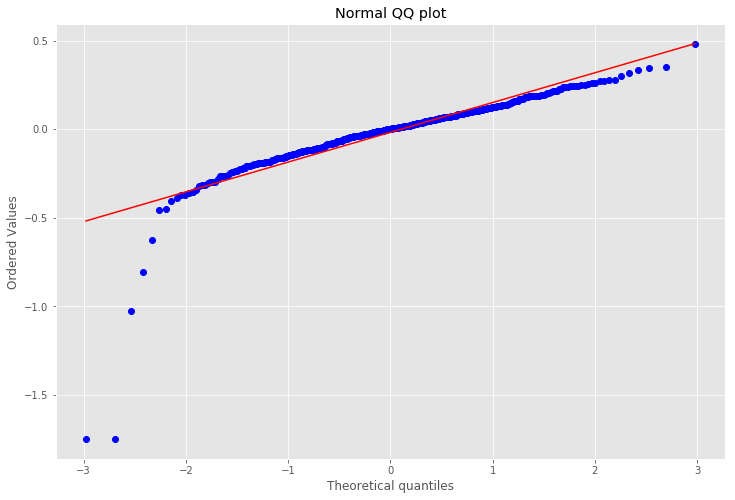

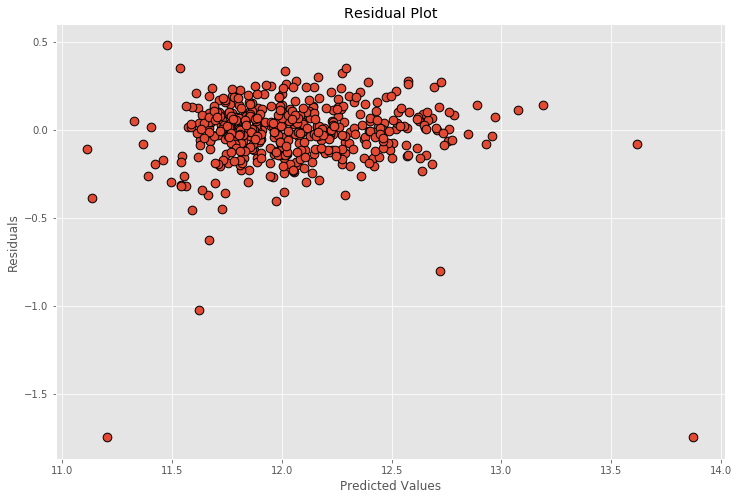

In [702]:
#tr = train[sale_cors.index.to_numpy()[:6]]
#ts = test[sale_cors.index.to_numpy()[:6]]


tr = train[['LogSalePrice','SalePrice','TotalSF', 'OverallQual', 'BsmtQual']]
ts = test[['LogSalePrice','SalePrice','TotalSF', 'OverallQual', 'BsmtQual']]


X_train = tr.drop(['LogSalePrice','SalePrice'], axis = 1)
X_test = ts.drop(['LogSalePrice','SalePrice'], axis = 1)
y_train = tr['LogSalePrice']
y_test = ts['LogSalePrice']

print(X_train.columns)

scaler = StandardScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled =  scaler.transform(X_test)

#################################################################### statsmodels
X_add_const = sm.add_constant(X_train_scaled)
model = sm.OLS(y_train, X_add_const)
results = model.fit()
print(results.summary())


###################################################################### sklearn

lm = LinearRegression()
lm.fit(X_train_scaled, y_train)
print(lm.score(X_test_scaled,y_test))
print(results.params)
##################################################################### diagnostic plots

residuals = y_test - lm.predict(X_test_scaled)
#residuals.hist(bins = 20,figsize = (10,10),edgecolor = 'black')

fig,ax = plt.subplots(figsize = (12,8))
ax.set_size_inches = (30,30)
sc.probplot(x= residuals, dist='norm', fit=True, plot=plt)
plt.title("Normal QQ plot")
plt.show()


fig, ax = plt.subplots()
fig.set_size_inches(12,8)
plt.scatter(x = lm.predict(X_test_scaled),y = residuals,edgecolors = 'black',linewidths = 1,s = 75)
plt.title('Residual Plot')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.show()

# Feature Selection with Lasso Regression:

In [114]:
from sklearn.linear_model import Lasso,Ridge,LassoLarsIC
from sklearn.model_selection import GridSearchCV

In [116]:
#list(train.columns)

In [117]:
X_train = train.drop(['LogSalePrice','SalePrice','Price/AuxSF','Price/SF','MapRefNo','Neighborhood'], axis = 1)
X_test = test.drop(['LogSalePrice','SalePrice','Price/AuxSF','Price/SF','MapRefNo','Neighborhood'], axis = 1)
y_train = train['LogSalePrice']
y_test = test['LogSalePrice']

In [119]:
X_train.head()

,GrLivArea,LotArea,LotShape,LandSlope,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,CentralAir,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MSSubClass_other,MSSubClass_1-1/2 STORY FINISHED ALL AGES,MSSubClass_1-STORY 1945 & OLDER,MSSubClass_1-STORY 1946 & NEWER ALL STYLES,MSSubClass_1-STORY PUD (Planned Unit Development) - 1946 & NEWER,MSSubClass_2-STORY 1945 & OLDER,MSSubClass_2-STORY 1946 & NEWER,MSSubClass_2-STORY PUD - 1946 & NEWER,MSSubClass_DUPLEX - ALL STYLES AND AGES,MSSubClass_SPLIT OR MULTI-LEVEL,MSZoning_other,MSZoning_FV,MSZoning_RL,MSZoning_RM,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_AllPub,Utilities_NoSewr,LotConfig_other,LotConfig_CulDSac,LotConfig_FR2,LotConfig_Inside,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_Greens,Neighborhood_GrnHill,Neighborhood_IDOTRR,Neighborhood_Landmrk,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_other,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition2_other,Condition2_Norm,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_other,HouseStyle_1.5Fin,HouseStyle_1Story,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_other,RoofStyle_Gable,RoofStyle_Hip,RoofMatl_other,RoofMatl_CompShg,Exterior1st_other,Exterior1st_BrkFace,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_other,Exterior2nd_BrkFace,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_MetalSd,Exterior2nd_Plywood,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_other,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_other,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Heating_other,Heating_GasA,Electrical_other,Electrical_FuseA,Electrical_SBrkr,GarageType_other,GarageType_Attchd,GarageType_BuiltIn,GarageType_Detchd,PavedDrive_N,PavedDrive_P,PavedDrive_Y,TotalSF,BsmtPercentUnfinished,LowQualFinishedPercent,TotalAuxSF,relativeAuxSF
1736,988,21750,0,2,5,5,1954,1954,0.0,3,3,3,3,1,1,0.0,1,0.0,988.0,988.0,5,1,988,0,0,0.0,0.0,1,0,2,1,3,4,8,0,1954.0,2,2.0,520.0,3,3,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,1,0,0,1,0,0,1,0,0,1976.0,1.000000,0.0,22270.0,11502.443218
1355,1242,9600,0,1,7,6,1973,1973,320.0,3,3,3,3,1,5,916.0,1,0.0,326.0,1242.0,2,1,1242,0,0,0.0,0.0,1,1,3,1,3,6,8,1,1973.0,1,2.0,528.0,3,3,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,1,0,1,0,0,0,0,1,2484.0,0.262480,0.0,10128.0,-639.556782
6,1246,3710,0,1,7,5,2007,2008,20.0,4,3,4,3,4,1,0.0,1,0.0,1146.0,1146.0,5,1,1246,0,0,0.0,0.0,2,0,2,1,4,5,8,1,2007.0,3,2.0,428.0,3,3,100,24,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,1

In [118]:
X_test.head()

,GrLivArea,LotArea,LotShape,LandSlope,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,HeatingQC,CentralAir,1stFlrSF,2ndFlrSF,LowQualFinSF,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MSSubClass_other,MSSubClass_1-1/2 STORY FINISHED ALL AGES,MSSubClass_1-STORY 1945 & OLDER,MSSubClass_1-STORY 1946 & NEWER ALL STYLES,MSSubClass_1-STORY PUD (Planned Unit Development) - 1946 & NEWER,MSSubClass_2-STORY 1945 & OLDER,MSSubClass_2-STORY 1946 & NEWER,MSSubClass_2-STORY PUD - 1946 & NEWER,MSSubClass_DUPLEX - ALL STYLES AND AGES,MSSubClass_SPLIT OR MULTI-LEVEL,MSZoning_other,MSZoning_FV,MSZoning_RL,MSZoning_RM,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_AllPub,Utilities_NoSewr,LotConfig_other,LotConfig_CulDSac,LotConfig_FR2,LotConfig_Inside,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_Greens,Neighborhood_GrnHill,Neighborhood_IDOTRR,Neighborhood_Landmrk,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_other,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition2_other,Condition2_Norm,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_other,HouseStyle_1.5Fin,HouseStyle_1Story,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_other,RoofStyle_Gable,RoofStyle_Hip,RoofMatl_other,RoofMatl_CompShg,Exterior1st_other,Exterior1st_BrkFace,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior2nd_other,Exterior2nd_BrkFace,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_MetalSd,Exterior2nd_Plywood,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,MasVnrType_other,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,Foundation_other,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Heating_other,Heating_GasA,Electrical_other,Electrical_FuseA,Electrical_SBrkr,GarageType_other,GarageType_Attchd,GarageType_BuiltIn,GarageType_Detchd,PavedDrive_N,PavedDrive_P,PavedDrive_Y,TotalSF,BsmtPercentUnfinished,LowQualFinishedPercent,TotalAuxSF,relativeAuxSF
898,1576,6240,0,1,5,6,1928,1950,0.0,3,3,3,3,1,1,0.0,1,0.0,1042.0,1042.0,5,1,1042,534,0,0.0,0.0,1,0,3,1,3,8,8,1,1928.0,1,1.0,225.0,3,3,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,1,2618.0,1.000000,0.0,6465.0,-4434.109244
182,2494,10236,1,1,8,5,1994,1995,501.0,4,3,4,3,4,6,380.0,4,168.0,742.0,1290.0,5,1,1305,1189,0,1.0,0.0,2,1,4,1,4,9,8,1,1994.0,3,3.0,803.0,3,3,200,95,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,1,0,1,0,0,1,0,1,0,0,0,0,1,3784.0,0.575194,0.0,11134.0,234.890756
565,1314,9317,1,1,6,5,2006,2006,0.0,4,3,4,3,1,6,24.0,1,0.0,1290.0,1314.0,4,1,1314,0,0,0.0,0.0,2,0,3,1,4,6,8,1,2006.0,2,2.0,440.0,3,3,0,22,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0

In [120]:
scaler = StandardScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
scaler.fit(X_test)
X_test_scaled =  scaler.transform(X_test)


lasso = Lasso()

alpha_range = np.linspace(0,.01,100)
lasso.set_params(normalize=True)
coefs_lasso  = []
scores = []

for alpha in alpha_range:
        lasso.set_params(alpha=alpha)
        lasso.fit(X_train_scaled,y_train)  
        coefs_lasso.append(lasso.coef_)
        scores.append(lasso.score(X_test_scaled,y_test))

coefs_lasso = pd.DataFrame(coefs_lasso, index = alpha_range, columns = X_train.columns)  
score_lasso = pd.DataFrame({'R^2':scores},index = alpha_range)


fig = px.line(coefs_lasso,x = coefs_lasso.index,
              y = coefs_lasso.columns,title = "Lasso Coefs vs. Lambda",
              range_x=(0,.01),height = 800,width = 1000)
fig.show()

fig = px.line(score_lasso,x = score_lasso.index,
              y = score_lasso['R^2'],title = "Lasso R^2 vs. Lambda",
              range_x=(0,.01),height = 800,width = 1000)
fig.show()

# Concatenating train and test for cross validation. Maybe not the best idea?

In [123]:
TPT = pd.concat([test,train],axis = 0,ignore_index = True,sort = False) #TPT Train plus Test

# Feature Importance with Random Forest Regression:

In [121]:
from sklearn.ensemble import RandomForestRegressor
import time

## Predicting SalePrice just with the subset of dummy predictors

In [124]:

################################################################### Split Sets

X_train = train.iloc[:,50:-9]
X_test = test.iloc[:,50:-9]

y_train = train['LogSalePrice']
y_test = test['LogSalePrice']


#################################################################### Full Set for Cross Validation

features = TPT.iloc[:,50:-9] # column subset of concatenated train and test sets (want to cross validate on full data?)
target = TPT['LogSalePrice']

#################################################################### Scaling

scaler = StandardScaler()

scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)

scaler.fit(X_test)
X_test_scaled = scaler.transform(X_test)

randomForest = RandomForestRegressor()

da_grid = {'n_estimators':np.arange(10,101),
           'criterion':['mse'],
           'max_depth':[9,10,11],
           'min_samples_split':[4]}

grid_search_forest = GridSearchCV(estimator = randomForest, param_grid = da_grid, cv = 3)

start_time = time.time()

grid_search_forest.fit(X_train_scaled,y_train)

print(time.time() - start_time)

195.96718406677246


In [126]:
print("Best Parameters: ",grid_search_forest.best_params_,"\n\n",
      "Mean cross-validated score of the best_estimator: ",grid_search_forest.best_score_,"\n")

best_forest = grid_search_forest.best_estimator_


#print("Test Score for best Estimator",best_forest.score(X_test_scaled,y_test))


############################################################################################ Feature Importance

best_forest.feature_importances_
feature_importance = [i for i in zip(X_train.columns,best_forest.feature_importances_)]
feature_importance = sorted(feature_importance,key = lambda x: x[1],reverse = True)
#feature_importance

FI = pd.DataFrame(feature_importance,columns = ['feature','importance'])

fig = px.bar(data_frame = FI.iloc[:20,:],
             x = 'feature',
             y = 'importance',
             title = "Feature Importance",
             color = 'importance')
fig.show()


cv_results = pd.DataFrame(grid_search_forest.cv_results_)
cv_results = cv_results.loc[cv_results['param_min_samples_split'] == grid_search_forest.best_params_['min_samples_split']]

fig = px.line(data_frame = cv_results, x = 'param_n_estimators', y = 'mean_test_score',color = 'param_max_depth',title = f'Mean Test Score vs. max_depth and n_estimators: min_samples_split = 4')
fig.show()

Best Parameters:  {'criterion': 'mse', 'max_depth': 11, 'min_samples_split': 4, 'n_estimators': 78} 

 Mean cross-validated score of the best_estimator:  0.6841203151133123 



### Predicting SalePrice just with no dummy variables or feature engineered variables

In [601]:
X_train = train.iloc[:,2:50].drop('OverallCond',axis = 1)
X_test = test.iloc[:,2:50].drop('OverallCond',axis = 1)

y_train = train['LogSalePrice']
y_test = test['LogSalePrice']

#################################################################### Full Set for Cross Validation

features = TPT.iloc[:,2:50].drop('OverallCond',axis = 1) # column subset of concatenated train and test sets (want to cross validate on full data)
target = TPT['LogSalePrice']

#################################################################### Scaling

scaler = StandardScaler()

scaler.fit(X_train) #train
X_train_scaled = scaler.transform(X_train)

scaler.fit(X_test) #test
X_test_scaled = scaler.transform(X_test)

#################################################################### Fitting

randomForest = RandomForestRegressor()

da_grid = {'n_estimators':np.arange(10,30),
           'criterion':['mse'],
           'max_depth':np.arange(10,20),
           'min_samples_split':[2,4,6]}

grid_search_forest = GridSearchCV(estimator = randomForest, param_grid = da_grid, cv = 5) 

start_time = time.time()

grid_search_forest.fit(X_train_scaled,y_train) #fitting models

print(time.time() - start_time)

559.5807452201843


In [603]:
print("Best Parameters: ",grid_search_forest.best_params_,"\n\n",
      "Mean cross-validated score of the best_estimator: ",grid_search_forest.best_score_,"\n")

best_forest = grid_search_forest.best_estimator_
feature_importance = [i for i in zip(X_train.columns,best_forest.feature_importances_)]
feature_importance = sorted(feature_importance,key = lambda x: x[1],reverse = True)

FI = pd.DataFrame(feature_importance,columns = ['feature','importance'])

fig = px.bar(data_frame = FI.iloc[:41,:],
             x = 'feature',
             y = 'importance',
             title = "Feature Importance",
             color = 'importance')
fig.show()

cv_results = pd.DataFrame(grid_search_forest.cv_results_)
cv_results = cv_results.loc[cv_results['param_min_samples_split'] == grid_search_forest.best_params_['min_samples_split']]

fig = px.line(data_frame = cv_results, x = 'param_n_estimators', y = 'mean_test_score',color = 'param_max_depth',
              title = 'Mean Test Score vs. max_depth and n_estimators: min_samples_split = 2')
fig.show()

Best Parameters:  {'criterion': 'mse', 'max_depth': 17, 'min_samples_split': 2, 'n_estimators': 29} 

 Mean cross-validated score of the best_estimator:  0.8851242823577992 



### Predicting LogSalePrice with all possible predictors (dummy, engineered, and og)

In [606]:
X_train = train.drop(['OverallCond','MapRefNo','Neighborhood',
                      'SalePrice','Price/SF','Price/AuxSF',
                      'LogSalePrice','TotalSF','OverallQual'],axis = 1)

X_test = test.drop(['OverallCond','MapRefNo','Neighborhood',
                    'SalePrice','Price/SF','Price/AuxSF',
                    'LogSalePrice','TotalSF','OverallQual'],axis = 1)

y_train = train['LogSalePrice']
y_test = test['LogSalePrice']


scaler = StandardScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
scaler.fit(X_test)
X_test_scaled =  scaler.transform(X_test)

randomForest = RandomForestRegressor()

da_grid = {'n_estimators':np.arange(10,30),
           'criterion':['mse'],
           'max_depth':np.arange(15,20),
           'min_samples_split':[2,4,6]}

grid_search_forest = GridSearchCV(estimator = randomForest, param_grid = da_grid, cv = 3)

start_time = time.time()

grid_search_forest.fit(X_train_scaled,y_train)

print(time.time() - start_time)

256.5305721759796


In [607]:
print("Best Parameters: ",grid_search_forest.best_params_,"\n\n",
      "Mean cross-validated score of the best_estimator: ",grid_search_forest.best_score_,"\n")

best_forest = grid_search_forest.best_estimator_

print("Test Score for best Estimator",best_forest.score(X_test_scaled,y_test))

best_forest.feature_importances_
feature_importance = [i for i in zip(X_train.columns,best_forest.feature_importances_)]
feature_importance = sorted(feature_importance,key = lambda x: x[1],reverse = True)
#feature_importance

FI = pd.DataFrame(feature_importance,columns = ['feature','importance'])

fig = px.bar(data_frame = FI.iloc[:41,:],
             x = 'feature',
             y = 'importance',
             title = f"Feature Importance against {pd.DataFrame(y_train).columns[0]}",
             color = 'importance',height = 800)
fig.show()

cv_results = pd.DataFrame(grid_search_forest.cv_results_)
cv_results = cv_results.loc[cv_results['param_min_samples_split'] == grid_search_forest.best_params_['min_samples_split']]

fig = px.line(data_frame = cv_results, x = 'param_n_estimators', y = 'mean_test_score',color = 'param_max_depth',title = 'Mean Test Score vs. max_depth and n_estimators: min_samples_split = 4')
fig.show()

Best Parameters:  {'criterion': 'mse', 'max_depth': 15, 'min_samples_split': 2, 'n_estimators': 21} 

 Mean cross-validated score of the best_estimator:  0.8810808811473236 

Test Score for best Estimator 0.8134925995400059


# Reading in Data with Geopandas Features

In [452]:
geo_train = pd.read_csv('../Data_Master/geoTRAIN.csv')
geo_test = pd.read_csv('../Data_Master/geoTEST.csv')

In [453]:
#list(geo_train.columns)

In [659]:
list(train_corr.columns)

['Unnamed: 0',
 'index',
 'Unnamed: 0.1',
 'MapRefNo',
 'GrLivArea',
 'LotArea',
 'LotShape',
 'LandSlope',
 'OverallQual',
 'OverallCond',
 'YearBuilt',
 'YearRemodAdd',
 'MasVnrArea',
 'ExterQual',
 'ExterCond',
 'BsmtQual',
 'BsmtCond',
 'BsmtExposure',
 'BsmtFinType1',
 'BsmtFinSF1',
 'BsmtFinType2',
 'BsmtFinSF2',
 'BsmtUnfSF',
 'TotalBsmtSF',
 'HeatingQC',
 'CentralAir',
 '1stFlrSF',
 '2ndFlrSF',
 'LowQualFinSF',
 'BsmtFullBath',
 'BsmtHalfBath',
 'FullBath',
 'HalfBath',
 'BedroomAbvGr',
 'KitchenAbvGr',
 'KitchenQual',
 'TotRmsAbvGrd',
 'Functional',
 'Fireplaces',
 'GarageYrBlt',
 'GarageFinish',
 'GarageCars',
 'GarageArea',
 'GarageQual',
 'GarageCond',
 'WoodDeckSF',
 'OpenPorchSF',
 'EnclosedPorch',
 '3SsnPorch',
 'ScreenPorch',
 'PoolArea',
 'MiscVal',
 'MSSubClass_other',
 'MSSubClass_1-1/2 STORY FINISHED ALL AGES',
 'MSSubClass_1-STORY 1945 & OLDER',
 'MSSubClass_1-STORY 1946 & NEWER ALL STYLES',
 'MSSubClass_1-STORY PUD (Planned Unit Development) - 1946 & NEWER',
 'MSS

In [687]:
train_corr = pd.DataFrame(geo_train.drop(['Unnamed: 0','index','Unnamed: 0.1',
                              'MapRefNo','Price/AuxSF','Price/SF-NPrice/SF',
                              'SalePrice-NMedPrice','SalePrice','Price/SF',
                                          'neighborhood_median_price','neighborhood_Price/SF'], axis = 1).corr())
#hrescorr = pd.DataFrame(hres.corr())
#hrescorr_nonull = hrescorr.dropna(axis = 0,how = 'all').dropna(axis = 1,how = 'all')

#filtered_Heat(train_corr,0,h=1100,w=800,a=1,dir_ = True) #merged dataset heatmap

fig = px.imshow(train_corr[['LogSalePrice']].sort_values(by = 'LogSalePrice', ascending = False)[:25].T,
                width = 1000, height = 600, aspect = 1,
                color_continuous_scale = 'Turbo',
                title = 'LogSale Price Heatmap Merged Dataset (Top 25)')
fig.show()



fig = px.imshow(train_corr[['LogSalePrice']].sort_values(by = 'LogSalePrice', ascending = False)[-27:-2].T,
                width = 1000, height = 600, aspect = 1,
                color_continuous_scale = 'Turbo',
                title = 'LogSale Price Heatmap Merged Dataset (Bottom 25)')
fig.show()

# Lasso w/ geo features set

In [580]:
X_train = geo_train.drop(['Unnamed: 0','Unnamed: 0.1','LogSalePrice',
                          'SalePrice','Price/AuxSF','Price/SF',
                          'MapRefNo','Neighborhood_x','Neighborhood_y',
                          'Price/SF-NPrice/SF','SalePrice-NMedPrice',
                          'neighborhood_median_price','neighborhood_Price/SF',
                         'Address','address','geometry','Prop_Addr'], axis = 1)

X_test = geo_test.drop(['Unnamed: 0','Unnamed: 0.1','LogSalePrice',
                        'SalePrice','Price/AuxSF','Price/SF',
                        'MapRefNo','Neighborhood_x','Neighborhood_y',
                       'Price/SF-NPrice/SF','SalePrice-NMedPrice',
                       'neighborhood_median_price','neighborhood_Price/SF',
                       'Address','address','geometry','Prop_Addr'], axis = 1)

y_train = geo_train['LogSalePrice']
y_test = geo_test['LogSalePrice']

In [587]:
scaler = StandardScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
scaler.fit(X_test)
X_test_scaled =  scaler.transform(X_test)


lasso = Lasso()

alpha_range = np.linspace(0,.01,100)
lasso.set_params(normalize=True)
coefs_lasso  = []
scores = []

for alpha in alpha_range:
        lasso.set_params(alpha=alpha)
        lasso.fit(X_train_scaled,y_train)  
        coefs_lasso.append(lasso.coef_)
        scores.append(lasso.score(X_test_scaled,y_test))

coefs_lasso = pd.DataFrame(coefs_lasso, index = alpha_range, columns = X_train.columns)  
score_lasso = pd.DataFrame({'R^2':scores},index = alpha_range)


fig = px.line(coefs_lasso,x = coefs_lasso.index,
              y = coefs_lasso.columns,title = "Lasso Coefs vs. Lambda",
              range_x=(0,.01),height = 600,width = 1000)
fig.show()

fig = px.line(score_lasso,x = score_lasso.index,
              y = score_lasso['R^2'],title = "Lasso R^2 vs. Lambda",
              range_x=(0,.01),height = 600,width = 1000)
fig.show()

# Random Forest w/ geo features set

In [608]:
X_train = geo_train.drop(['Unnamed: 0','Unnamed: 0.1','LogSalePrice',
                          'SalePrice','Price/AuxSF','Price/SF',
                          'MapRefNo','Neighborhood_x','Neighborhood_y',
                          'Price/SF-NPrice/SF','SalePrice-NMedPrice',
                          'neighborhood_median_price','neighborhood_Price/SF',
                         'Address','address','geometry','Prop_Addr','OverallCond','TotalSF','OverallQual'], axis = 1)

X_test = geo_test.drop(['Unnamed: 0','Unnamed: 0.1','LogSalePrice',
                        'SalePrice','Price/AuxSF','Price/SF',
                        'MapRefNo','Neighborhood_x','Neighborhood_y',
                       'Price/SF-NPrice/SF','SalePrice-NMedPrice',
                       'neighborhood_median_price','neighborhood_Price/SF',
                       'Address','address','geometry','Prop_Addr','OverallCond','TotalSF','OverallQual'], axis = 1)

y_train = geo_train['LogSalePrice']
y_test = geo_test['LogSalePrice']

scaler = StandardScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
scaler.fit(X_test)
X_test_scaled =  scaler.transform(X_test)

randomForest = RandomForestRegressor()

da_grid = {'n_estimators':np.arange(20,30),
           'criterion':['mse'],
           'max_depth':np.arange(15,21),
           'min_samples_split':[2,4,6]}

grid_search_forest = GridSearchCV(estimator = randomForest, param_grid = da_grid, cv = 4)

start_time = time.time()

grid_search_forest.fit(X_train_scaled,y_train)

print(time.time() - start_time)

377.6041588783264


In [609]:
print("Best Parameters: ",grid_search_forest.best_params_,"\n\n",
      "Mean cross-validated score of the best_estimator: ",grid_search_forest.best_score_,"\n")

best_forest = grid_search_forest.best_estimator_

print("Test Score for best Estimator",best_forest.score(X_test_scaled,y_test))

best_forest.feature_importances_
feature_importance = [i for i in zip(X_train.columns,best_forest.feature_importances_)]
feature_importance = sorted(feature_importance,key = lambda x: x[1],reverse = True)
#feature_importance

FI = pd.DataFrame(feature_importance,columns = ['feature','importance'])

full_geo_importances = FI.copy()

fig = px.bar(data_frame = FI.iloc[:30,:],
             x = 'feature',
             y = 'importance',
             title = f"Feature Importance against {pd.DataFrame(y_train).columns[0]}",
             color = 'importance',height = 800)
fig.show()

cv_results = pd.DataFrame(grid_search_forest.cv_results_)
cv_results = cv_results.loc[cv_results['param_min_samples_split'] == grid_search_forest.best_params_['min_samples_split']]

fig = px.line(data_frame = cv_results, x = 'param_n_estimators', y = 'mean_test_score',color = 'param_max_depth',title = 'Mean Test Score vs. max_depth and n_estimators: min_samples_split = 4')
fig.show()

Best Parameters:  {'criterion': 'mse', 'max_depth': 17, 'min_samples_split': 2, 'n_estimators': 27} 

 Mean cross-validated score of the best_estimator:  0.7776000387097808 

Test Score for best Estimator 0.8293308173090004


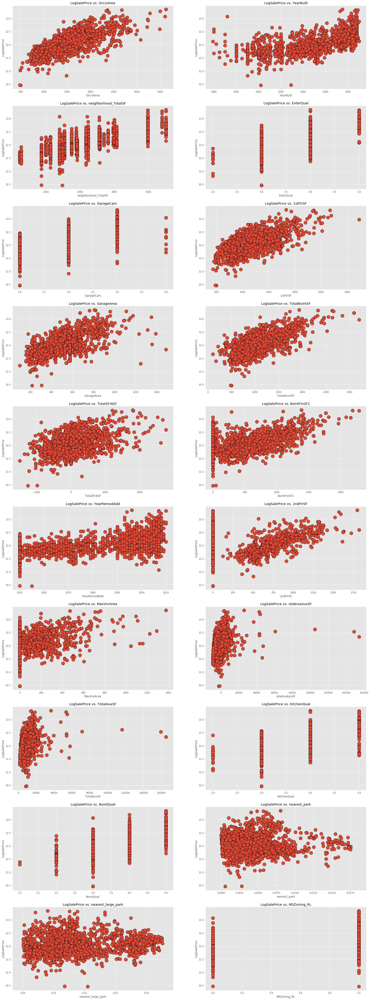

In [619]:
fig, axs = plt.subplots(10,2, figsize=(18, 50))
plt.subplots_adjust(right=1.3, top=1.3)
axs = axs.flatten()
for i, col in enumerate(list(FI['feature'][:20])):
    sns.scatterplot(y='LogSalePrice', x=col, s = 200,ax=axs[i],
                    edgecolor = 'black',data=geo_train)
    axs[i].set_ylabel('LogSalePrice')
    axs[i].set_xlabel(col)
    axs[i].set_title(f'LogSalePrice vs. {col}')
plt.show()

# Random Forest w/ just engineered geo features

In [198]:
#geo_train.head(0).T

In [717]:
len(list(geo_train.columns))

195

In [718]:
len(list(train.columns))

172

In [719]:
len(list(housing.columns))

81

In [620]:
X_train = geo_train.loc[:,'nearest_park':'YearBuilt-NYearBuilt'].drop(['neighborhood_Price/SF',
                                                                       'neighborhood_median_price',
                                                                       'Price/SF-NPrice/SF',
                                                                       'SalePrice-NMedPrice','neighborhood_TotalSF',
                                                                      'TotalSf-NSF'],axis = 1)

X_test = geo_test.loc[:,'nearest_park':'YearBuilt-NYearBuilt'].drop(['neighborhood_Price/SF',
                                                                       'neighborhood_median_price',
                                                                       'Price/SF-NPrice/SF',
                                                                       'SalePrice-NMedPrice','neighborhood_TotalSF',
                                                                      'TotalSf-NSF'],axis = 1)

y_train = geo_train['LogSalePrice']
y_test = geo_test['LogSalePrice']

scaler = StandardScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
scaler.fit(X_test)
X_test_scaled =  scaler.transform(X_test)

randomForest = RandomForestRegressor()

da_grid = {'n_estimators':np.arange(20,30),
           'criterion':['mse'],
           'max_depth':np.arange(15,20),
           'min_samples_split':[2,4,6]}

grid_search_forest = GridSearchCV(estimator = randomForest, param_grid = da_grid, cv = 5)

start_time = time.time()

grid_search_forest.fit(X_train_scaled,y_train)

print(time.time() - start_time)

70.41525053977966


C:\Users\robla\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:841: DeprecationWarning:

The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.



In [621]:
print("Best Parameters: ",grid_search_forest.best_params_,"\n\n",
      "Mean cross-validated score of the best_estimator: ",grid_search_forest.best_score_,"\n")

best_forest = grid_search_forest.best_estimator_

print("Test Score for best Estimator",best_forest.score(X_test_scaled,y_test))

best_forest.feature_importances_
feature_importance = [i for i in zip(X_train.columns,best_forest.feature_importances_)]
feature_importance = sorted(feature_importance,key = lambda x: x[1],reverse = True)
#feature_importance

FI = pd.DataFrame(feature_importance,columns = ['feature','importance'])

fig = px.bar(data_frame = FI.iloc[:,:],
             x = 'feature',
             y = 'importance',
             title = f"Feature Importance against {pd.DataFrame(y_train).columns[0]}",
             color = 'importance',height = 800)
fig.show()

cv_results = pd.DataFrame(grid_search_forest.cv_results_)
cv_results = cv_results.loc[cv_results['param_min_samples_split'] == grid_search_forest.best_params_['min_samples_split']]

fig = px.line(data_frame = cv_results, x = 'param_n_estimators', y = 'mean_test_score',color = 'param_max_depth',title = 'Mean Test Score vs. max_depth and n_estimators: min_samples_split = 4')
fig.show()

Best Parameters:  {'criterion': 'mse', 'max_depth': 17, 'min_samples_split': 2, 'n_estimators': 23} 

 Mean cross-validated score of the best_estimator:  0.08417276124704526 

Test Score for best Estimator 0.578366513711295


# Multiple Linear Regression with features selected by feature importance in RandomForest regression

In [622]:
def reg_significance_filter(train_df,test_df,feature_list,coupled_var,target_var,alpha,scale = True):
    
    """
    fits OLS regression model and returns coef + p-value summary and list of statistically significant columns
    """
    
    
    if scale:
        
    
        X_train =  train_df[feature_list]
        X_test = geo_test[feature_list]
        y_train = geo_train[[coupled_var,target_var]]
        y_test = geo_test[[coupled_var,target_var]]


        scaler = StandardScaler()
        scaler.fit(X_train)
        X_train_scaled = scaler.transform(X_train)
        scaler.fit(X_test)
        X_test_scaled =  scaler.transform(X_test)

        X_add_const = sm.add_constant(X_train_scaled)
        model = sm.RLM(y_train[target_var], X_add_const,M=sm.robust.norms.HuberT())
        results = model.fit()
        summary = results.summary()

        C = ['C']
        C = C + feature_list
        coef_dict = dict(zip(C,list(results.params)))

        Summary = pd.DataFrame({'coef':list(coef_dict.keys()),
                                'value':list(coef_dict.values()),
                                'P-Val':results.pvalues})

        significant_columns = list(Summary.loc[Summary['P-Val'] <= alpha].iloc[1:,:]['coef'])
        
        return results,X_train_scaled,X_test_scaled,y_train[target_var],y_test[target_var],Summary,significant_columns
        
    else:
        
        X_train =  train_df[feature_list]
        X_test = geo_test[feature_list]
        y_train = geo_train[[coupled_var,target_var]]
        y_test = geo_test[[coupled_var,target_var]]
        
        X_add_const = sm.add_constant(X_train)
        model = sm.RLM(y_train[target_var], X_add_const,M=sm.robust.norms.HuberT())
        results = model.fit()
        summary = results.summary()

        C = ['C']
        C = C + feature_list
        coef_dict = dict(zip(C,list(results.params)))

        Summary = pd.DataFrame({'coef':list(coef_dict.keys()),
                                'value':list(coef_dict.values()),
                                'P-Val':results.pvalues})

        significant_columns = list(Summary.loc[Summary['P-Val'] <= .05].iloc[1:,:]['coef'])
        
        return results,X_train,X_test,y_train[target_var],y_test[target_var],Summary,significant_columns

In [643]:
r1,X_train,X_test,y_train,y_test,sum_1,sig_1 = reg_significance_filter(geo_train,geo_test,
                                                                       feature_list=list(full_geo_importances['feature'])[:30],
                                                                       coupled_var = 'MapRefNo',
                                                                       target_var = 'LogSalePrice',
                                                                       alpha = .05,scale = True)
print(r1.summary())

r1,X_train,X_test,y_train,y_test,sum_1,sig_1 = reg_significance_filter(geo_train,geo_test,
                                                                       feature_list=sig_1,
                                                                       coupled_var = 'MapRefNo',
                                                                       target_var = 'LogSalePrice',
                                                                       alpha = .05,scale = True)

print(r1.summary())


r1,X_train,X_test,y_train,y_test,sum_1,sig_1 = reg_significance_filter(geo_train,geo_test,
                                                                       feature_list=sig_1,
                                                                       coupled_var = 'MapRefNo',
                                                                       target_var = 'LogSalePrice',
                                                                       alpha = .05,scale = True)

print(r1.summary())



r1,X_train,X_test,y_train,y_test,sum_1,sig_1 = reg_significance_filter(geo_train,geo_test,
                                                                       feature_list=sig_1,
                                                                       coupled_var = 'MapRefNo',
                                                                       target_var = 'LogSalePrice',
                                                                       alpha = .05,scale = True)

print(r1.summary())

print(sig_1)



y_pred = r1.predict(sm.add_constant(X_test))

residuals = y_test - y_pred

Errors = pd.DataFrame({'actual':y_test,'predicted': y_pred,'residuals': residuals})

fig = px.scatter(data_frame = Errors, x = 'predicted',y = 'residuals',title = 'Residuals vs. Predicted House Prices')
fig.show()

                    Robust linear Model Regression Results                    
Dep. Variable:           LogSalePrice   No. Observations:                 1922
Model:                            RLM   Df Residuals:                     1893
Method:                          IRLS   Df Model:                           28
Norm:                          HuberT                                         
Scale Est.:                       mad                                         
Cov Type:                          H1                                         
Date:                Wed, 08 Sep 2021                                         
Time:                        05:47:47                                         
No. Iterations:                    37                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         12.0545      0.002   5073.140      0.0

parameters, then the fit options might not be the correct ones anymore .
                    Robust linear Model Regression Results                    
Dep. Variable:           LogSalePrice   No. Observations:                 1922
Model:                            RLM   Df Residuals:                     1903
Method:                          IRLS   Df Model:                           18
Norm:                          HuberT                                         
Scale Est.:                       mad                                         
Cov Type:                          H1                                         
Date:                Wed, 08 Sep 2021                                         
Time:                        05:47:47                                         
No. Iterations:                    37                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------

In [644]:
import scipy.stats as sc

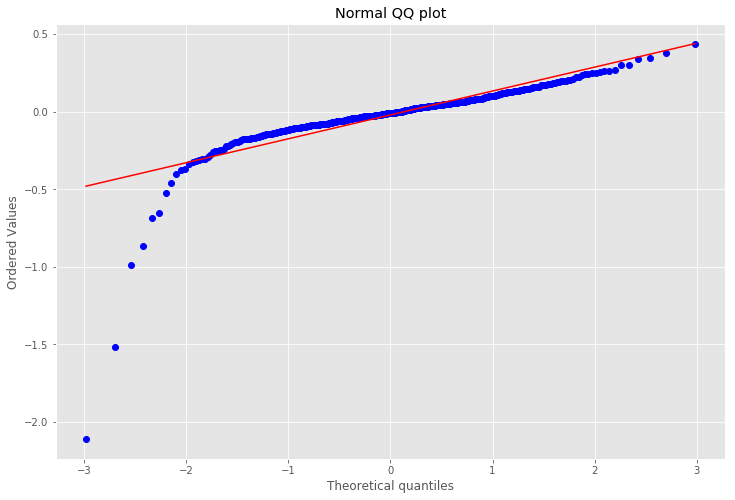

In [645]:
fig,ax = plt.subplots(figsize = (12,8))
ax.set_size_inches = (30,30)
sc.probplot(x= residuals, dist='norm', fit=True, plot=plt)
plt.title("Normal QQ plot")
plt.show()

In [646]:
from sklearn.linear_model import HuberRegressor

In [647]:
hub = HuberRegressor()

hub.fit(X_train,y_train)

hub.score(X_test,y_test)

0.7851440054315798

In [648]:
hub.score(X_train,y_train)

0.8885852463206841

In [649]:
hub.coef_

array([ 0.03856115,  0.0291609 ,  0.03931212,  0.15475077,  0.03480624,
        0.03408966,  0.10818965,  0.01733301,  0.01733301,  0.02997238,
        0.02884051, -0.00585735, -0.02103734,  0.01814455,  0.02646746,
        0.03698941, -0.01973594, -0.01954247,  0.01814041])

# Lasso Regression with features selected by feature importance in RandomForest regression

In [652]:
lasso = Lasso(normalize = True)


X_train = geo_train[sig_1]
X_test = geo_test[sig_1]


y_train = geo_train['LogSalePrice']
y_test = geo_test['LogSalePrice']

scaler = StandardScaler()
scaler.fit(X_train)
X_train_scaled = scaler.transform(X_train)
scaler.fit(X_test)
X_test_scaled =  scaler.transform(X_test)


alpha_range = np.linspace(0,.01,100)
lasso.set_params(normalize=True)
coefs_lasso  = []
scores = []
scores_train = []

for alpha in alpha_range:
        lasso.set_params(alpha=alpha)
        lasso.fit(X_train_scaled,y_train)  
        coefs_lasso.append(lasso.coef_)
        scores.append(lasso.score(X_test_scaled,y_test))
        scores_train.append(lasso.score(X_train_scaled,y_train))

coefs_lasso = pd.DataFrame(coefs_lasso, index = alpha_range, columns = X_train.columns)  
score_lasso = pd.DataFrame({'R^2':scores},index = alpha_range)
score_lasso_train = pd.DataFrame({'R^2':scores_train},index = alpha_range)


fig = px.line(coefs_lasso,x = coefs_lasso.index,
              y = coefs_lasso.columns,title = "Lasso Coefs vs. Lambda",
              range_x=(0,.01),height = 800,width = 1000)
fig.show()

fig = px.line(score_lasso,x = score_lasso.index,
              y = score_lasso['R^2'],title = "Lasso Test R^2 vs. Lambda",
              range_x=(0,.01),height = 800,width = 1000)
fig.show()

fig = px.line(score_lasso_train,x = score_lasso_train.index,
              y = score_lasso_train['R^2'],title = "Lasso Train R^2 vs. Lambda",
              range_x=(0,.01),height = 800,width = 1000)
fig.show()

In [654]:
df = coefs_lasso.iloc[:1,:].T

lambda_ = list(df.columns)[0] 

df.columns = ['coef']

df = df.reset_index()
df = df.sort_values(by = 'coef', ascending = False)

fig = px.bar(data_frame = df, x = 'index', y = 'coef', color = 'index',title = f'Coefs at lambda = {lambda_}', height = 800)
fig.show()

In [710]:
list(dc.loc[dc['var'] == 'Functional']['var']),list(dc.loc[dc['var'] == 'Functional']['descr'])

(['Functional'],
 [' Home functionality (Assume typical unless deductions are warranted)'])

In [705]:
list(dc.loc[dc['var'] == 'MSSubClass']['descr'])

[' Identifies the type of dwelling involved in the sale.']

In [707]:
list(dc.loc[dc['var'] == 'MSZoning']['descr'])

[' Identifies the general zoning classification of the sale.']

In [711]:
list(dc.loc[dc['var'] == 'ExterQual']['descr'])

[' Evaluates the quality of the material on the exterior']

In [712]:
list(dc.loc[dc['var'] == 'OverallQual']['descr'])

[' Rates the overall material and finish of the house']

In [713]:
list(dc.loc[dc['var'] == 'GrLivArea']['descr'])

[' Above grade (ground) living area square feet']

In [714]:
list(dc.loc[dc['var'] == 'BsmtQual']['descr'])

[' Evaluates the height of the basement']

In [715]:
list(dc.loc[dc['var'] == 'Fireplaces']['descr'])

[' Number of fireplaces']

In [716]:
list(dc.loc[dc['var'] == 'KitchenQual']['descr'])

[' Kitchen quality']

In [720]:
list(dc.loc[dc['var'] == 'BsmntFinType1']['descr'])

[]

In [721]:
dc.loc[dc['var'] == 'BsmntFinType1']

,var,descr,associated_outcomes,Variable Type


In [723]:
dd_res

,Field Number,Field Name,Field Start Position,Field Length,Data Type,Description,Notes
0,1,MapRefNo,1,10,Text,Map Reference Number: unique ID for map parcel,No Dashes!!!
1,2,GeoRefNo,11,10,Text,Geo Reference Number: non-unique ID for property,No Dashes!!!
2,3,Tier,21,6,Integer,Tier,Did not bring in when converting to TylerX
3,4,Range,27,6,Integer,Range,Did not bring in when converting to TylerX
4,5,Prop_Addr,33,255,Text,Complete Property Address (7 fields concatenat...,NaN
5,6,ZngCdPr,288,5,Text,"Zoning Code, Primary",NaN
6,7,ZngCdSc,293,5,Text,"Zoning Code, Secondary",NaN
7,8,ZngOLPr,298,5,Text,"Zoning Code -- P & Z Overlay/Floating, Primary",NaN
8,9,ZngOLSc,303,5,Text,"Zoning Code -- P & Z Overlay/Floating, Secondary",NaN
9,10,ClassPr_S,308,11,Text,"Assessor Classification, Primary",NaN


In [724]:
dc

,var,descr,associated_outcomes,Variable Type
42,1stFlrSF,First Floor square feet,[],Numerical
43,2ndFlrSF,Second floor square feet,[],Numerical
68,3SsnPorch,Three season porch area in square feet,[],Numerical
5,Alley,Type of alley access to property,"[Grvl Gravel, Pave Paved, NA No alley ...",Categorical
50,Bedroom,Bedrooms above grade (does NOT include baseme...,[],Numerical
14,BldgType,Type of dwelling,"[1Fam Single-family Detached, 2FmCon Two-fam...",Categorical
30,BsmtCond,Evaluates the general condition of the basement,"[Ex Excellent, Gd Good, TA Typical...",Categorical
31,BsmtExposure,Refers to walkout or garden level walls,"[Gd Good Exposure, Av Average Exposure...",Categorical
33,BsmtFinSF1,Type 1 finished square feet,[],Numerical
35,BsmtFinSF2,Type 2 finished square feet,[],Numerical
